In [56]:
from datetime import datetime, timedelta
import matplotlib.dates as mdates

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import yfinance as yf
import seaborn as sns

def display_first_last_rows(df, n=40):
    '''
    Display the first and last n rows of a DataFrame
    :param df (dataFrame): Input DataFrame
    :param n: number of rows to display
    :return: None, just print the first and last n rows of the DataFrame
    '''
    print(df.head(n))
    print(df.tail(n))

def count_observations(df):
    ''' 
    Count the number of observations in a DataFrame
    :param df (dataFrame): Input DataFrame
    :return: int, the number of observations in the DataFrame
    '''
    return len(df)

def deduce_periodicity(df):
    '''
    Deduce the periodicity of the data in a DataFrame
    :param df (dataFrame): Input DataFrame
    :return: str, the periodicity of the data
    '''
    df.index = pd.to_datetime(df.index)
    diff = df.index.to_series().diff().dropna()
    return diff.mode()[0]

def descriptive_statistics(df):
    '''
    Compute descriptive statistics for a DataFrame
    :param df (dataFrame): Input DataFrame
    :return: summary statistics for the data
    '''
    return df.describe()

def identify_missing_values(df):
    '''
    Identify missing values in a DataFrame
    :param df (dataFrame): Input DataFrame
    :return: Series, the number of missing values in each column
    '''
    return df.isna().sum()

def handle_missing_values(df):
    '''
    Handle missing values in a DataFrame
    :param df (dataFrame): Input DataFrame
    :return: dataFrame, the DataFrame with missing values handled
    '''
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    return df.fillna(df[numeric_columns].mean())

def detect_anomalies(df, column, window=365):
    '''
    Detect anomalies in a time series data using the IQR (interquartile range) method
    :param df (dataFrame): Input DataFrame
    :param column (str): Column to detect anomalies
    :param window (int): Window size for the rolling window
    :return: dataFrame, the anomalies in the data
    '''
    rolling_df = df[column].rolling(window=window, center=True)
    Q1 = rolling_df.quantile(0.25)
    Q3 = rolling_df.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    anomalies = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return anomalies

def handle_anomalies(df, column, stock_name,  window=365):
    '''
    Handle anomalies in a time series data using the rolling mean method
    :param df (dataFrame): Input DataFrame
    :param column (str): Column to handle anomalies
    :param stock_name (str): Stock name
    :param window (int): Window size for the rolling window
    :return: dataFrame, the DataFrame with anomalies handled
    '''
    anomalies = detect_anomalies(df, column)
    plot_stock_data_with_anomalies(data, stock_name, column, is_anomalies=True)
    print(f"Found {len(anomalies)} anomalies in {column}")
    df.loc[anomalies.index, column] = np.nan
    rolling_mean = df[column].rolling(window=window, center=True).mean()
    df.loc[:, column] = df[column].fillna(rolling_mean)
    return df

def calculate_moving_average(df, column, window):
    '''
    Calculate the moving average for a column in a DataFrame
    :param df (dataFrame): Input DataFrame
    :param column (str): Column to calculate the moving average
    :param window (int): Window size for the moving average
    :return: dataFrame, the DataFrame with the moving average column added
    '''
    df[f'MA_{window}'] = df[column].rolling(window=window).mean()
    return df

def calculate_correlation(cleaned_data):
    '''
    Calculate the correlation between the returns of different stocks
    :param cleaned_data (dict): Dictionary containing the cleaned stock data
    :return: dataFrame, the correlation matrix
    '''
    returns = {ticker: df['Close'].pct_change(fill_method=None) for ticker, df in cleaned_data.items()}
    return pd.DataFrame(returns).corr()

def calculate_performance(df):
    '''
    Calculate the performance of a stock
    :param df (dataFrame): Input DataFrame
    :return: float, the performance of the stock
    '''
    initial_price = df['Close'].iloc[0]
    final_price = df['Close'].iloc[-1]
    return (final_price - initial_price) / initial_price

def calculate_annualized_return(df):
    '''
    Calculate the annualized return of a stock
    :param df (dataFrame): Input DataFrame
    :return: float, the annualized return of the stock
    '''
    initial_price = df['Close'].iloc[0]
    final_price = df['Close'].iloc[-1]
    print(df.head())
    print(df.tail())
    start_date = df['Date'].iloc[0]
    end_date = df['Date'].iloc[-1]
    n_years = (end_date- start_date).days / 365.25
    return (final_price / initial_price) ** (1 / n_years) - 1

def calculate_volatility(df):
    '''
    Calculate the volatility of a stock
    :param df (dataFrame): Input DataFrame
    :return: float, the volatility of the stock
    '''
    df['daily_return'] = df['Close'].pct_change(fill_method=None)
    df['Volatility'] = df['daily_return'].std()
    return df['daily_return'].std()

def calculate_sharpe_ratio(df, risk_free_rate=0.01):
    '''
    Calculate the Sharpe ratio of a stock
    :param df (dataFrame): Input DataFrame
    :param risk_free_rate (float): Risk-free rate
    :return: float, the Sharpe ratio of the stock
    '''
    df['daily_return'] = df['Close'].pct_change(fill_method=None)
    mean_return = df['daily_return'].mean()
    std_dev = df['daily_return'].std()
    return (mean_return - risk_free_rate) / std_dev

def plot_trends(df, ticker):
    '''
    Plot the trends for a stock
    :param df (dataFrame): Input DataFrame
    :param ticker (str): Stock ticker
    :return: None, just plot the trends
    '''
    plt.figure(figsize=(14, 7))
    df_filtered = df[df['Date'] >= datetime.now() - timedelta(days=3*365)]
    plt.plot(df_filtered['Date'], df_filtered['Close'], label='Close Price')
    for column in df.columns:
        if column.startswith('MA_'):
            plt.plot(df_filtered['Date'], df_filtered[column], label=column)
    plt.title(f'Trend Analysis for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend()
    plt.show()

def plot_stock_data_with_anomalies(data, stock_name, column, is_anomalies=True):
    '''
    Plot the stock data with anomalies
    :param data (dict): Dictionary containing the stock data
    :param stock_name (str): Stock name
    :param column (str): Column to plot
    :param is_anomalies (bool): Whether to plot anomalies or after handling anomalies
    :return: None, just plot the stock data
    '''
    df = data[stock_name]
    anomalies = detect_anomalies(df, column)
    plt.figure(figsize=(14, 7))
    plt.plot(df.index, df[column], label='Data')
    plt.scatter(anomalies.index, anomalies[column], color='red', label='Anomalies')

    legend = f'{stock_name} - {column} with Anomalies' if is_anomalies else f'{stock_name} - {column} after Anomalies Handling'
    plt.title(legend)
    plt.xlabel('Date')
    plt.ylabel(column)
    plt.legend()
    plt.show()
    
def calculate_daily_return(df):
    """
    Calculate the daily return based on the opening and closing prices.
    :param df (DataFrame): Input DataFrame
    :return: DataFrame with 'Daily Return' column added
    """
    df['Daily Return'] = (df['Close'] - df['Open']) / df['Open']
    return df

def calculate_average_daily_return(df):
    """
    Calculate the average daily return for different periods.
    :param df (DataFrame): Input DataFrame
    :return: dict with average daily returns for different periods
    """
    df = calculate_daily_return(df)
    avg_daily_return = {
        'weekly': df['Daily Return'].resample('W').mean(),
        'monthly': df['Daily Return'].resample('ME').mean(),
        'yearly': df['Daily Return'].resample('YE').mean(),
    }
    return avg_daily_return

def calculate_average_prices(df):
    '''
    Calculate the average prices for different time periods
    :param df (dataFrame): Input DataFrame
    :return: dict, the average prices for different time periods
    '''
    
    avg_prices = {
        'daily': df[['Open', 'Close']].resample('D').mean(),
        'weekly': df[['Open', 'Close']].resample('W').mean(),
        'monthly': df[['Open', 'Close']].resample('ME').mean(),
        'yearly': df[['Open', 'Close']].resample('YE').mean(),
    }
    return avg_prices

def calculate_price_changes(df):
    """
    Calculate the price changes for a stock
    :param df (dataFrame): Input DataFrame
    :return: dataFrame, the DataFrame with the price changes added
    """
    df['Daily Change'] = df['Close'].diff()

    monthly_close = df['Close'].resample('ME').ffill()
    monthly_change = monthly_close.diff()
    monthly_change.name = 'Monthly Change'

    df = df.merge(monthly_change, left_index=True, right_index=True, how='left')
    df['Monthly Change'].fillna(method='ffill', inplace=True)

    return df

def calculate_bollinger_bands(df, window=20):
    """
    Calculate the Bollinger Bands for a stock
    :param df (dataFrame): Input DataFrame
    :param window (int): Window size for the moving average
    :return: dataFrame, the DataFrame with the Bollinger Bands added
    """
    df = df.copy()
    df['MA20'] = df['Close'].rolling(window=window).mean()
    df['STD20'] = df['Close'].rolling(window=window).std()
    df['Upper Band'] = df['MA20'] + (df['STD20'] * 2)
    df['Lower Band'] = df['MA20'] - (df['STD20'] * 2)
    return df

def plot_bollinger_bands(cleaned_data, tickers):
    """
    Plot the Bollinger Bands for different stocks
    :param cleaned_data (dict): Dictionary containing the cleaned stock data
    :param tickers (list): List of stock tickers
    :return: None, just plot the Bollinger Bands
    """
    end_date = datetime.now()
    start_date = end_date - timedelta(days=3*365)

    for ticker in tickers:
        df = cleaned_data[ticker]


        df_filtered = df[df['Date'] >= start_date]
        df_filtered = calculate_bollinger_bands(df_filtered)

        plt.figure(figsize=(14, 7))
        plt.plot(df_filtered['Date'], df_filtered['Close'], label=f'{ticker} Close Price')
        plt.plot(df_filtered['Date'], df_filtered['Upper Band'], label='Upper Band', color='red')
        plt.plot(df_filtered['Date'], df_filtered['Lower Band'], label='Lower Band', color='green')
        plt.plot(df_filtered['Date'], df_filtered['MA20'], label='MA20',alpha=0.5)
        plt.fill_between(df_filtered['Date'], df_filtered['Lower Band'], df_filtered['Upper Band'], color='blue', alpha=0.1)

        plt.title(f'Bollinger Bands for {ticker} - Last 3 Years')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend(loc='best')
        plt.show()

def calculate_macd(df, short_window=12, long_window=26, signal_window=9):
    """
    Calculate the Moving Average Convergence Divergence (MACD) for a stock
    :param df (dataFrame): Input DataFrame
    :param short_window (int): Short window size for the EMA
    :param long_window (int): Long window size for the EMA
    :param signal_window (int): Signal line window size
    :return: dataFrame, the DataFrame with the MACD added
    """
    df['EMA12'] = df['Close'].ewm(span=short_window, adjust=False).mean()
    df['EMA26'] = df['Close'].ewm(span=long_window, adjust=False).mean()
    df['MACD'] = df['EMA12'] - df['EMA26']
    df['Signal Line'] = df['MACD'].ewm(span=signal_window, adjust=False).mean()
    df['MACD Histogram'] = df['MACD'] - df['Signal Line']
    return df

def plot_macd(ticker):
    '''
    Plot the Moving Average Convergence Divergence (MACD) for a stock
    :param ticker (str): Stock ticker
    :return: None, just plot the MACD
    '''
    
    end_date = datetime.now()
    start_date = end_date - timedelta(days=3*365)

    df = cleaned_data[ticker]
    df = calculate_macd(df)
    df_filtered = df[df['Date'] >= start_date]

    plt.figure(figsize=(14, 7))
    plt.plot(df_filtered['Date'], df_filtered['MACD'], label='MACD', color='blue')
    plt.plot(df_filtered['Date'], df_filtered['Signal Line'], label='Signal Line', color='red')
    plt.bar(df_filtered['Date'], df_filtered['MACD Histogram'], label='MACD Histogram', color=['green' if val >= 0 else 'red' for val in df_filtered['MACD Histogram']], alpha=0.6)

    plt.title(f'MACD for {ticker} - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('MACD')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.show()

def calculate_rsi(df, window=14):
    """
    Calculate the Relative Strength Index (RSI) for a stock
    :param df (dataFrame): Input DataFrame
    :param window (int): Window size for the EMA
    :return: dataFrame, the DataFrame with the RSI added
    """
    delta = df['Close'].diff()
    gain = delta.clip(lower=0)
    loss = -delta.clip(upper=0)
    avg_gain = gain.ewm(com=window - 1, adjust=False).mean()
    avg_loss = loss.ewm(com=window - 1, adjust=False).mean()
    rs = avg_gain / avg_loss
    df.loc[:, 'RSI'] = 100 - (100 / (1 + rs))
    return df

def plot_close_price_with_rsi(df, ticker):
    """
    Plot the Close Price and Relative Strength Index (RSI) for a stock
    :param df (dataFrame): Input DataFrame
    :param ticker (str): Stock ticker
    :return: None, just plot the Close Price and RSI
    """
    end_date = datetime.now()
    start_date = end_date - timedelta(days=3*365)

    df_filtered = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

    plt.figure(figsize=(14, 10))

    #close price
    plt.subplot(2, 1, 1)
    plt.plot(df_filtered['Date'], df_filtered['Close'], label='Close Price')
    plt.title(f'Close Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='best')
    plt.grid(True)
    #rsi 
    plt.subplot(2, 1, 2)
    plt.plot(df_filtered['Date'], df_filtered['RSI'], label='RSI', color='purple')
    plt.axhline(70, color='purple', linestyle='--', linewidth=1)
    plt.axhline(30, color='purple', linestyle='--', linewidth=1)
    plt.fill_between(df_filtered['Date'], 30, 70, color='purple', alpha=0.1)
    plt.title(f'RSI for {ticker} - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    plt.show()

def plot_rsi(ticker):
    """
    Plot the Relative Strength Index (RSI) for a stock
    :param ticker (str): Stock ticker
    :return: None, just plot the RSI
    """
    end_date = datetime.now()
    start_date = end_date - timedelta(days=3*365)

    
    df = cleaned_data[ticker]
    df = calculate_rsi(df)

    df_filtered = df[df['Date'] >= start_date]

    plt.figure(figsize=(14, 7))
    plt.plot(df_filtered['Date'], df_filtered['RSI'], label='RSI', color='purple')

    plt.axhline(70, color='purple', linestyle='--', linewidth=1)
    plt.axhline(30, color='purple', linestyle='--', linewidth=1)

    plt.fill_between(df_filtered['Date'], 30, 70, color='purple', alpha=0.1)

    plt.title(f'RSI for {ticker} - Last 3 Years')
    plt.xlabel('Date')
    plt.ylabel('RSI')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.show()

def plot_close_price_with_macd(df, ticker):
    '''
    Plot the Close Price and Moving Average Convergence Divergence (MACD) for a stock
    :param df (dataFrame): Input DataFrame
    :param ticker (str): Stock ticker
    :return: None, just plot the Close Price and MACD
    '''
    plt.figure(figsize=(14, 10))
    plt.subplot(2, 1, 1)
    plt.plot(df['Date'], df['Close'], label='Close Price')
    plt.title(f'Close Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='best')
    plt.grid(True)
    plt.subplot(2, 1, 2)
    plt.plot(df['Date'], df['MACD'], label='MACD', color='blue')
    plt.plot(df['Date'], df['Signal Line'], label='Signal Line', color='red')
    plt.bar(df['Date'], df['MACD Histogram'], label='MACD Histogram', color=['green' if val >= 0 else 'red' for val in df['MACD Histogram']], alpha=0.6)
    plt.title(f'MACD for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('MACD')
    plt.legend(loc='best')
    plt.grid(True)

    plt.gca().xaxis.set_major_locator(mdates.YearLocator())
    plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

    plt.tight_layout()
    plt.show()

def calculate_ichimoku(df):
    '''
    Calculate the Ichimoku Cloud for a stock
    :param df (dataFrame): Input DataFrame
    :return: dataFrame, the DataFrame with the Ichimoku Cloud added
    '''
    high_9 = df['High'].rolling(window=9).max()
    low_9 = df['Low'].rolling(window=9).min()
    df['Tenkan_sen'] = (high_9 + low_9) / 2

    high_26 = df['High'].rolling(window=26).max()
    low_26 = df['Low'].rolling(window=26).min()
    df['Kijun_sen'] = (high_26 + low_26) / 2

    df['Chikou_span'] = df['Close'].shift(-26)

    df['Senkou_span_a'] = ((df['Tenkan_sen'] + df['Kijun_sen']) / 2).shift(26)

    high_52 = df['High'].rolling(window=52).max()
    low_52 = df['Low'].rolling(window=52).min()
    df['Senkou_span_b'] = ((high_52 + low_52) / 2).shift(26)
    return df

def plot_closing_price_and_ichimoku(tickers, cleaned_data,):
    '''
    Plot the Closing Price and Ichimoku Cloud for different stocks
    :param tickers (list): List of stock tickers
    :param cleaned_data (dict): Dictionary containing the cleaned stock data
    :return: None, just plot the Closing Price and Ichimoku Cloud
    '''
    start_date = datetime.now() - timedelta(days=1*365)
    end_date = datetime.now()
    for ticker in tickers:
        df = cleaned_data[ticker]
        df = calculate_ichimoku(df)

        df_filtered = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]

        plt.figure(figsize=(14, 7))

        plt.plot(df_filtered['Date'], df_filtered['Close'], label='Close', color='black')

        plt.plot(df_filtered['Date'], df_filtered['Tenkan_sen'], label='Tenkan-sen', color='red')
        plt.plot(df_filtered['Date'], df_filtered['Kijun_sen'], label='Kijun-sen', color='blue')
        plt.plot(df_filtered['Date'], df_filtered['Chikou_span'], label='Chikou Span', color='green')
        plt.plot(df_filtered['Date'], df_filtered['Senkou_span_a'], label='Senkou Span A', color='orange')
        plt.plot(df_filtered['Date'], df_filtered['Senkou_span_b'], label='Senkou Span B', color='purple')
        plt.fill_between(df_filtered['Date'], df_filtered['Senkou_span_a'], df_filtered['Senkou_span_b'],
                         where=df_filtered['Senkou_span_a'] >= df_filtered['Senkou_span_b'], color='green', alpha=0.2)
        plt.fill_between(df_filtered['Date'], df_filtered['Senkou_span_a'], df_filtered['Senkou_span_b'],
                         where=df_filtered['Senkou_span_a'] < df_filtered['Senkou_span_b'], color='red', alpha=0.2)

        plt.title(f'Ichimoku for {ticker} - Last Year')
        plt.xlabel('Date')
        plt.ylabel('Price')
        plt.legend(loc='best')
        plt.grid(True)

        plt.gca().xaxis.set_major_locator(mdates.YearLocator())
        plt.gca().xaxis.set_minor_locator(mdates.MonthLocator())
        plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

        plt.show()

def calculate_monthly_returns(df):
    '''
    Calculate the monthly returns for a stock
    :param df (dataFrame): Input DataFrame
    :return: dataFrame, the DataFrame with the monthly returns added
    '''
    df['Year'] = df.index.year
    df['Month'] = df.index.month
    df['Monthly Return'] = df['Close'].pct_change(periods=21, fill_method=None) * 100
    return df

def create_seasonality_table(df, start_year):
    """
    Create a seasonality table for a stock
    :param df (dataFrame): Input DataFrame
    :param start_year (int): Start year for the seasonality table
    :return: dataFrame, the seasonality table
    """
    df = df[df['Year'] >= start_year]
    seasonality_table = df.pivot_table(values='Monthly Return', index='Year', columns='Month', aggfunc='mean')
    seasonality_table.loc['Average'] = seasonality_table.mean()
    seasonality_table.loc['StDev'] = seasonality_table.std()
    seasonality_table.loc['Pos%'] = (seasonality_table > 0).mean() * 100
    return seasonality_table

def plot_seasonality_table(seasonality_table, ticker):
    """
    Plot the seasonality table for a stock
    :param seasonality_table (dataFrame): Seasonality table
    :param ticker (str): Stock ticker
    :return: None, just plot the seasonality table
    """
    plt.figure(figsize=(12, 8))

    cmap = sns.diverging_palette(30,130, as_cmap=True, s=300, l=50 )

    ax = sns.heatmap(seasonality_table, annot=True, fmt=".2f", cmap=cmap, center=0, cbar_kws={'label': 'Monthly Return (%)'})

    month_names = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
    ax.set_xticklabels(month_names)

    ax.set_title(f'Seasonality Table for {ticker} - Last 10 Years')
    ax.set_xlabel('Month')
    ax.set_ylabel('Year')
    plt.show()

def process_and_plot_seasonality(start_year):
    """
    Process and plot the seasonality for different stocks
    :param start_year (int): Start year for the seasonality table
    :return: None, just plot the seasonality table
    """
    for ticker, df in data.items():
        df = calculate_monthly_returns(df)
        seasonality_table = create_seasonality_table(df, start_year)
        plot_seasonality_table(seasonality_table, ticker)

def calculate_ao(df, short_window=5, long_window=34):
    """
    Calculate the Awesome Oscillator (AO) for a stock
    :param df (dataFrame): Input DataFrame
    :param short_window (int): Short window size for the AO
    :param long_window (int): Long window size for the AO
    :return: dataFrame, the DataFrame with the AO added
    """
    median_price = (df['High'] + df['Low']) / 2
    df['AO'] = median_price.rolling(window=short_window).mean() - median_price.rolling(window=long_window).mean()
    return df

def plot_close_price_with_ao(df, ticker):
    '''
    Plot the Close Price and Awesome Oscillator (AO) for a stock
    :param df (dataFrame): Input DataFrame
    :param ticker (str): Stock ticker
    :return: None, just plot the Close Price and AO
    '''
    end_date = datetime.now()
    start_date = end_date - timedelta(days=365)

    df_filtered = df[df['Date'] >= start_date]

    plt.figure(figsize=(14, 10))

    plt.subplot(2, 1, 1)
    plt.plot(df_filtered['Date'], df_filtered['Close'], label='Close Price')
    plt.title(f'Close Price for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.legend(loc='best')
    plt.grid(True)
    colors = ['green' if df_filtered['AO'].iloc[i] > df_filtered['AO'].iloc[i-1] else 'red' for i in range(1, len(df_filtered))]
    colors.insert(0, 'green') 
    plt.subplot(2, 1, 2)
    plt.bar(df_filtered.index, df_filtered['AO'], label='AO', color=colors, alpha=0.6)
    plt.title(f'Awesome Oscillator for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('AO')
    plt.legend(loc='best')
    plt.grid(True)
    #
    plt.subplot(2, 1, 1)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
    plt.gca().xaxis.set_minor_locator(mdates.WeekdayLocator())
    #   
    plt.subplot(2, 1, 2)
    plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
    plt.gca().xaxis.set_major_formatter(mdates.DateFormatter(''))
    plt.gca().xaxis.set_minor_locator(mdates.WeekdayLocator())

    plt.tight_layout()
    plt.show()

def simulate_portfolio(data, initial_balance=10000, risk_profile='modéré', strategy='ao',months=6):
    '''
    Simulate a portfolio based on a given risk profile and strategy, during a specific period of time
    :param data (dict): Dictionary containing the stock data
    :param initial_balance (float): Initial balance for the portfolio
    :param risk_profile (str): Risk profile for the portfolio
    :param strategy (str): Trading strategy to use
    :param months (int): Number of months to simulate
    :return: dict, the portfolio with the stock allocations
    '''
    allocations = {
        'conservateur': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15},
        'modéré': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15},
        'agressif': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15},
        'everything': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15}
    }

    if risk_profile not in allocations:
        raise ValueError(f"Invalid risk profile: {risk_profile}. Choose from {list(allocations.keys())}")

    portfolio = {ticker: 0 for ticker in data.keys()}
    balance = initial_balance

    start_date = (datetime.now() - timedelta(days=months*30)).strftime('%Y-%m-%d')
    end_date = datetime.now().strftime('%Y-%m-%d')

    date_range = pd.date_range(start=start_date, end=end_date, freq='D').strftime('%Y-%m-%d')

    for ticker, df in data.items():
        try:
            df['Date'] = pd.to_datetime(df['Date'])
            df.set_index('Date', inplace=True)
        except:
            pass

    for date in date_range:
        for ticker, df in data.items():
            try:
                if date in df.index:
                    allocation = allocations[risk_profile].get(ticker, 0)
                    amount_to_invest = balance * allocation

                    if strategy == 'ao':
                        ao = df.loc[date, 'AO']
                        if ao > 0 and portfolio[ticker] == 0:
                            shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                            if shares_to_buy > 0:
                                balance -= shares_to_buy * df.loc[date, 'Close']
                                portfolio[ticker] += shares_to_buy
                        elif ao < 0 and portfolio[ticker] > 0:
                            shares_to_sell = portfolio[ticker]
                            if shares_to_sell > 0:
                                balance += shares_to_sell * df.loc[date, 'Close']
                                portfolio[ticker] = 0

                    elif strategy == 'rsi':
                        rsi = df.loc[date, 'RSI']
                        if rsi < 30 and portfolio[ticker] == 0:
                            shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                            if shares_to_buy > 0:
                                balance -= shares_to_buy * df.loc[date, 'Close']
                                portfolio[ticker] += shares_to_buy
                        elif rsi > 70 and portfolio[ticker] > 0:
                            shares_to_sell = portfolio[ticker]
                            if shares_to_sell > 0:
                                balance += shares_to_sell * df.loc[date, 'Close']
                                portfolio[ticker] = 0

                    elif strategy == 'macd':
                        macd = df.loc[date, 'MACD']
                        signal_line = df.loc[date, 'Signal Line']
                        if macd > signal_line and portfolio[ticker] == 0:
                            shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                            if shares_to_buy > 0:
                                balance -= shares_to_buy * df.loc[date, 'Close']
                                portfolio[ticker] += shares_to_buy
                        elif macd < signal_line and portfolio[ticker] > 0:
                            shares_to_sell = portfolio[ticker]
                            if shares_to_sell > 0:
                                balance += shares_to_sell * df.loc[date, 'Close']
                                portfolio[ticker] = 0

                    elif strategy == 'ichimoku':
                        tenkan_sen = df.loc[date, 'Tenkan_sen']
                        kijun_sen = df.loc[date, 'Kijun_sen']
                        if tenkan_sen > kijun_sen and portfolio[ticker] == 0:
                            shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                            if shares_to_buy > 0:
                                balance -= shares_to_buy * df.loc[date, 'Close']
                                portfolio[ticker] += shares_to_buy
                        elif tenkan_sen < kijun_sen and portfolio[ticker] > 0:
                            shares_to_sell = portfolio[ticker]
                            if shares_to_sell > 0:
                                balance += shares_to_sell * df.loc[date, 'Close']
                                portfolio[ticker] = 0

                    elif strategy == 'ma':
                        ma_short = df.loc[date, 'MA_20']
                        ma_long = df.loc[date, 'MA_50']
                        if ma_short > ma_long and portfolio[ticker] == 0:
                            shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                            if shares_to_buy > 0:
                                balance -= shares_to_buy * df.loc[date, 'Close']
                                portfolio[ticker] += shares_to_buy
                        elif ma_short < ma_long and portfolio[ticker] > 0:
                            shares_to_sell = portfolio[ticker]
                            if shares_to_sell > 0:
                                balance += shares_to_sell * df.loc[date, 'Close']
                                portfolio[ticker] = 0

                    elif strategy == 'bollinger':
                        close = df.loc[date, 'Close']
                        lower_band = df.loc[date, 'Lower Band']
                        upper_band = df.loc[date, 'Upper Band']
                        if close < lower_band and portfolio[ticker] == 0:
                            shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                            if shares_to_buy > 0:
                                balance -= shares_to_buy * df.loc[date, 'Close']
                                portfolio[ticker] += shares_to_buy
                        elif close > upper_band and portfolio[ticker] > 0:
                            shares_to_sell = portfolio[ticker]
                            if shares_to_sell > 0:
                                balance += shares_to_sell * df.loc[date, 'Close']
                                portfolio[ticker] = 0
                    elif strategy == 'seasonality':
                        monthly_avg = df.loc[date, 'Monthly Return']
                        if monthly_avg > 0 and portfolio[ticker] == 0:
                            shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                            if shares_to_buy > 0:
                                balance -= shares_to_buy * df.loc[date, 'Close']
                                portfolio[ticker] += shares_to_buy
                        elif monthly_avg < 0 and portfolio[ticker] > 0:
                            shares_to_sell = portfolio[ticker]
                            if shares_to_sell > 0:
                                balance += shares_to_sell * df.loc[date, 'Close']
                                portfolio[ticker] = 0
                    
                        


            except KeyError as e:
                print(f"KeyError for {ticker} on {date}: {e}")
            except Exception as e:
                print(f"Exception for {ticker} on {date}: {e}")

    final_value = balance
    for ticker, shares in portfolio.items():
        if shares > 0:
            last_date = data[ticker].index[-1]
            final_value += shares * data[ticker].loc[last_date, 'Close']

    return final_value, portfolio


Group composed of 5 students: 
- Student 1: DAVOINE Amaury 20200894
- Student 2: CLOTTEAU Mathis 20200544
- Student 3: BERTHAULT Alexandre 
- Student 4: BOUCHER Mayeul
- Student 5: DA SILVA Marc-Antoine

In [2]:
import os

tickers = ["AAPL", "MSFT","AMZN", "META", "GOOG", "TSLA", "ZM", ]
start_date = (datetime.now() - timedelta(days=30*365)).strftime('%Y-%m-%d')
end_date = datetime.now().strftime('%Y-%m-%d')
os.makedirs("data", exist_ok=True)
data = {}
for ticker in tickers:
    df = yf.download(ticker, start=start_date, end=end_date)
    df.reset_index(inplace=True)
    df['Date'] = pd.to_datetime(df['Date'])
    df.set_index('Date', inplace=True)
    df = df[['Open', 'High', 'Low', 'Close', 'Volume']]
    data[ticker] = df
    df.to_csv(f"data/{ticker}_historical_data.csv")
    print(df.head())
    print(df.tail())



[*********************100%%**********************]  1 of 1 completed


                Open      High       Low     Close     Volume
Date                                                         
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000
1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600
1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400
                  Open        High         Low       Close    Volume
Date                                                                
2024-07-08  227.089996  227.850006  223.250000  227.820007  59085900
2024-07-09  227.929993  229.399994  226.369995  228.679993  48076100
2024-07-10  229.300003  233.080002  229.250000  232.979996  62627700
2024-07-11  231.389999  232.389999  225.770004  227.570007  64710600
2024-07-12  228.919998  232.639999  228.679993  230.539993  53008200


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

                Open      High       Low     Close    Volume
Date                                                        
1994-07-25  3.164063  3.226563  3.140625  3.199219  51513600
1994-07-26  3.195313  3.203125  3.109375  3.148438  54308800
1994-07-27  3.148438  3.148438  3.093750  3.093750  29291200
1994-07-28  3.093750  3.140625  3.078125  3.093750  39899200
1994-07-29  3.117188  3.226563  3.101563  3.218750  67064000
                  Open        High         Low       Close    Volume
Date                                                                
2024-07-08  466.549988  467.700012  464.459991  466.239990  12962300
2024-07-09  467.000000  467.329987  458.000000  459.540009  17207200
2024-07-10  461.220001  466.459991  458.859985  466.250000  18196100
2024-07-11  462.980011  464.779999  451.549988  454.700012  23111200
2024-07-12  454.329987  456.359985  450.649994  453.549988  16311300



[*********************100%%**********************]  1 of 1 completed


                Open      High       Low     Close      Volume
Date                                                          
1997-05-15  0.121875  0.125000  0.096354  0.097917  1443120000
1997-05-16  0.098438  0.098958  0.085417  0.086458   294000000
1997-05-19  0.088021  0.088542  0.081250  0.085417   122136000
1997-05-20  0.086458  0.087500  0.081771  0.081771   109344000
1997-05-21  0.081771  0.082292  0.068750  0.071354   377064000
                  Open        High         Low       Close    Volume
Date                                                                
2024-07-08  200.039993  201.199997  197.960007  199.289993  34767300
2024-07-09  199.399994  200.570007  199.050003  199.339996  32700100
2024-07-10  200.000000  200.110001  197.690002  199.789993  32883800
2024-07-11  200.089996  200.270004  192.860001  195.050003  44565000
2024-07-12  194.800003  196.470001  193.830002  194.490005  30554000
                 Open       High        Low      Close     Volume
Date      

[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed

                Open      High       Low     Close     Volume
Date                                                         
2004-08-19  2.490664  2.591785  2.390042  2.499133  897427216
2004-08-20  2.515820  2.716817  2.503118  2.697639  458857488
2004-08-23  2.758411  2.826406  2.716070  2.724787  366857939
2004-08-24  2.770615  2.779581  2.579581  2.611960  306396159
2004-08-25  2.614201  2.689918  2.587302  2.640104  184645512
                  Open        High         Low       Close    Volume
Date                                                                
2024-07-08  191.365005  191.679001  189.320007  190.479996  12097600
2024-07-09  191.750000  192.860001  190.229996  190.440002  10198500
2024-07-10  190.750000  193.309998  190.619995  192.660004  12052900
2024-07-11  191.339996  192.410004  186.820007  187.300003  16452000
2024-07-12  186.919998  188.690002  186.139999  186.779999  14429100
                Open      High       Low     Close     Volume
Date                 

In [3]:
cleaned_data = {}

for ticker, df in data.items():
    print(f"\nExploration des données pour {ticker} :")
    print(f"Premières et dernières lignes :")
    display_first_last_rows(df)
for ticker, df in data.items():
    print(f"Nombre d'observations pour {ticker}: {count_observations(df)}")
for ticker, df in data.items():
    print(f"Période entre les points de données : {deduce_periodicity(df)}")

for ticker, df in data.items():
    print("Statistiques descriptives :")
    print(descriptive_statistics(df))
for ticker, df in data.items():
    print(f"Valeurs manquantes pour {ticker} :")
    print(identify_missing_values(df))
    df = handle_missing_values(df)  # Handle missing values
    cleaned_data[ticker] = df

for ticker, df in cleaned_data.items():
    print(f"Valeurs manquantes pour {ticker} après nettoyage :")
    print(identify_missing_values(df))



Exploration des données pour AAPL :
Premières et dernières lignes :
                Open      High       Low     Close     Volume
Date                                                         
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000
1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600
1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400
1994-08-01  0.300223  0.301339  0.292411  0.297991  229275200
1994-08-02  0.299107  0.300223  0.289063  0.290737  269561600
1994-08-03  0.292411  0.296875  0.286830  0.295759  226844800
1994-08-04  0.295759  0.301339  0.295759  0.296875  184755200
1994-08-05  0.293527  0.297991  0.293527  0.296875   87012800
1994-08-08  0.295759  0.303571  0.294643  0.301339  141276800
1994-08-09  0.299107  0.302455  0.295759  0.300223   78601600
1994-08-10  0.300223  0.311384  0.296875  0.309152  253568000
1

Nettoyage des données pour AAPL :
Traitement de la colonne Open :


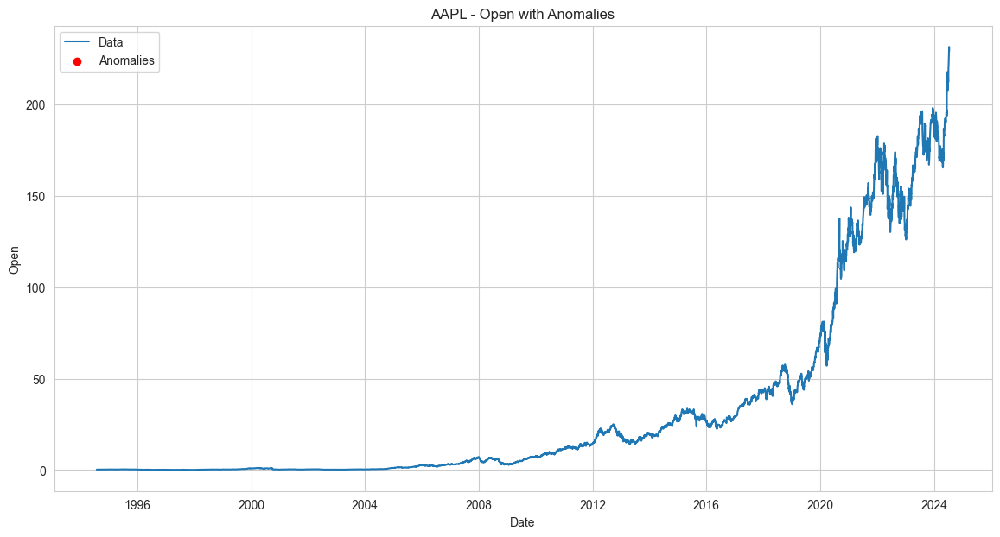

Found 0 anomalies in Open
Traitement de la colonne High :


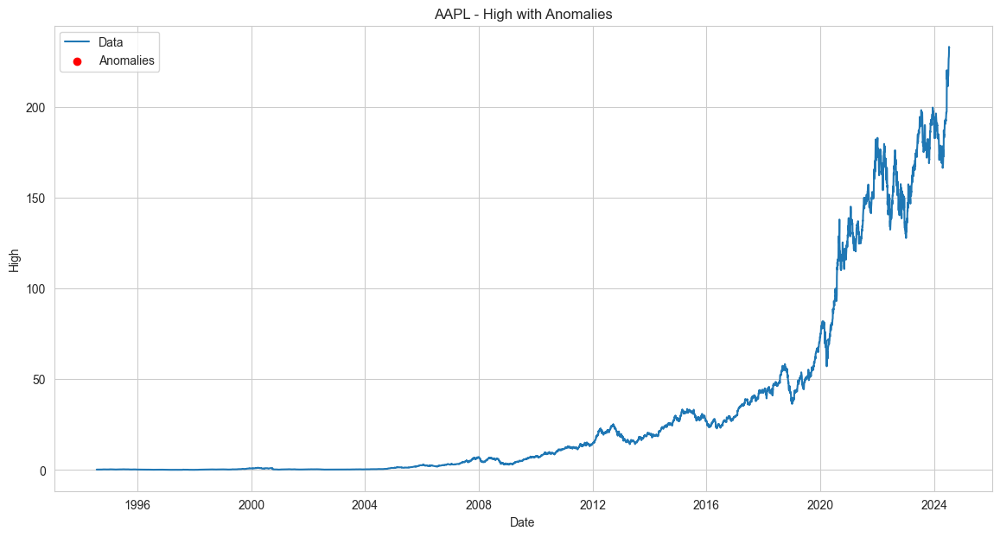

Found 0 anomalies in High
Traitement de la colonne Low :


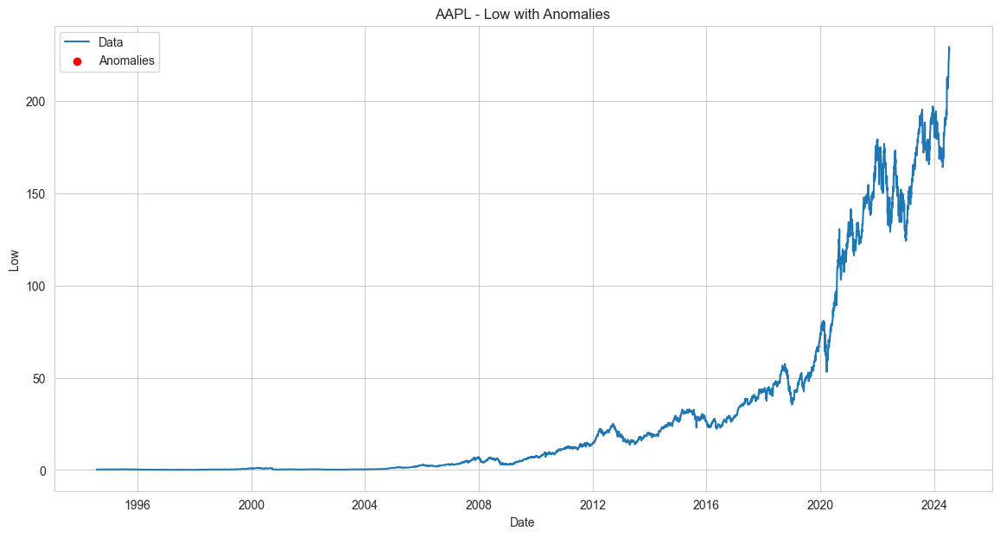

Found 0 anomalies in Low
Traitement de la colonne Close :


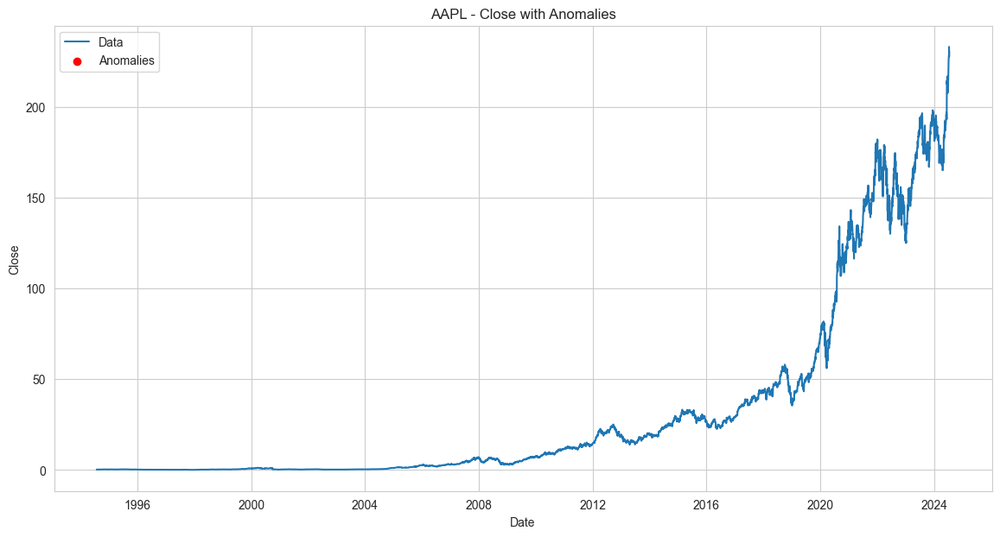

Found 0 anomalies in Close
Nettoyage des données pour MSFT :
Traitement de la colonne Open :


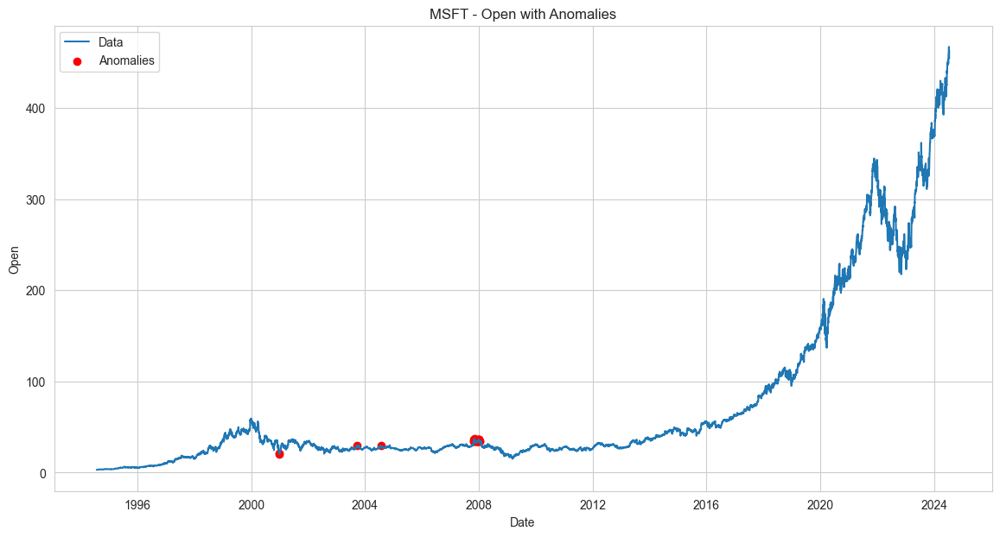

Found 37 anomalies in Open
Traitement de la colonne High :


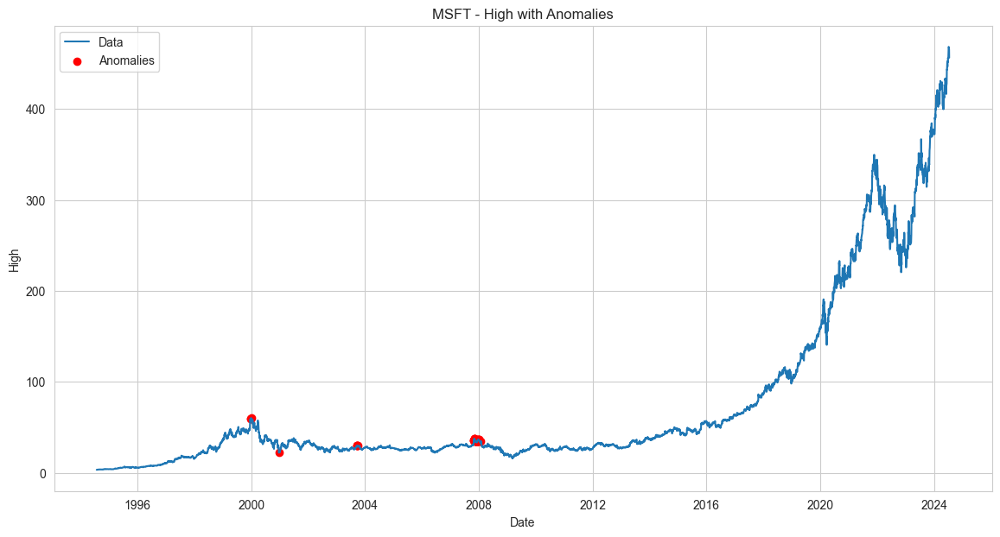

Found 46 anomalies in High
Traitement de la colonne Low :


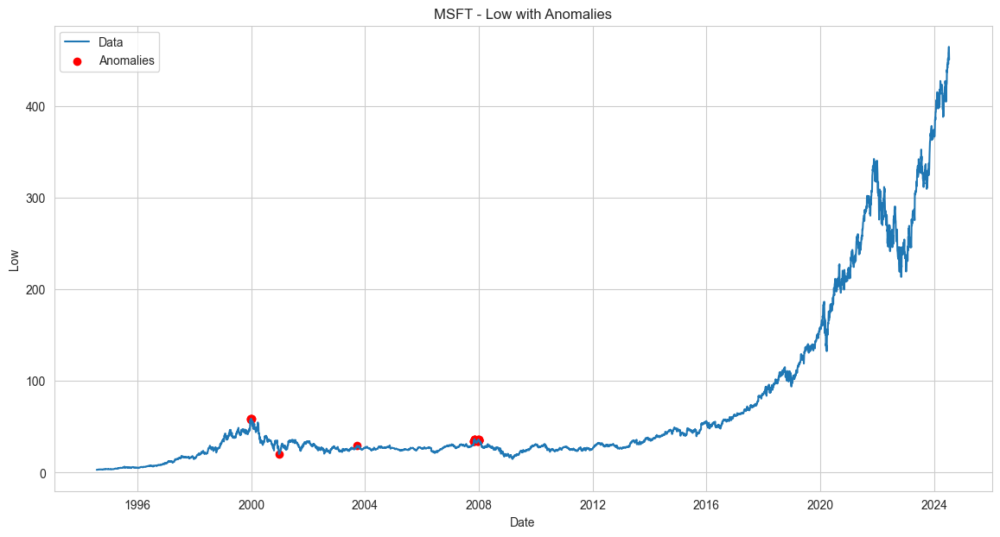

Found 30 anomalies in Low
Traitement de la colonne Close :


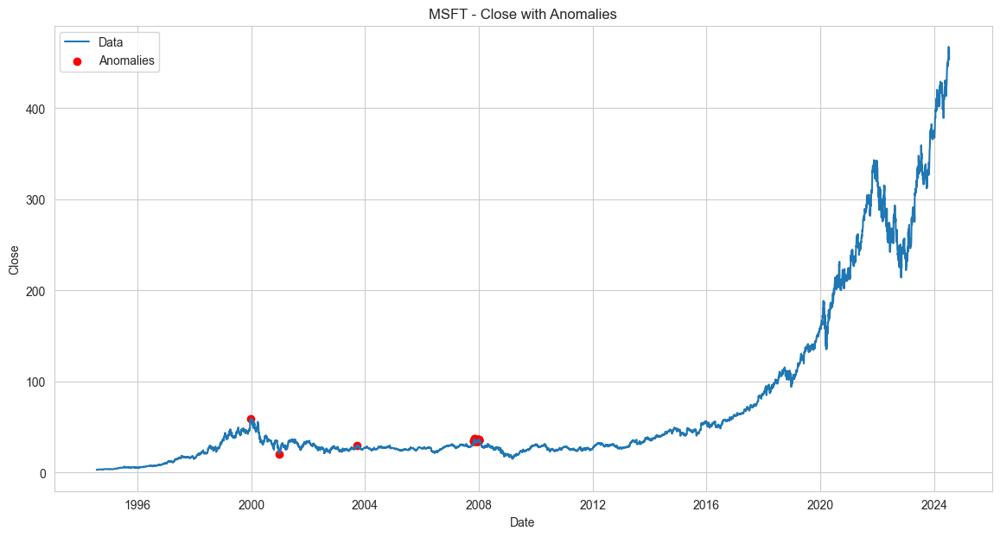

Found 32 anomalies in Close
Nettoyage des données pour AMZN :
Traitement de la colonne Open :


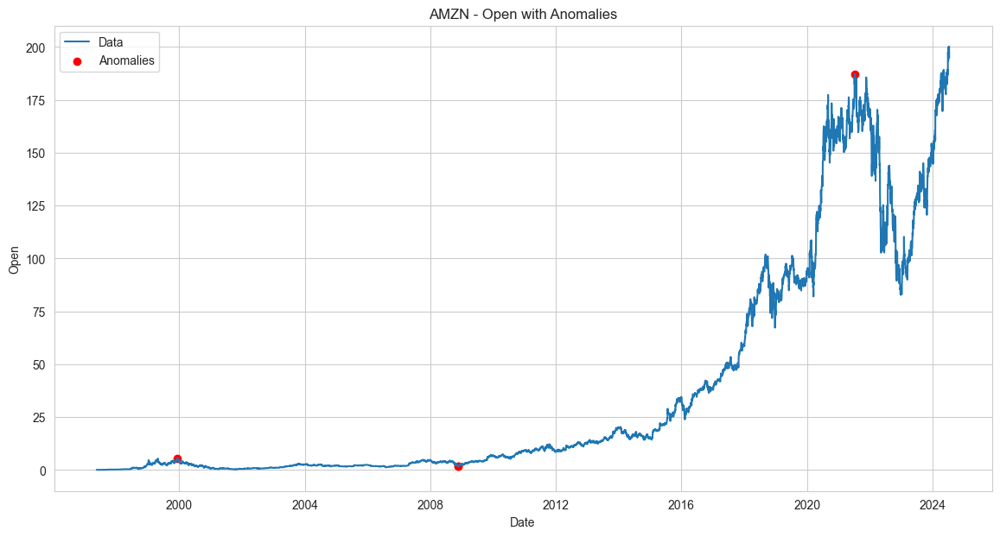

Found 4 anomalies in Open
Traitement de la colonne High :


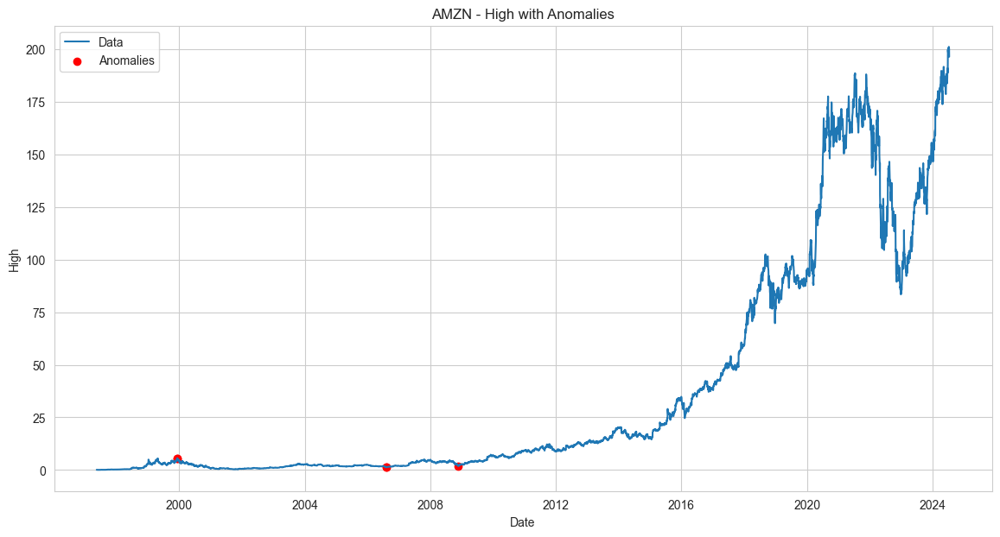

Found 5 anomalies in High
Traitement de la colonne Low :


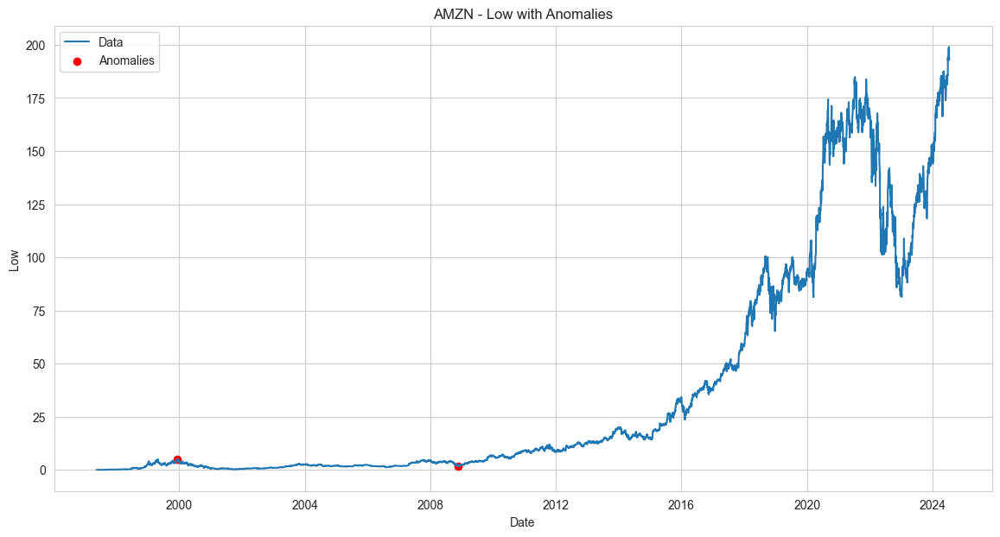

Found 2 anomalies in Low
Traitement de la colonne Close :


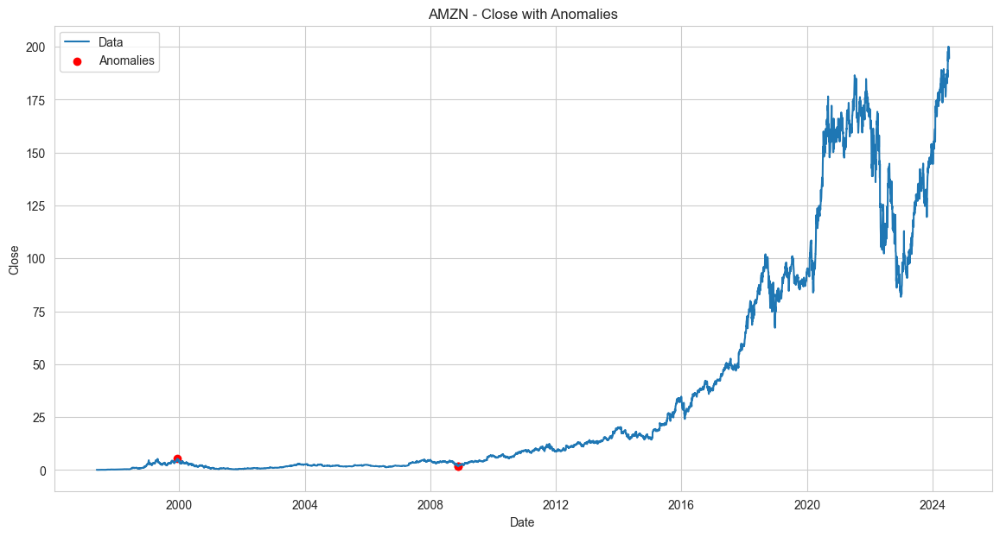

Found 3 anomalies in Close
Nettoyage des données pour META :
Traitement de la colonne Open :


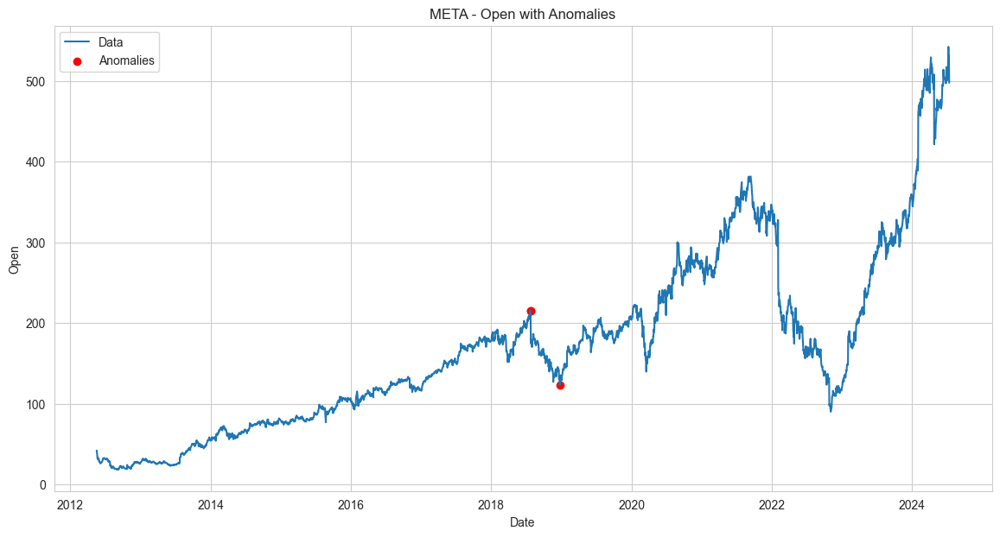

Found 3 anomalies in Open
Traitement de la colonne High :


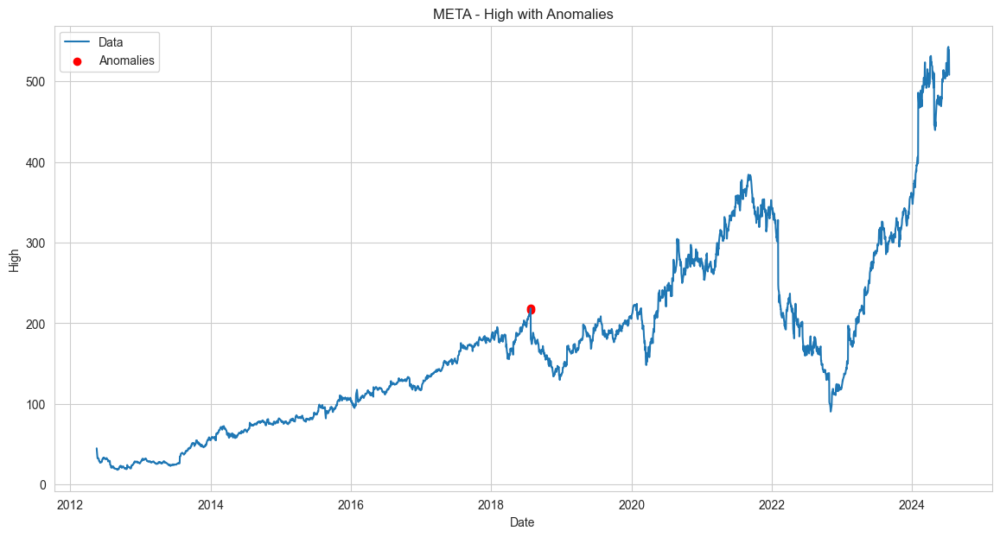

Found 2 anomalies in High
Traitement de la colonne Low :


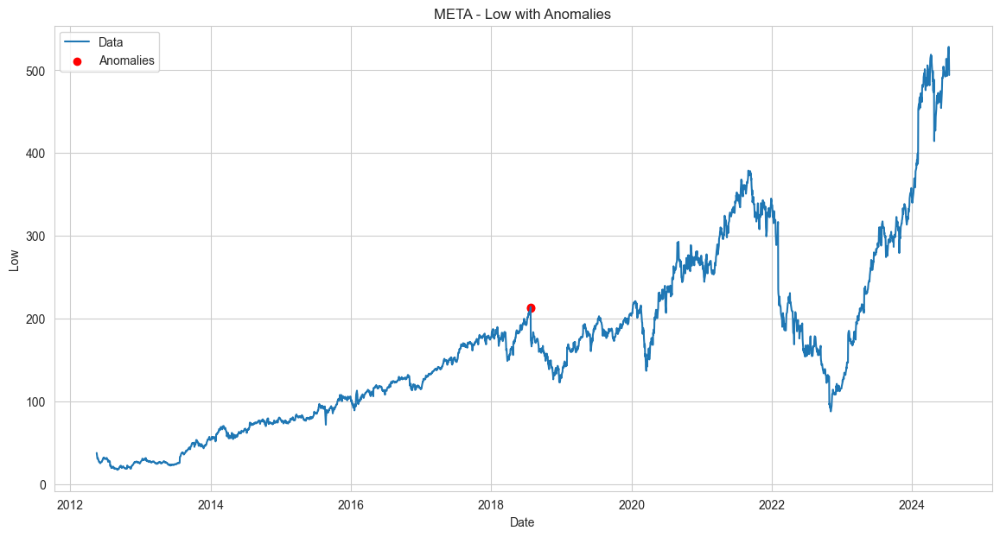

Found 2 anomalies in Low
Traitement de la colonne Close :


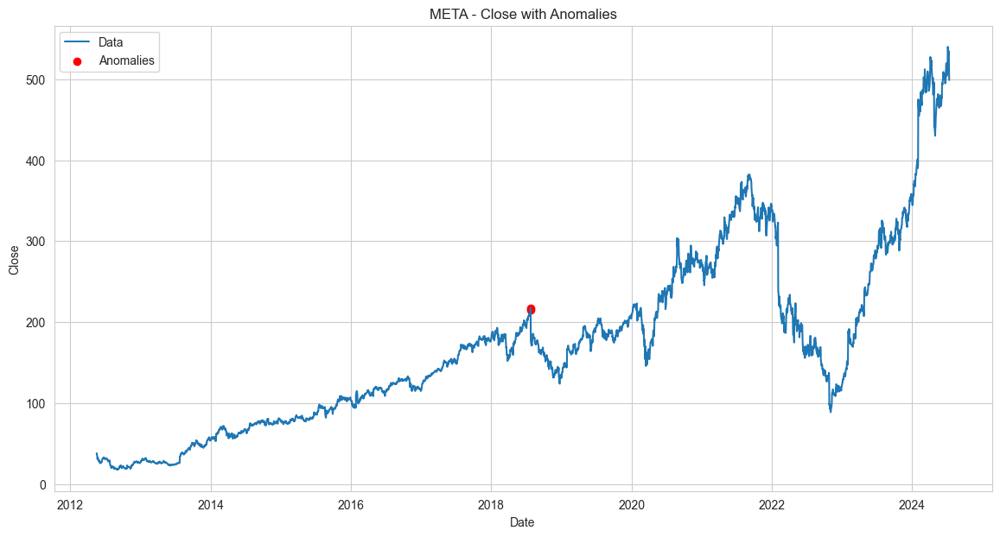

Found 2 anomalies in Close
Nettoyage des données pour GOOG :
Traitement de la colonne Open :


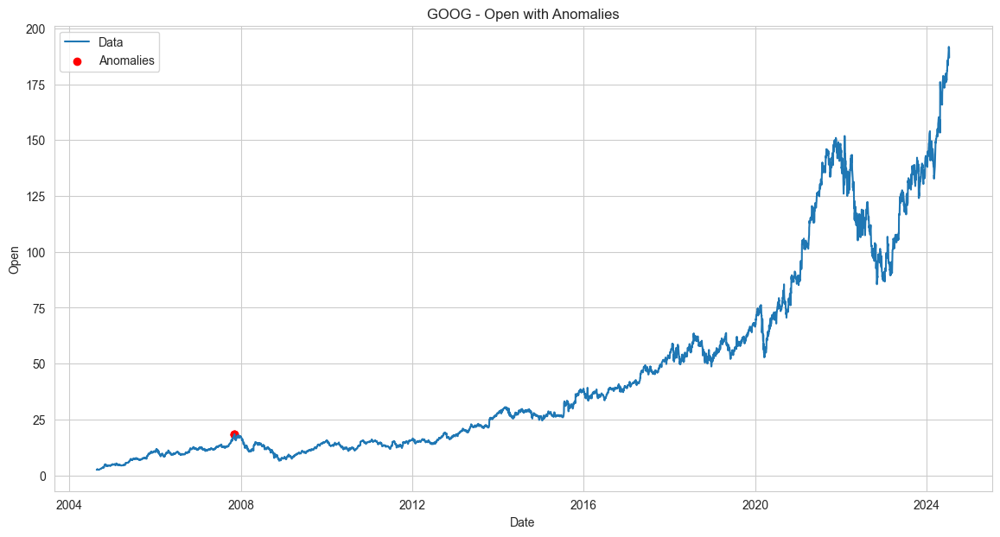

Found 3 anomalies in Open
Traitement de la colonne High :


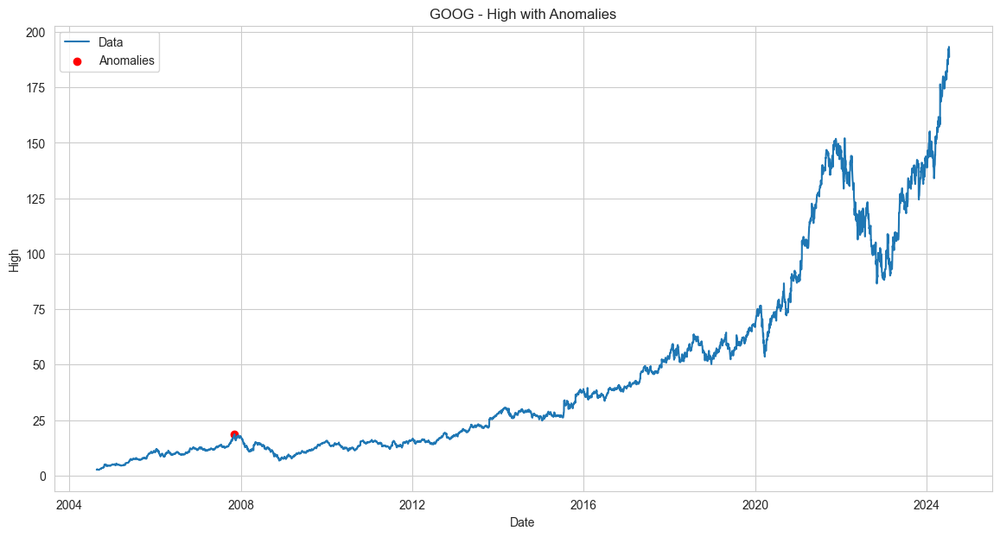

Found 1 anomalies in High
Traitement de la colonne Low :


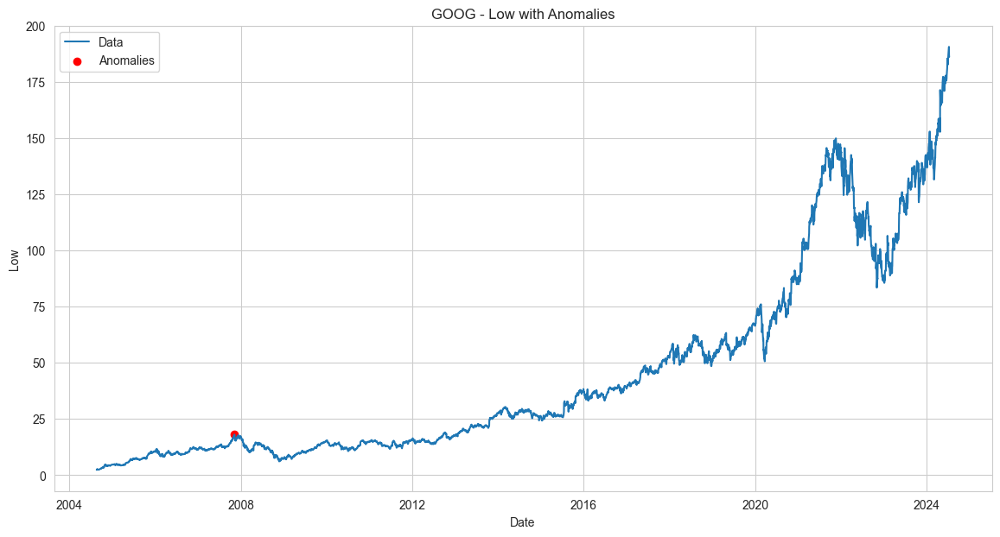

Found 1 anomalies in Low
Traitement de la colonne Close :


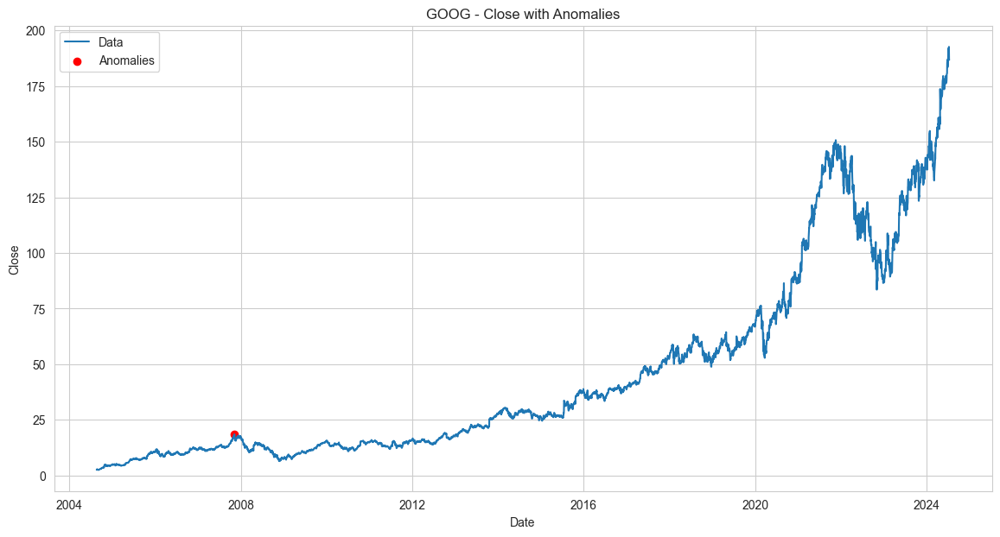

Found 1 anomalies in Close
Nettoyage des données pour TSLA :
Traitement de la colonne Open :


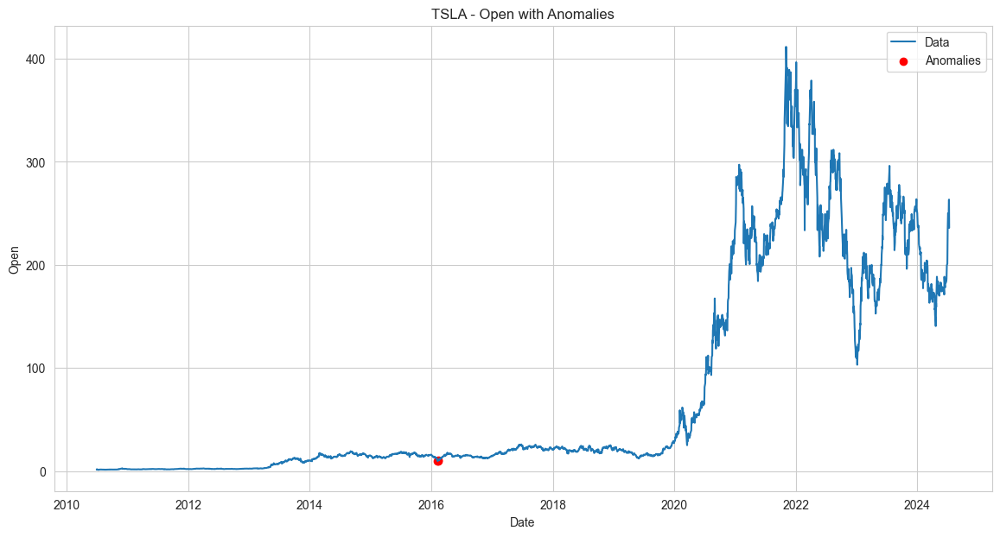

Found 3 anomalies in Open
Traitement de la colonne High :


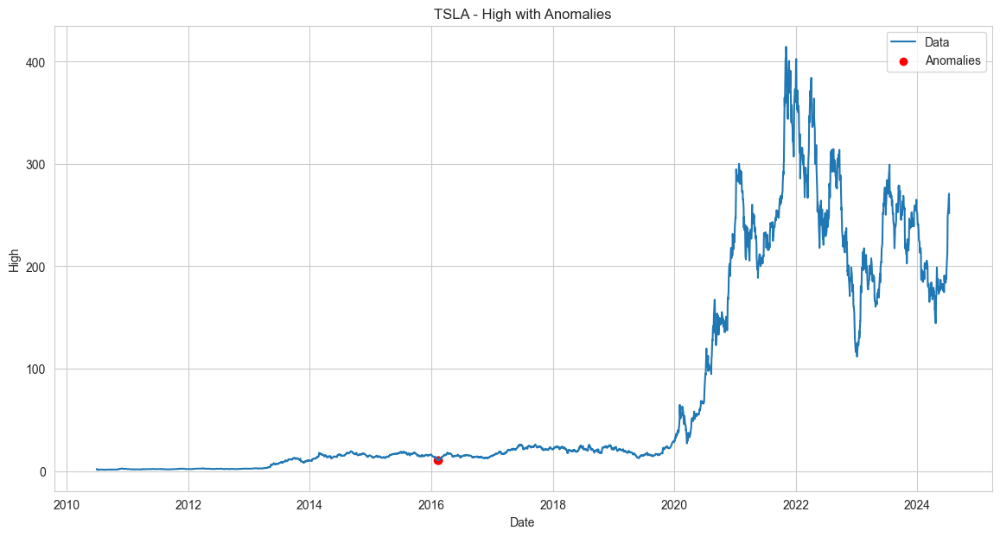

Found 3 anomalies in High
Traitement de la colonne Low :


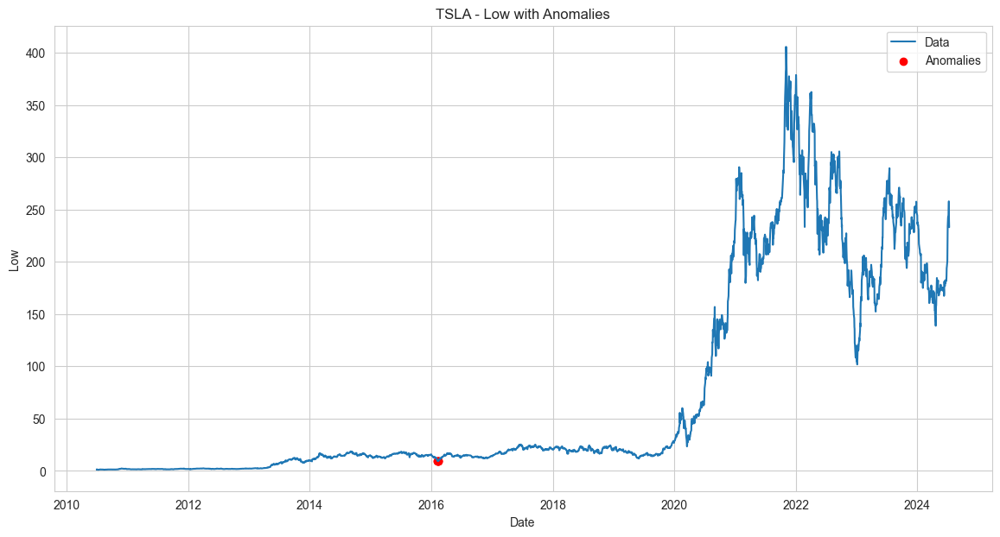

Found 5 anomalies in Low
Traitement de la colonne Close :


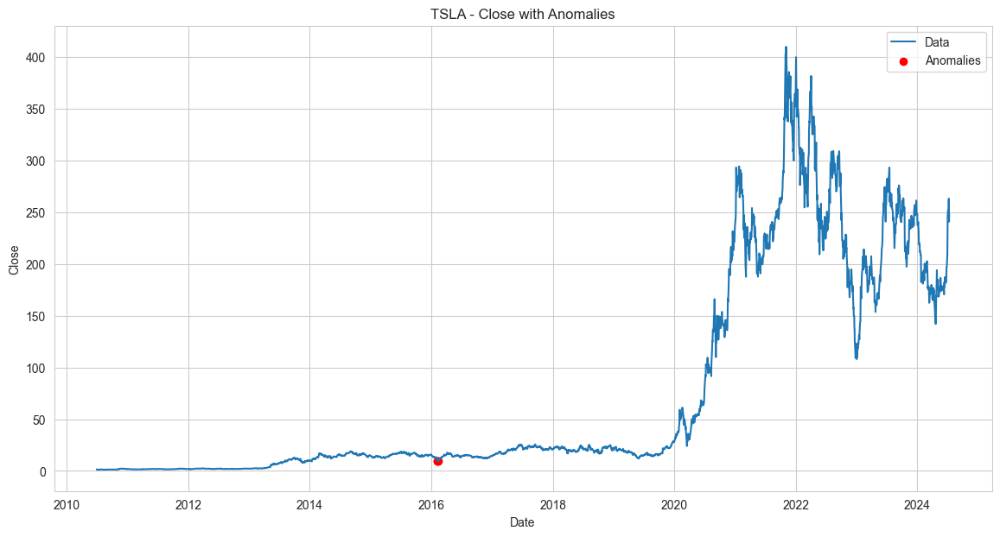

Found 3 anomalies in Close
Nettoyage des données pour ZM :
Traitement de la colonne Open :


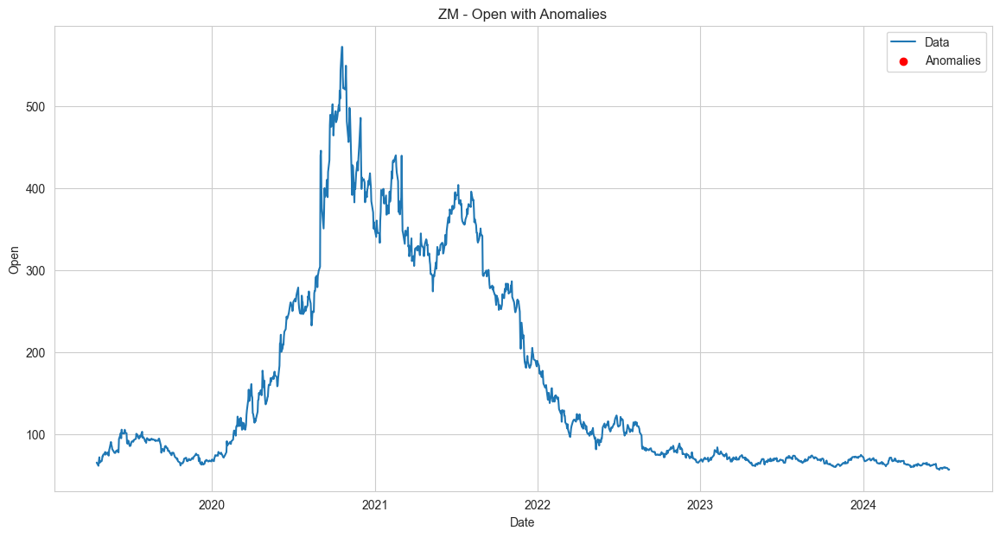

Found 0 anomalies in Open
Traitement de la colonne High :


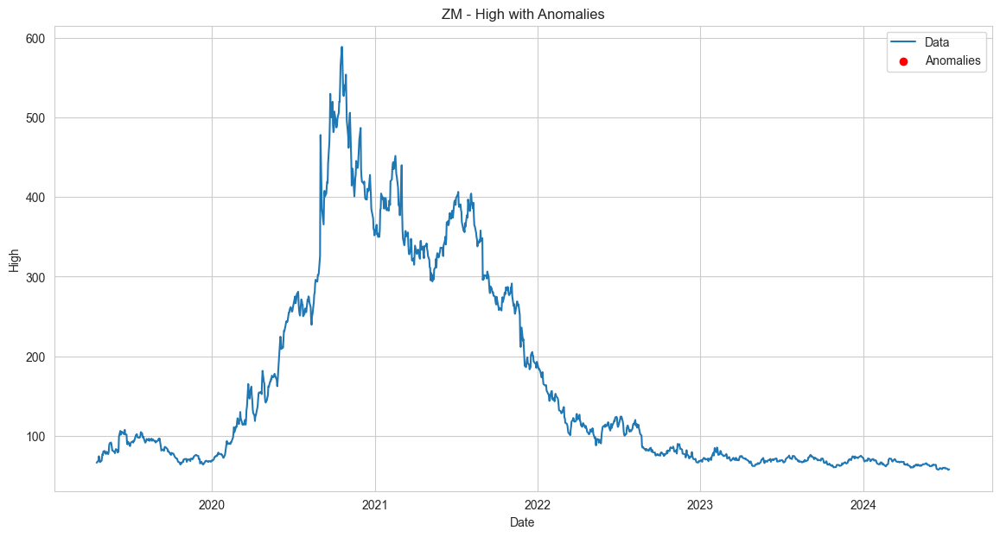

Found 0 anomalies in High
Traitement de la colonne Low :


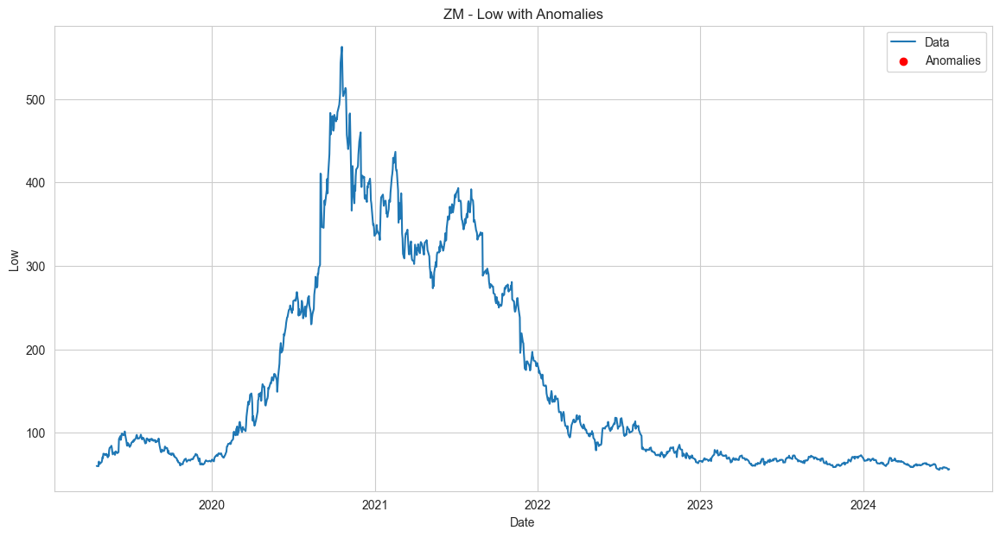

Found 0 anomalies in Low
Traitement de la colonne Close :


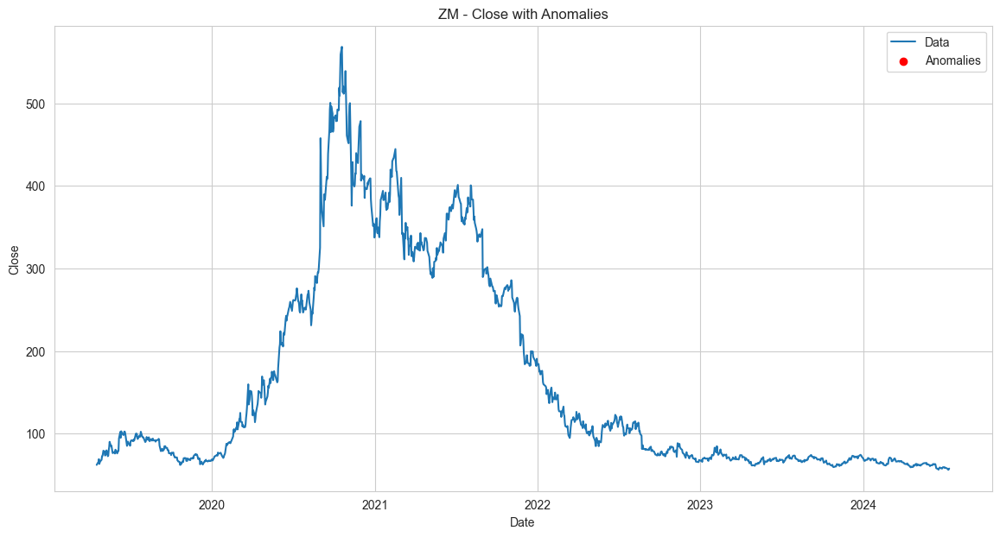

Found 0 anomalies in Close


In [4]:
for ticker, df in data.items():
    print(f"Nettoyage des données pour {ticker} :")
    for column in ['Open', 'High', 'Low', 'Close']:
        print(f"Traitement de la colonne {column} :")
        df = handle_anomalies(df=df, column=column, stock_name=ticker)
    cleaned_data[ticker] = df

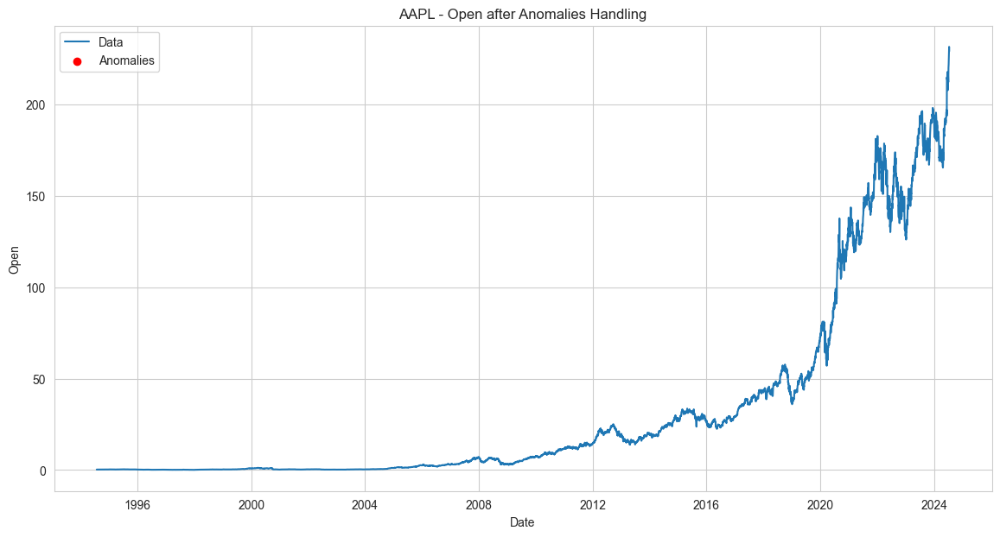

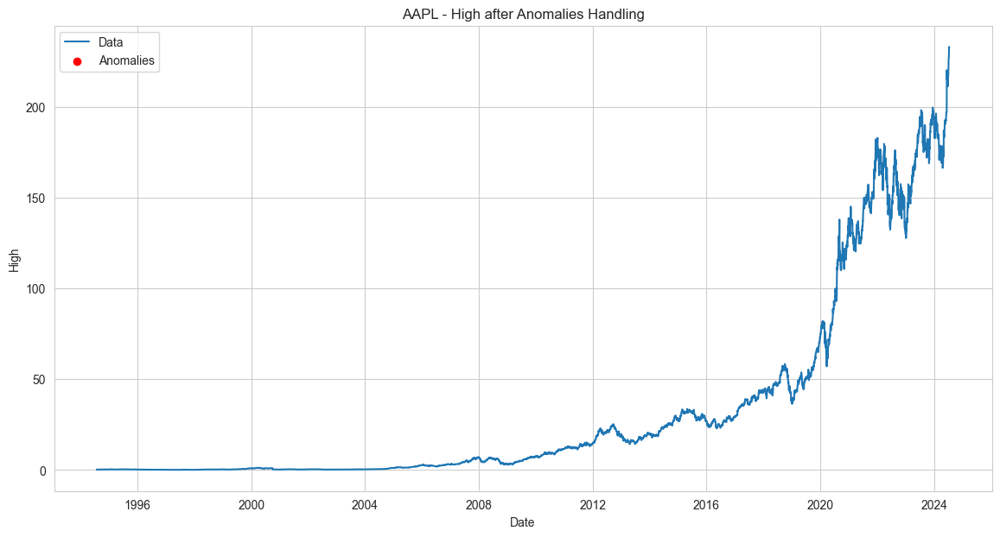

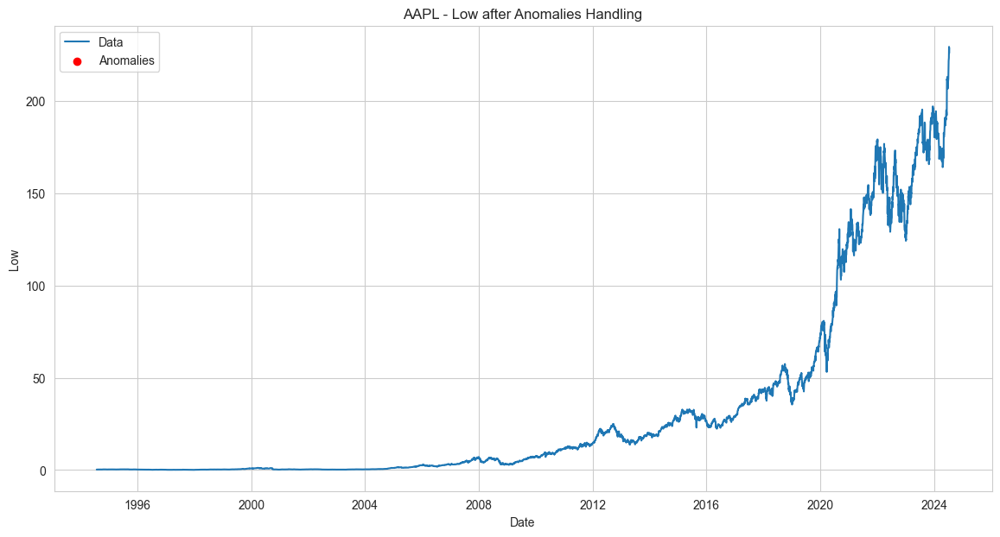

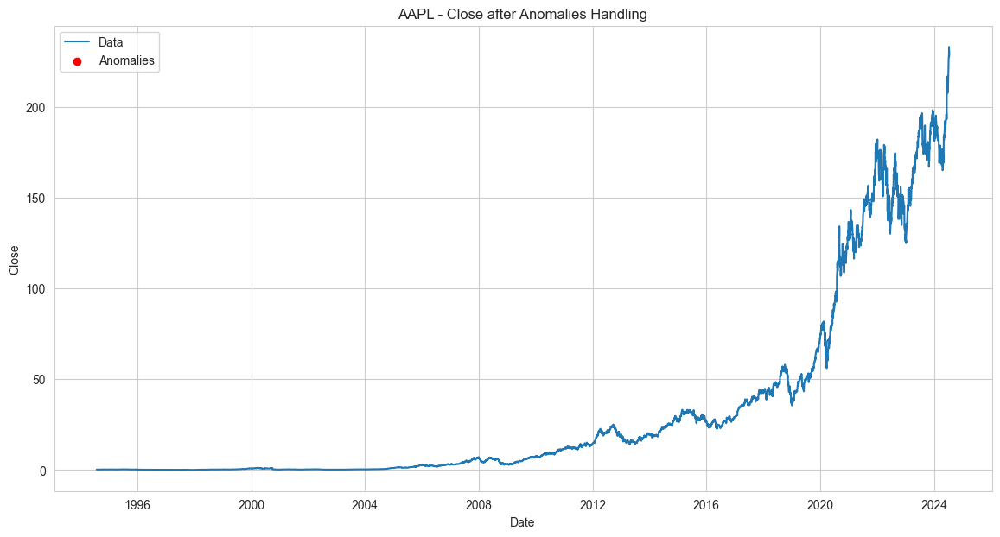

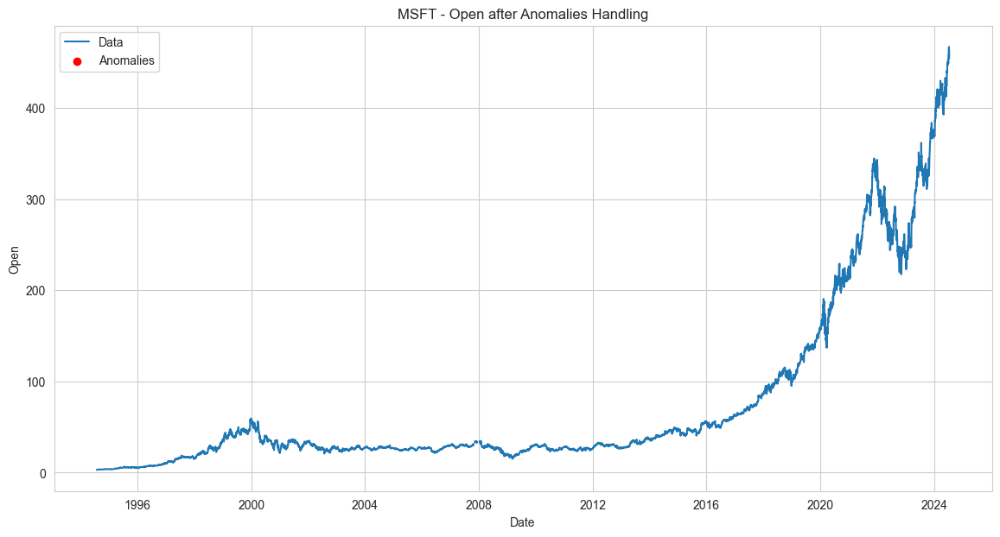

...

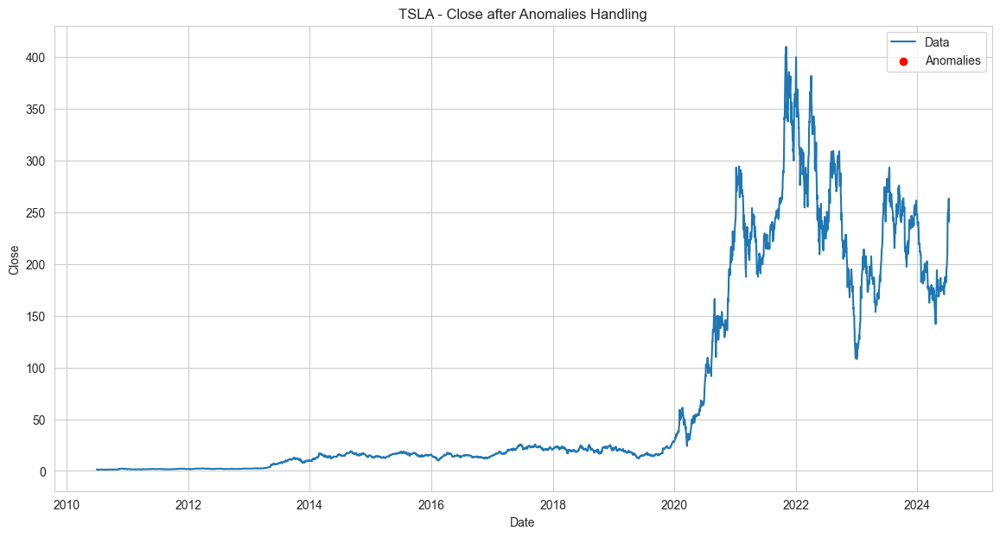

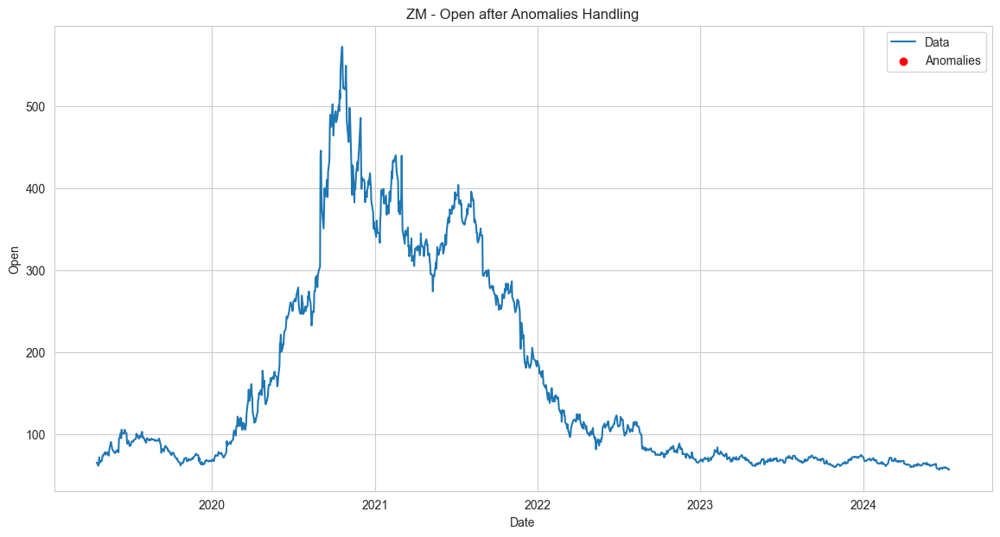

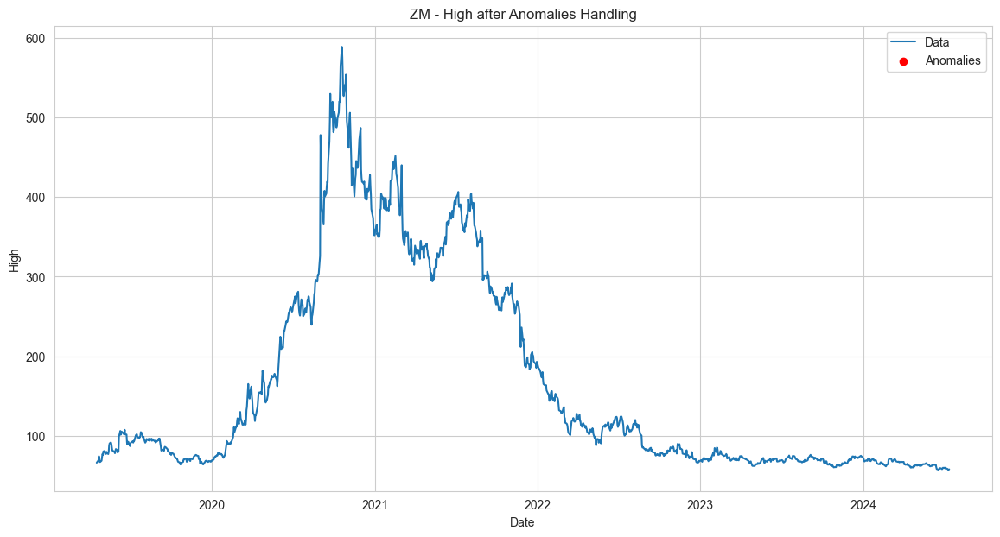

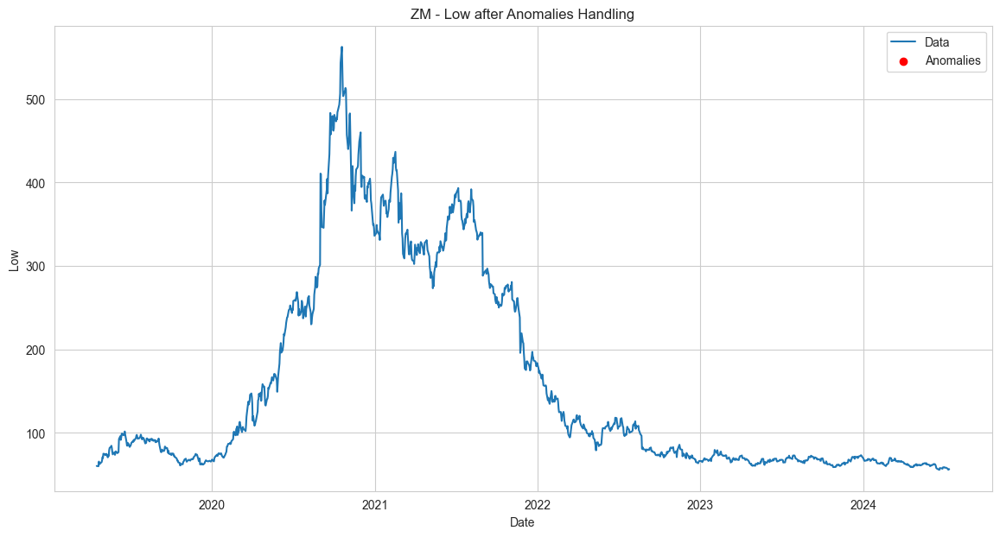

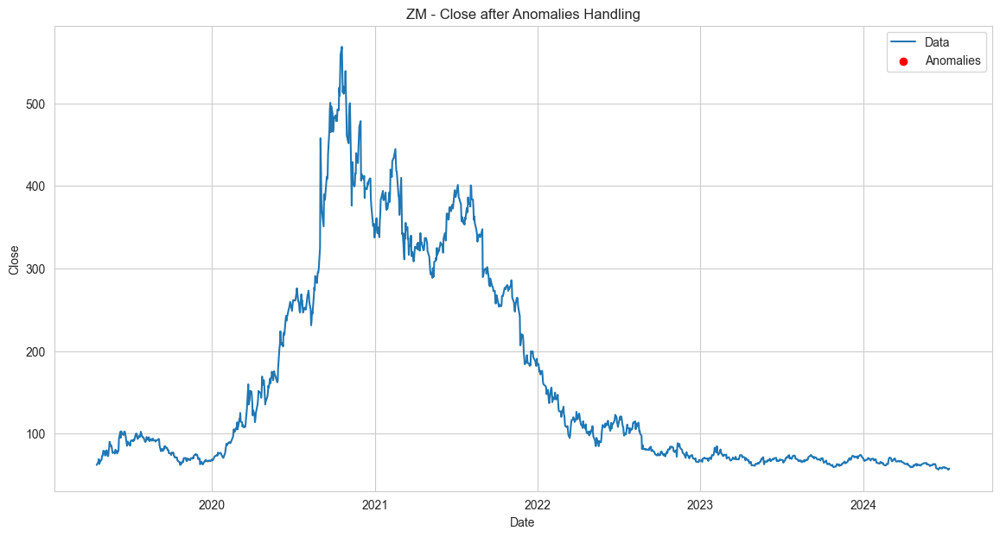

In [5]:
for ticker, df in cleaned_data.items():
    for column in ['Open', 'High', 'Low', 'Close']:
        plot_stock_data_with_anomalies(cleaned_data, ticker, column, is_anomalies=False)
    

In [6]:

os.makedirs("cleaned_data", exist_ok=True)
for ticker, df in cleaned_data.items():
    df.to_csv(f"cleaned_data/{ticker}_cleaned_data.csv", index=False)
    print(df.head())
    print(df.tail())    


                Open      High       Low     Close     Volume
Date                                                         
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000
1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600
1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400
                  Open        High         Low       Close    Volume
Date                                                                
2024-07-08  227.089996  227.850006  223.250000  227.820007  59085900
2024-07-09  227.929993  229.399994  226.369995  228.679993  48076100
2024-07-10  229.300003  233.080002  229.250000  232.979996  62627700
2024-07-11  231.389999  232.389999  225.770004  227.570007  64710600
2024-07-12  228.919998  232.639999  228.679993  230.539993  53008200
                Open      High       Low     Close    Volume
Date                  

**Average of Opening and Closing Prices for Each Stock and Different Time Periods**


In [7]:

# Calculate average prices for each stock
for ticker, df in cleaned_data.items():
    avg_prices = calculate_average_prices(df)
    print(f"\nAverage prices for {ticker}:")
    for period, prices in avg_prices.items():
        print(f"\n{period.capitalize()} average prices:")
        print(prices)
    print(df.head())
    print(df.tail())



Average prices for AAPL:

Daily average prices:
                  Open       Close
Date                              
1994-07-25    0.277902    0.282924
1994-07-26    0.283482    0.280134
1994-07-27    0.279018    0.277344
1994-07-28    0.276786    0.284598
1994-07-29    0.284598    0.300781
...                ...         ...
2024-07-08  227.089996  227.820007
2024-07-09  227.929993  228.679993
2024-07-10  229.300003  232.979996
2024-07-11  231.389999  227.570007
2024-07-12  228.919998  230.539993

[10946 rows x 2 columns]

Weekly average prices:
                  Open       Close
Date                              
1994-07-31    0.280357    0.285156
1994-08-07    0.296205    0.295647
1994-08-14    0.301563    0.305469
1994-08-21    0.309822    0.310491
1994-08-28    0.310491    0.313504
...                ...         ...
2024-06-16  205.301999  208.014001
2024-06-23  213.819996  212.032497
2024-06-30  211.766000  211.036002
2024-07-07  217.472496  221.227501
2024-07-14  228.925998  22

**Day-to-Day and Month-to-Month Stock Price Changes**

In [8]:


# Calculate price changes for each stock
for ticker, df in cleaned_data.items():
    df = calculate_price_changes(df)
    cleaned_data[ticker] = df
    print(f"\nPrice changes for {ticker}:")
    print(df[['Daily Change', 'Monthly Change']].fillna(df['Monthly Change'].mean()).head())
    print(df.head(30))
    print(df.tail(30))



Price changes for AAPL:
            Daily Change  Monthly Change
Date                                    
1994-07-25      0.852814        0.852814
1994-07-26     -0.002790        0.852814
1994-07-27     -0.002790        0.852814
1994-07-28      0.007254        0.852814
1994-07-29      0.016183        0.852814
                Open      High       Low     Close     Volume  Daily Change  \
Date                                                                          
1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400           NaN   
1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600     -0.002790   
1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000     -0.002790   
1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600      0.007254   
1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400      0.016183   
1994-08-01  0.300223  0.301339  0.292411  0.297991  229275200     -0.002790   
1994-08-02  0.299107  0.300223  0.289063  0.290737  2695

/var/folders/t8/c116jkz901vd_1zfgkw3g7rm0000gn/T/ipykernel_87863/155478816.py:256: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['Monthly Change'].fillna(method='ffill', inplace=True)
/var/folders/t8/c116jkz901vd_1zfgkw3g7rm0000gn/T/ipykernel_87863/155478816.py:256: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df['Monthly Change'].fillna(method='ffill', inplace=True)
/var/folders/t8/c116jkz901vd_1zfgkw3g7rm0000gn/T/ipykernel_87863/1554

**Daily Return Based on Opening and Closing Prices**

In [9]:
# Calculate the daily return for each stock

In [10]:
# Fonction pour calculer le retour quotidien
def calculate_daily_return(df):
    df['Daily Return'] = (df['Close'] - df['Open']) / df['Open']
    return df

# Assurer que 'Date' est une colonne dans le DataFrame
def ensure_date_column(df):
    if df.index.name == 'Date':
        df = df.reset_index()
    return df

# Calculer le retour quotidien pour chaque action
for ticker, df in cleaned_data.items():
    df = ensure_date_column(df)  # S'assurer que 'Date' est dans les colonnes
    df = calculate_daily_return(df)
    cleaned_data[ticker] = df
    print(f"\nDaily return for {ticker}:")
    print(df[['Date', 'Daily Return']].dropna().head())
    print(df.head())
    print(df.tail())



Daily return for AAPL:
        Date  Daily Return
0 1994-07-25      0.018071
1 1994-07-26     -0.011810
2 1994-07-27     -0.006000
3 1994-07-28      0.028224
4 1994-07-29      0.056863
        Date      Open      High       Low     Close     Volume  Daily Change  \
0 1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400           NaN   
1 1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600     -0.002790   
2 1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000     -0.002790   
3 1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600      0.007254   
4 1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400      0.016183   

   Monthly Change  Daily Return  
0             NaN      0.018071  
1             NaN     -0.011810  
2             NaN     -0.006000  
3             NaN      0.028224  
4             NaN      0.056863  
           Date        Open        High         Low       Close    Volume  \
7540 2024-07-08  227.089996  227.850006  223.2

**Stock with the Highest Daily Return**

In [11]:
# Find the stock with the highest daily return
average_daily_return = {}

for ticker, df in cleaned_data.items():
    df['Daily Return'] = df['Close'].pct_change(fill_method=None)
    avg_return = df['Daily Return'].mean()
    average_daily_return[ticker] = avg_return

best_stock = max(average_daily_return, key=average_daily_return.get)
print(f"\nStock with the highest average daily return: {best_stock} with an average return of {average_daily_return[best_stock]}")



Stock with the highest average daily return: TSLA with an average return of 0.002091304198747489


**Average Daily Return for Different Periods (Week, Month, Year)**

In [12]:
# Assurer que 'Date' est une colonne dans le DataFrame avant de calculer le retour quotidien
def ensure_date_column(df):
    if df.index.name == 'Date':
        df = df.reset_index()
    return df

# Calculer le retour quotidien pour chaque action
for ticker, df in cleaned_data.items():
    df = ensure_date_column(df)
    df = calculate_daily_return(df)
    cleaned_data[ticker] = df
    print(f"\nDaily return for {ticker}:")
    print(df[['Date', 'Daily Return']].head())



Daily return for AAPL:
        Date  Daily Return
0 1994-07-25      0.018071
1 1994-07-26     -0.011810
2 1994-07-27     -0.006000
3 1994-07-28      0.028224
4 1994-07-29      0.056863

Daily return for MSFT:
        Date  Daily Return
0 1994-07-25      0.011111
1 1994-07-26     -0.014670
2 1994-07-27     -0.017370
3 1994-07-28      0.000000
4 1994-07-29      0.032581

Daily return for AMZN:
        Date  Daily Return
0 1997-05-15     -0.196578
1 1997-05-16     -0.121701
2 1997-05-19     -0.029584
3 1997-05-20     -0.054211
4 1997-05-21     -0.127392

Daily return for META:
        Date  Daily Return
0 2012-05-18     -0.090844
1 2012-05-21     -0.068437
2 2012-05-22     -0.049371
3 2012-05-23      0.020083
4 2012-05-24      0.002428

Daily return for GOOG:
        Date  Daily Return
0 2004-08-19      0.003400
1 2004-08-20      0.072270
2 2004-08-23     -0.012190
3 2004-08-24     -0.057264
4 2004-08-25      0.009909

Daily return for TSLA:
        Date  Daily Return
0 2010-06-29      0

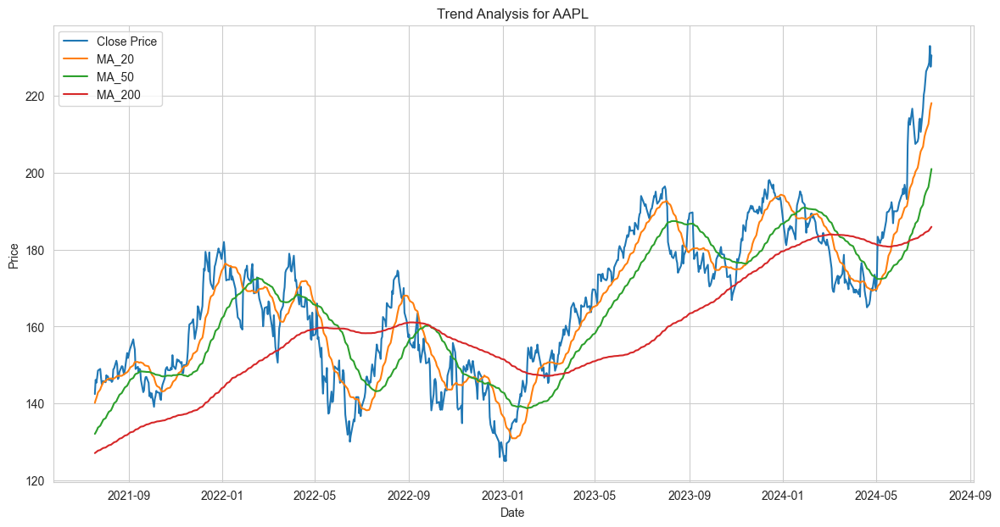

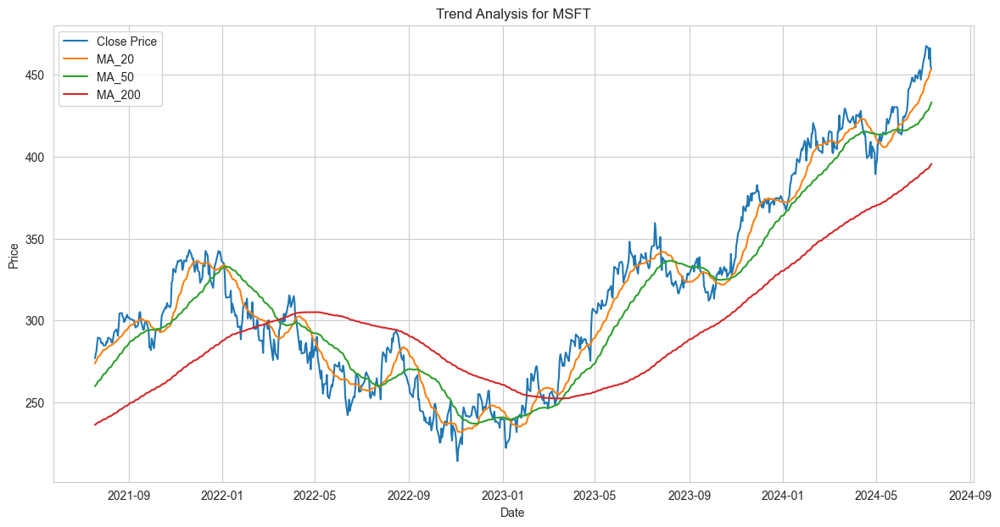

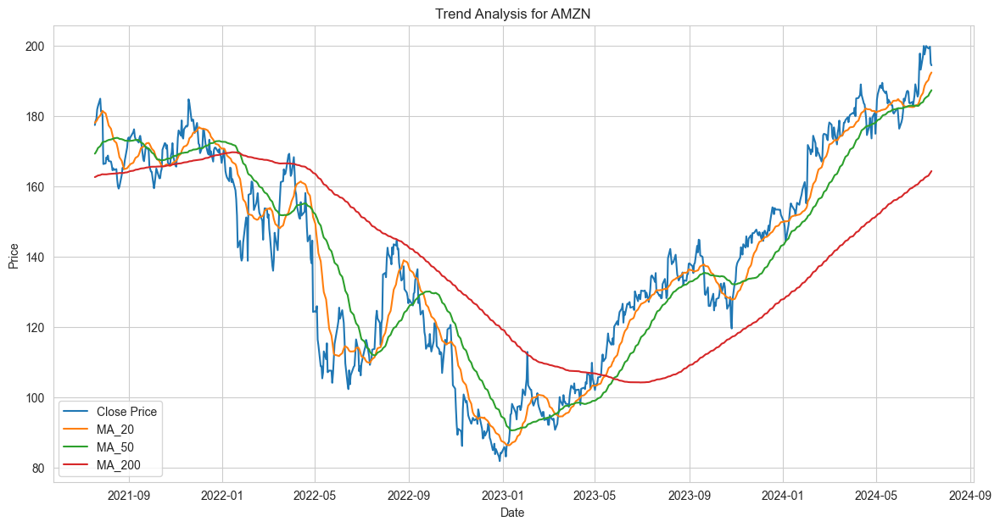

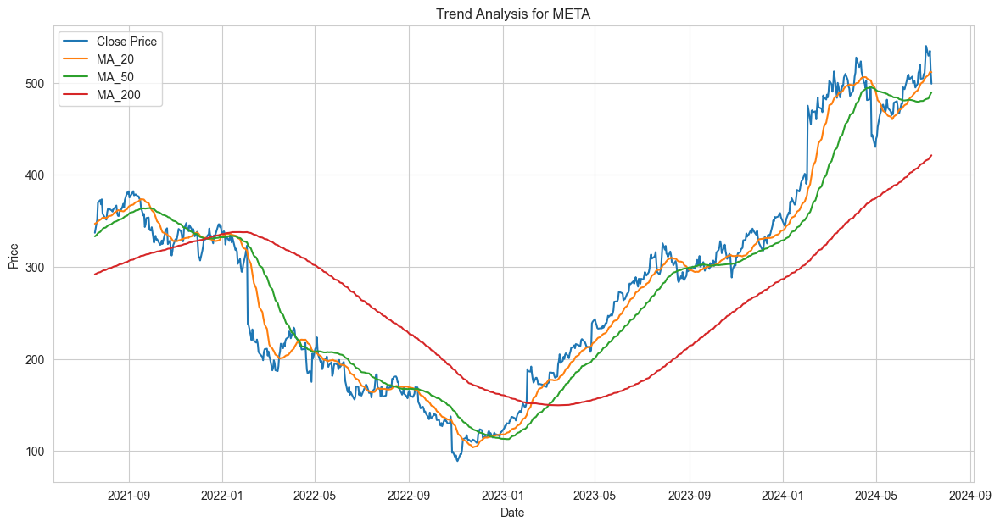

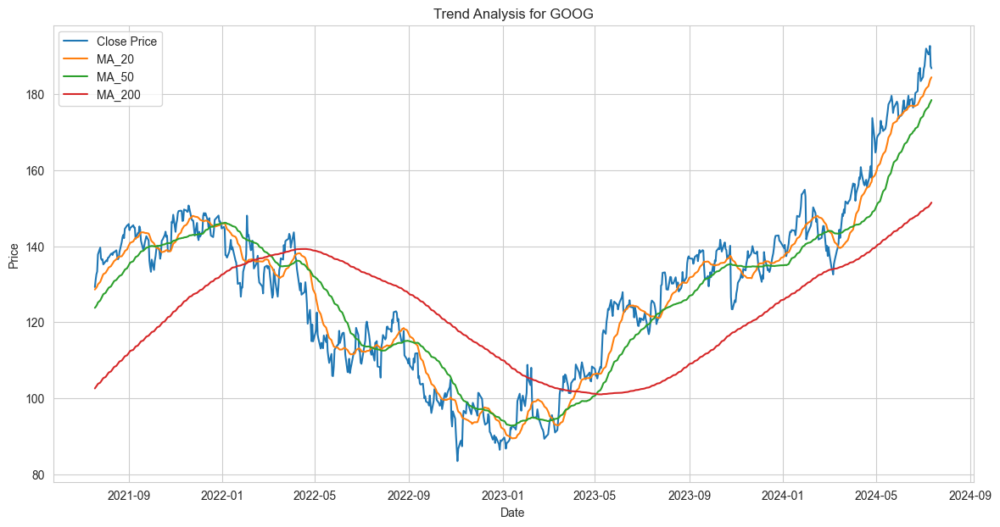

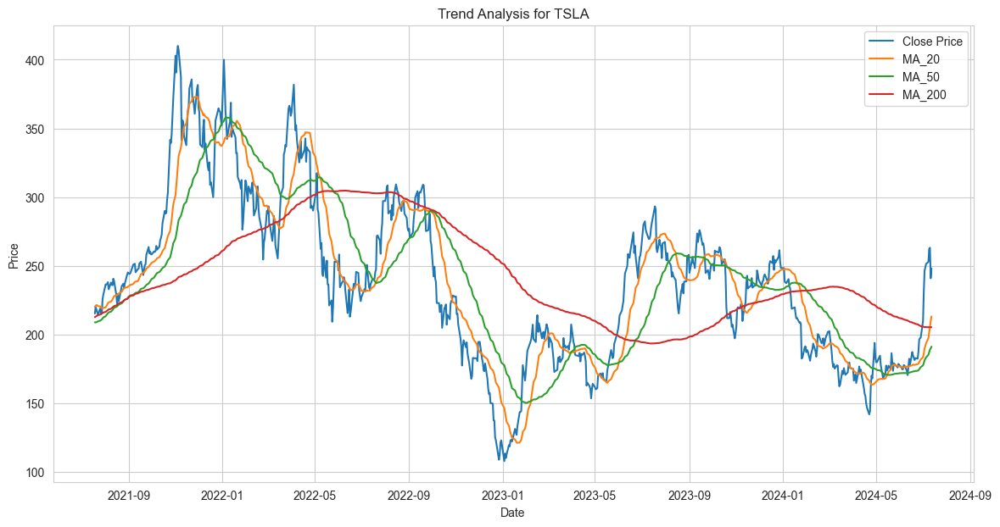

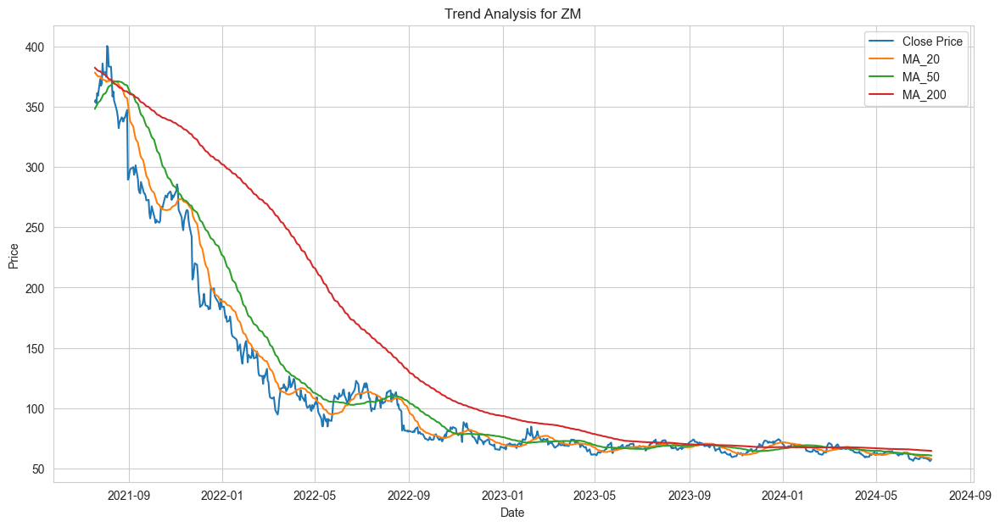

In [13]:
for ticker, df in cleaned_data.items():
    df = calculate_moving_average(df, 'Close', 20)
    df = calculate_moving_average(df, 'Close', 50)
    df = calculate_moving_average(df, 'Close', 200)
    plot_trends(df, ticker)

In [14]:
for ticker, df in cleaned_data.items():
    print(f"\nStatistiques descriptives pour {ticker} :")
    print(descriptive_statistics(df))
    
for ticker, df in cleaned_data.items():
    print(f"Volatilité pour {ticker} : {calculate_volatility(df):.4f}")



Statistiques descriptives pour AAPL :
                                Date         Open         High          Low  \
count                           7545  7545.000000  7545.000000  7545.000000   
mean   2009-07-14 21:32:16.699801088    32.024196    32.369594    31.695482   
min              1994-07-25 00:00:00     0.114955     0.118304     0.113839   
25%              2002-01-17 00:00:00     0.408571     0.416295     0.400536   
50%              2009-07-16 00:00:00     6.599643     6.660714     6.476786   
75%              2017-01-11 00:00:00    32.505001    32.720001    32.279999   
max              2024-07-12 00:00:00   231.389999   233.080002   229.250000   
std                              NaN    51.993373    52.556146    51.478958   

             Close        Volume  Daily Change  Monthly Change  Daily Return  \
count  7545.000000  7.545000e+03   7544.000000     7518.000000   7545.000000   
mean     32.046494  3.840788e+08      0.030522        0.852814      0.000231   
min      

In [15]:
for ticker, df in cleaned_data.items():
    print(df.head())
    print(df.tail())

        Date      Open      High       Low     Close     Volume  Daily Change  \
0 1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400           NaN   
1 1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600     -0.002790   
2 1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000     -0.002790   
3 1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600      0.007254   
4 1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400      0.016183   

   Monthly Change  Daily Return  MA_20  MA_50  MA_200  daily_return  \
0             NaN      0.018071    NaN    NaN     NaN           NaN   
1             NaN     -0.011810    NaN    NaN     NaN     -0.009861   
2             NaN     -0.006000    NaN    NaN     NaN     -0.009960   
3             NaN      0.028224    NaN    NaN     NaN      0.026155   
4             NaN      0.056863    NaN    NaN     NaN      0.056863   

   Volatility  
0    0.026703  
1    0.026703  
2    0.026703  
3    0.026703  
4    0

In [16]:
performance_data = []
for ticker, df in cleaned_data.items():
    total_return = calculate_performance(df)
    annualized_return = calculate_annualized_return(df)
    sharpe_ratio = calculate_sharpe_ratio(df)
    volatility = calculate_volatility(df)
    performance_data.append({
        'Ticker': ticker,
        'Total Return': total_return,
        'Annualized Return': annualized_return,
        'Sharpe Ratio': sharpe_ratio,
        'Volatility': volatility
    })

        Date      Open      High       Low     Close     Volume  Daily Change  \
0 1994-07-25  0.277902  0.284598  0.274554  0.282924  422654400           NaN   
1 1994-07-26  0.283482  0.285714  0.277902  0.280134  188809600     -0.002790   
2 1994-07-27  0.279018  0.280134  0.273438  0.277344  133784000     -0.002790   
3 1994-07-28  0.276786  0.286830  0.275670  0.284598  245313600      0.007254   
4 1994-07-29  0.284598  0.303571  0.284598  0.300781  555766400      0.016183   

   Monthly Change  Daily Return  MA_20  MA_50  MA_200  daily_return  \
0             NaN      0.018071    NaN    NaN     NaN           NaN   
1             NaN     -0.011810    NaN    NaN     NaN     -0.009861   
2             NaN     -0.006000    NaN    NaN     NaN     -0.009960   
3             NaN      0.028224    NaN    NaN     NaN      0.026155   
4             NaN      0.056863    NaN    NaN     NaN      0.056863   

   Volatility  
0    0.026703  
1    0.026703  
2    0.026703  
3    0.026703  
4    0

In [17]:
performance_df = pd.DataFrame(performance_data)
print(performance_df)

# Analyse de corrélation entre les actions
correlation_matrix = calculate_correlation(cleaned_data)
print("Matrice de corrélation :")
print(correlation_matrix)


  Ticker  Total Return  Annualized Return  Sharpe Ratio  Volatility
0   AAPL    813.847790           0.250681     -0.327565    0.026703
1   MSFT    140.768972           0.179781     -0.467415    0.019583
2   AMZN   1985.274187           0.322612     -0.233296    0.035437
3   META     12.049176           0.235416     -0.349934    0.025105
4   GOOG     73.737915           0.242130     -0.463599    0.019315
5   TSLA    154.858066           0.432884     -0.220914    0.035800
6     ZM     -0.071290          -0.014029     -0.250680    0.037382
Matrice de corrélation :
          AAPL      MSFT      AMZN      META      GOOG      TSLA        ZM
AAPL  1.000000  0.422906  0.017189  0.021193  0.007989 -0.003008 -0.027672
MSFT  0.422906  1.000000  0.022985  0.006612  0.000337  0.009012 -0.035074
AMZN  0.017189  0.022985  1.000000  0.007623 -0.010011  0.005840 -0.009191
META  0.021193  0.006612  0.007623  1.000000  0.012475  0.007696  0.006740
GOOG  0.007989  0.000337 -0.010011  0.012475  1.000000  

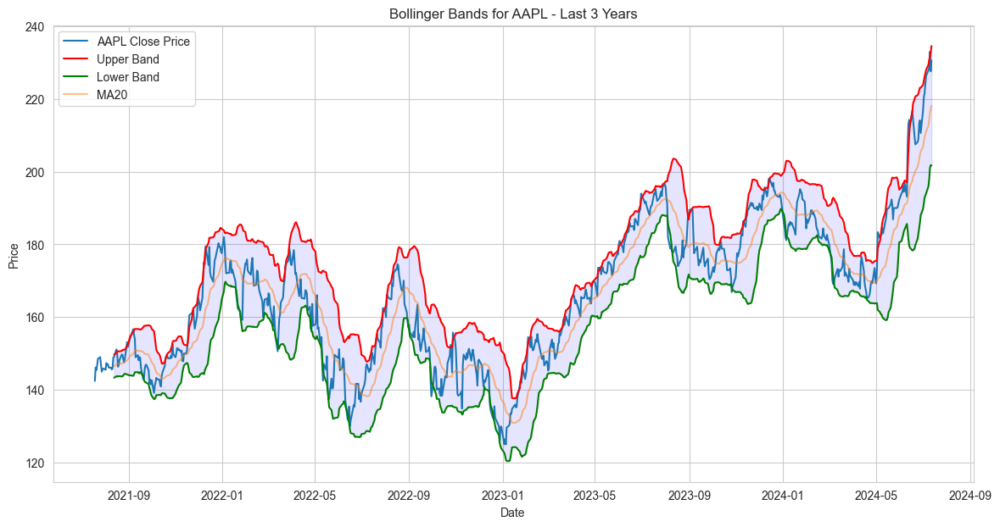

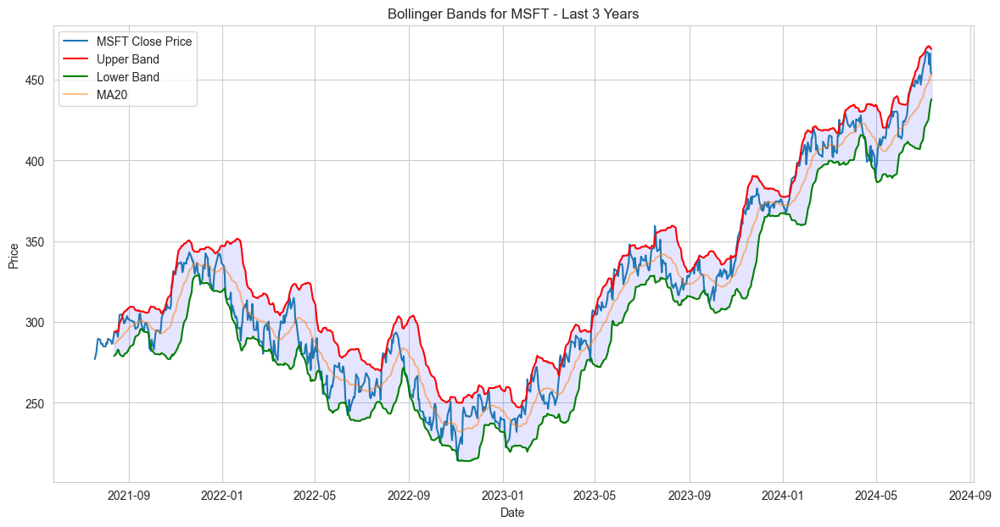

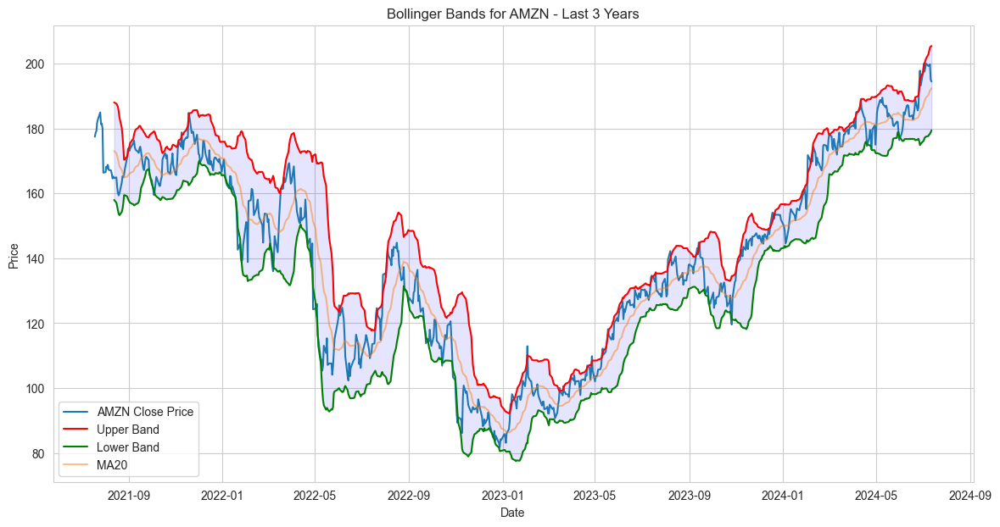

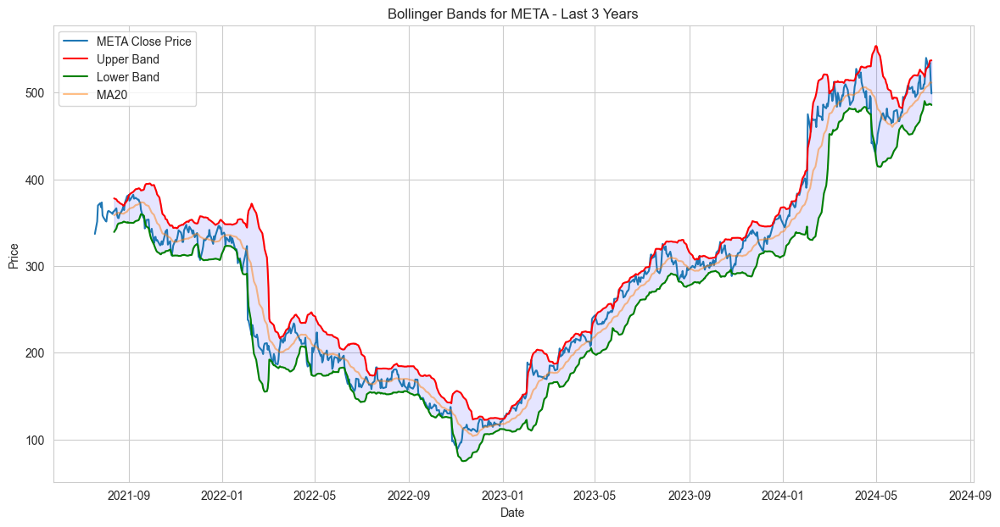

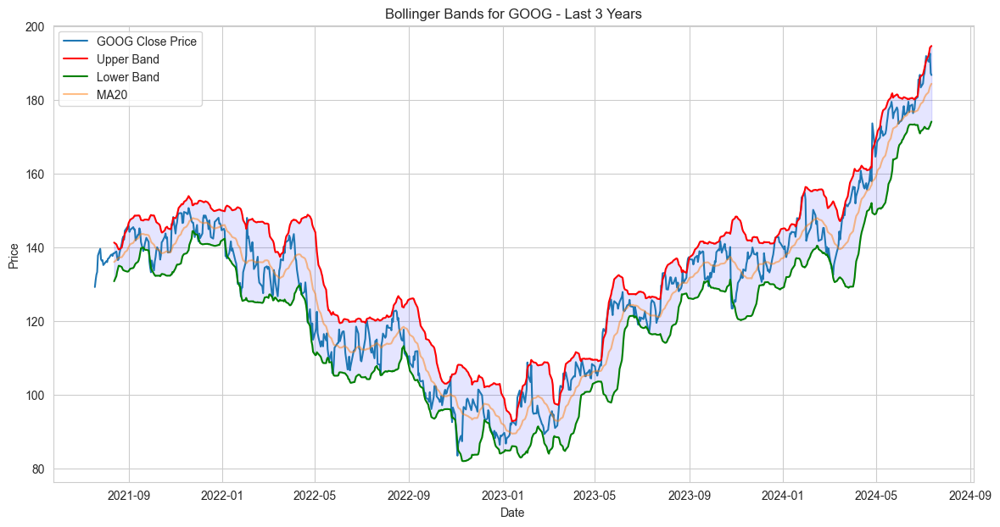

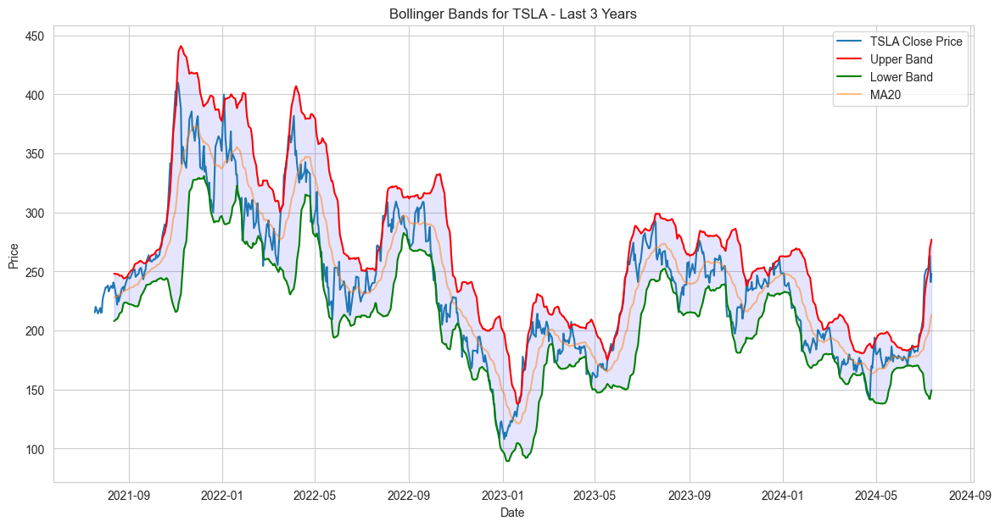

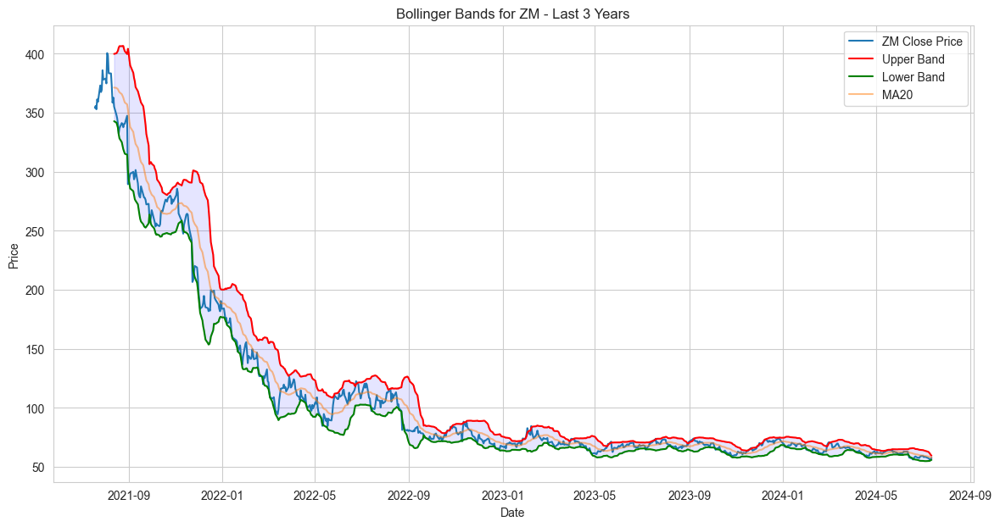

In [18]:
# calculate and plot the bollings

plot_bollinger_bands(cleaned_data, tickers)


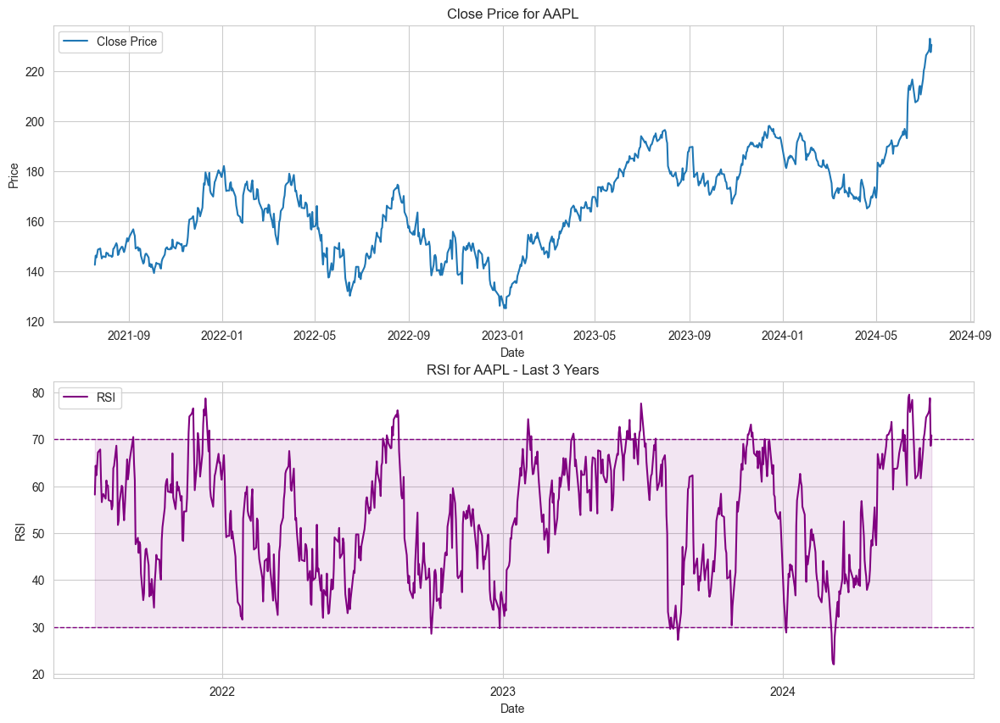

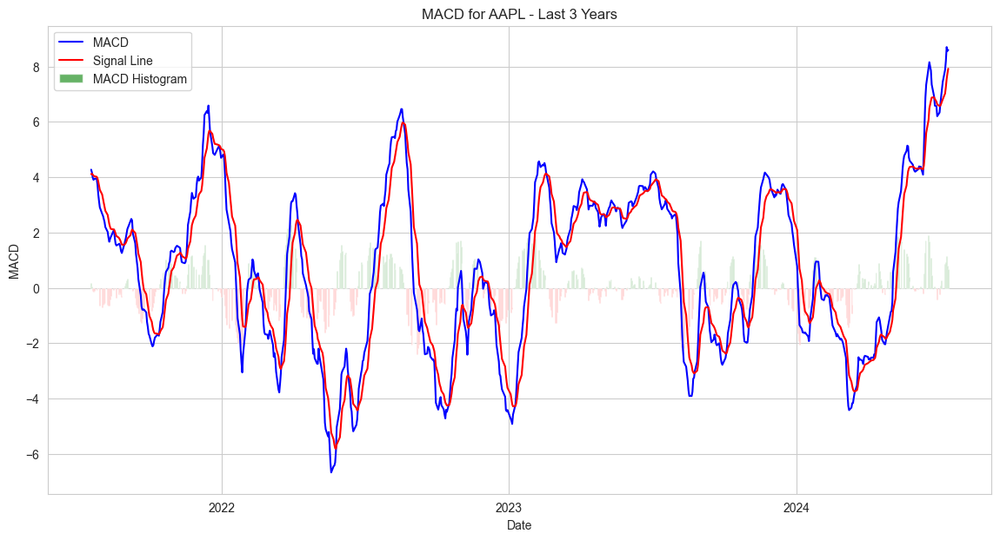

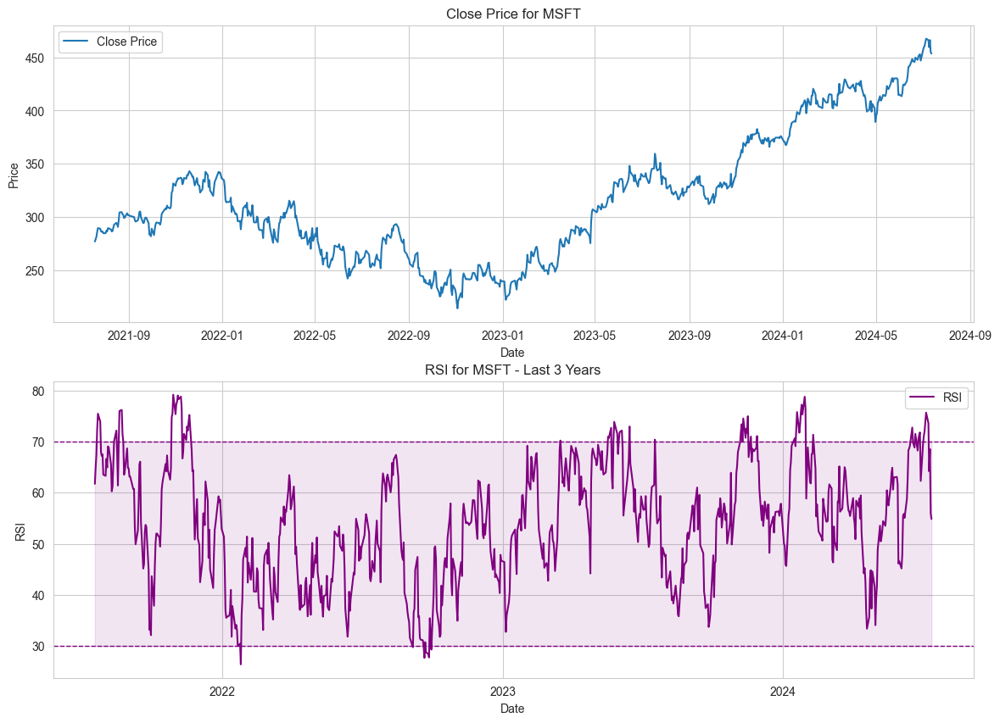

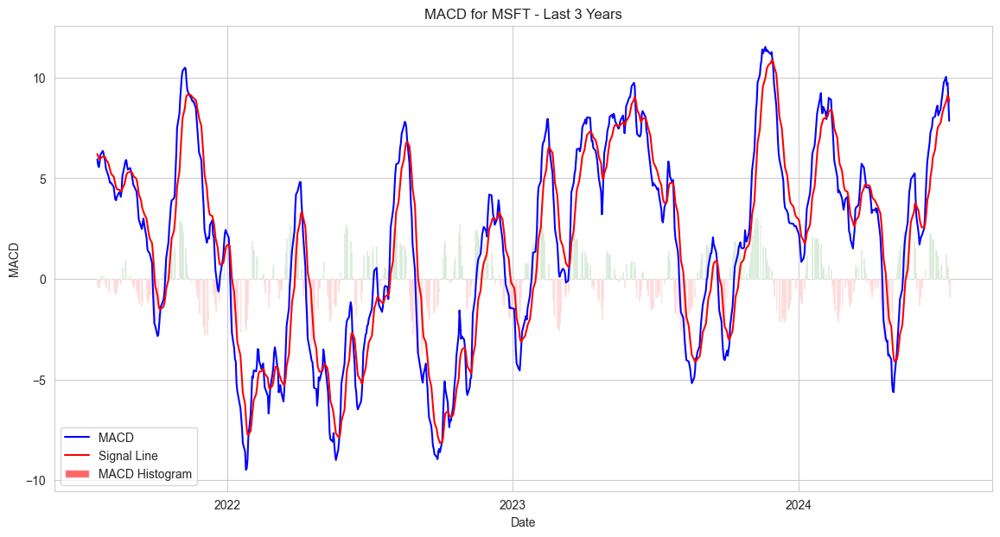

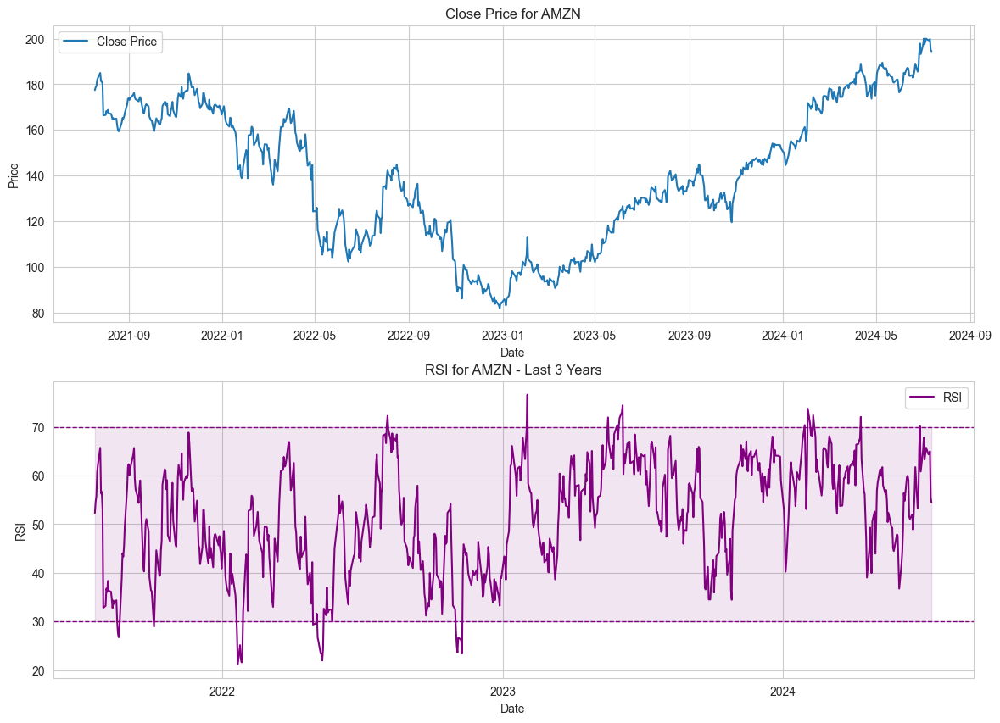

...

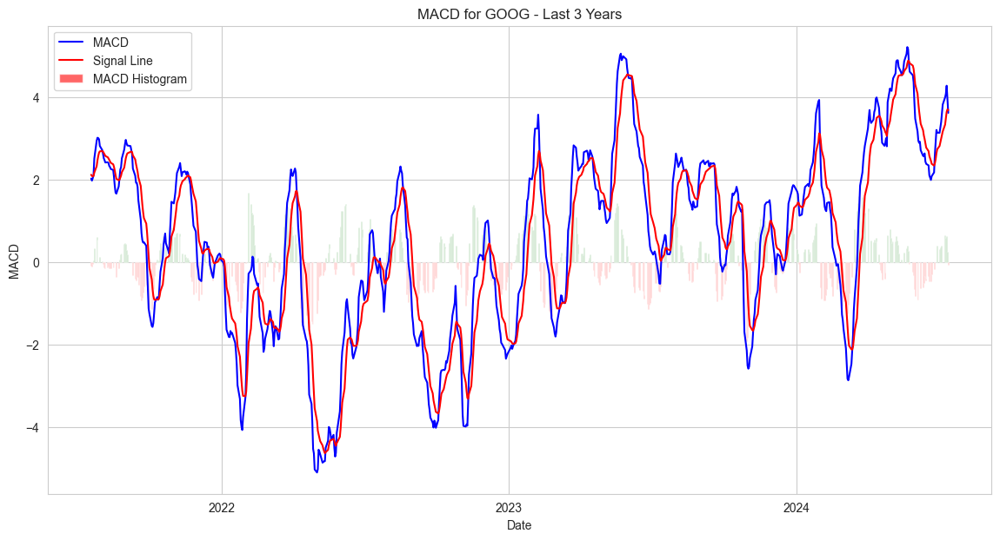

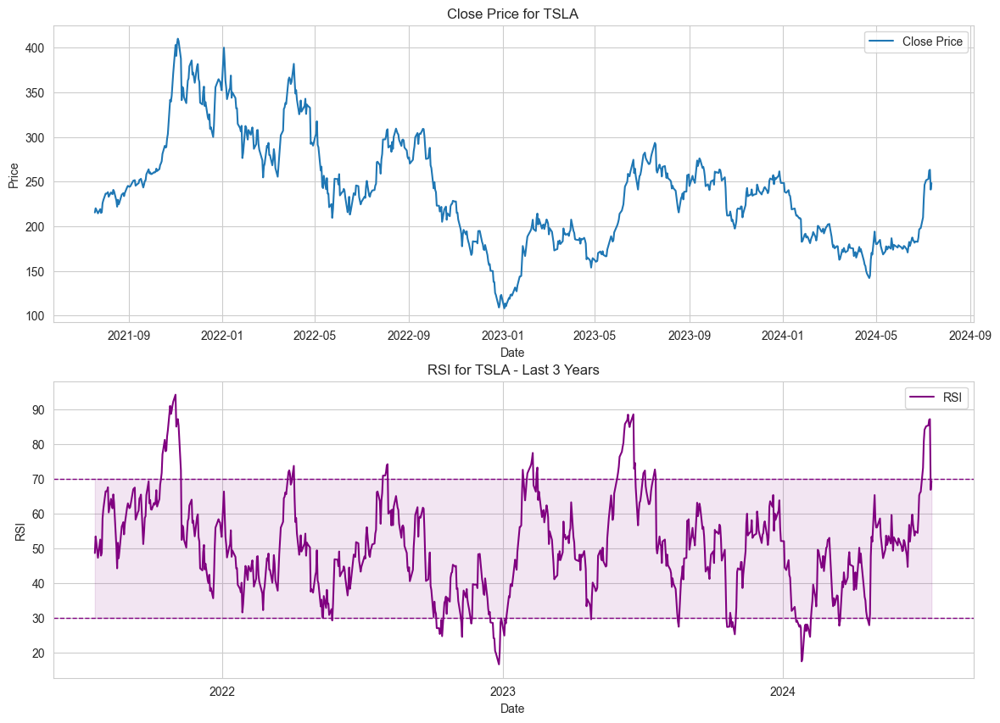

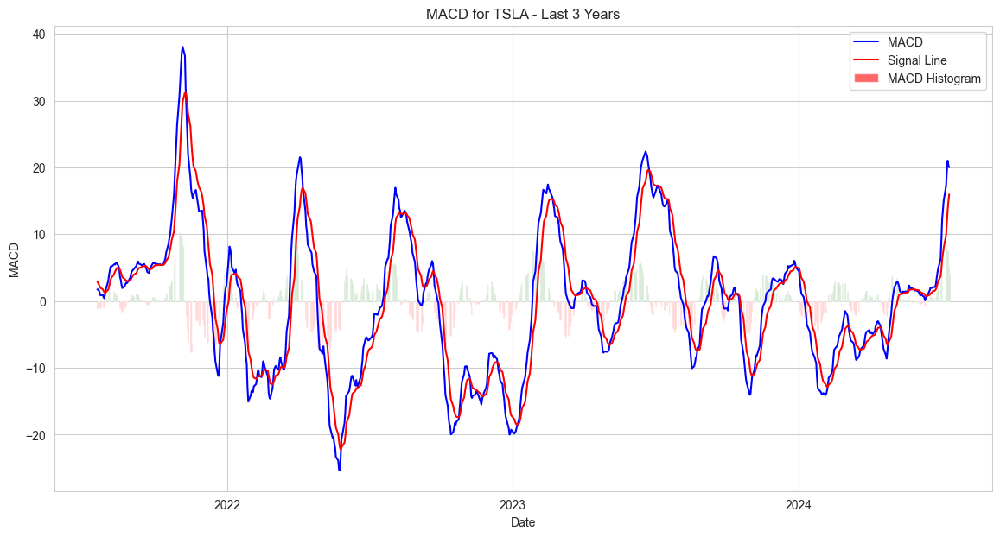

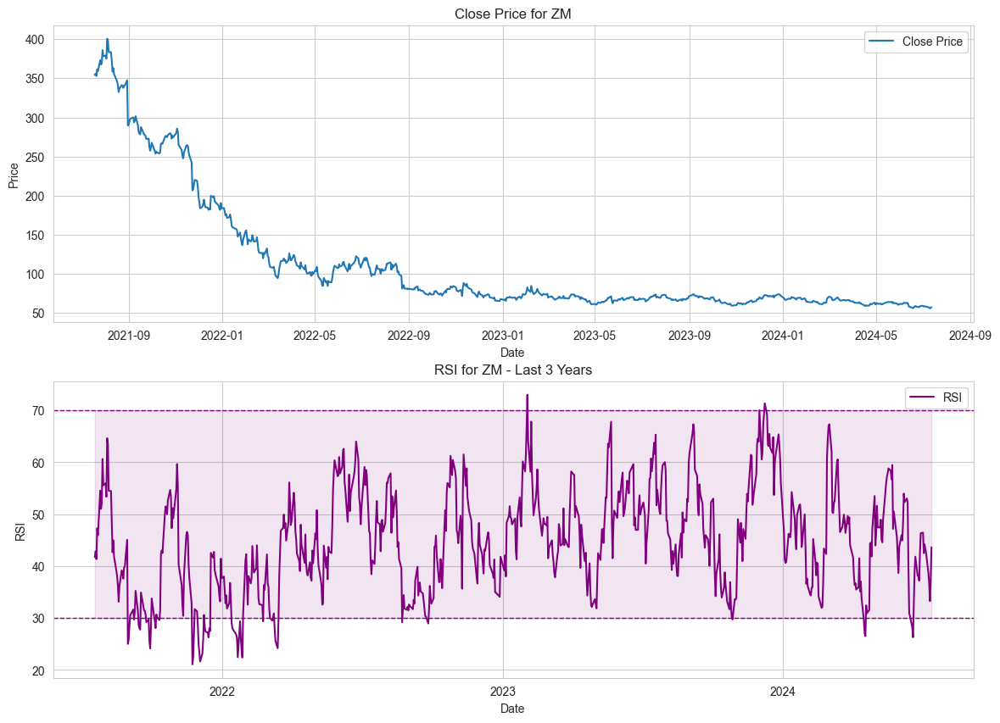

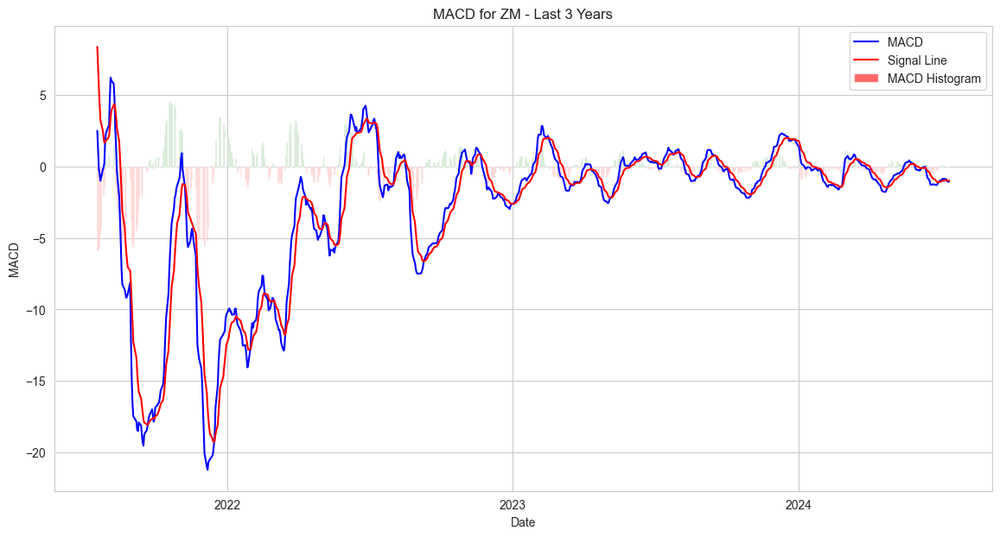

In [19]:
end_date = datetime.now()
start_date = end_date - timedelta(days=3*365)

for ticker in tickers:
    df = cleaned_data[ticker]
    df = calculate_macd(df)
    df = calculate_rsi(df)

    # Filter data for the last 3 years
    df_filtered = df[df['Date'] >= start_date]
    plot_close_price_with_rsi(df_filtered, ticker)
    plot_macd(ticker)

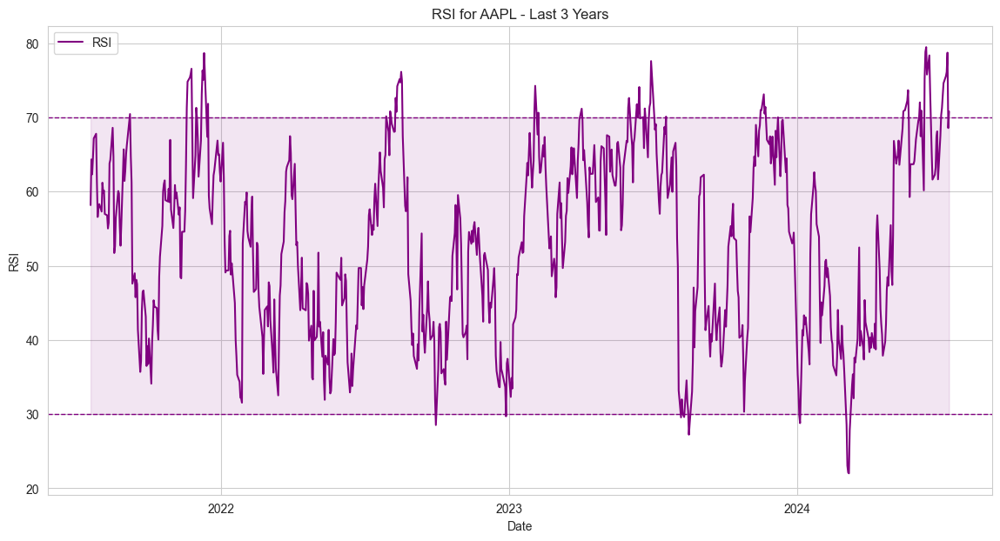

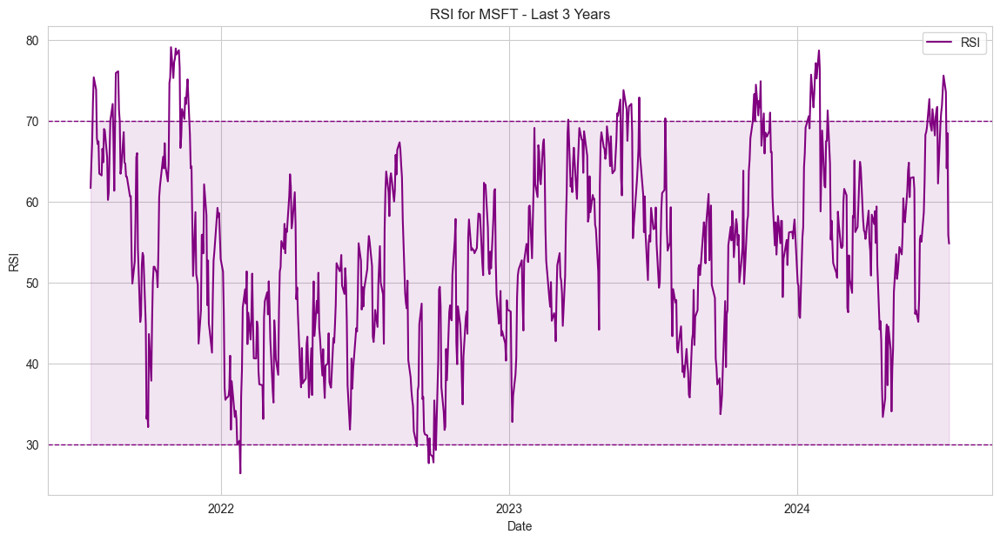

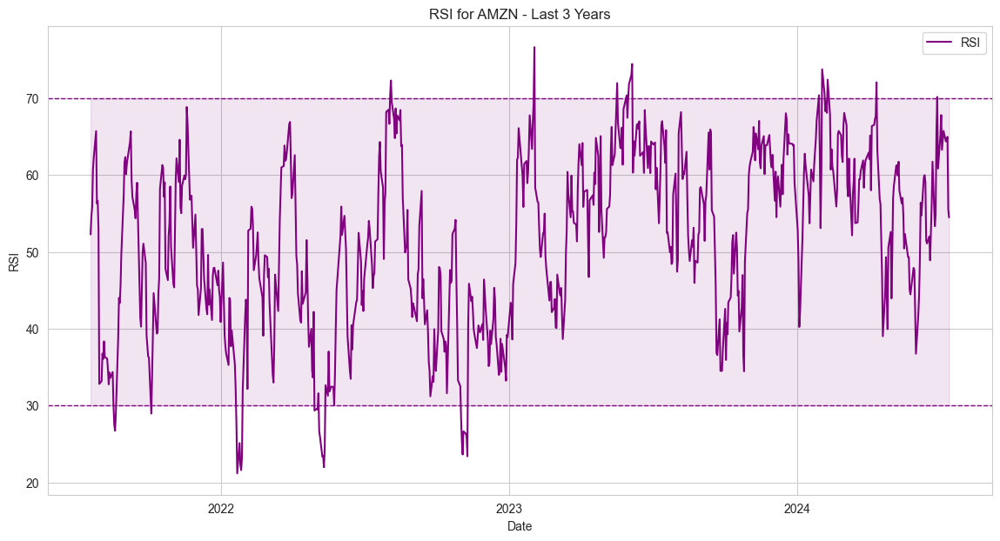

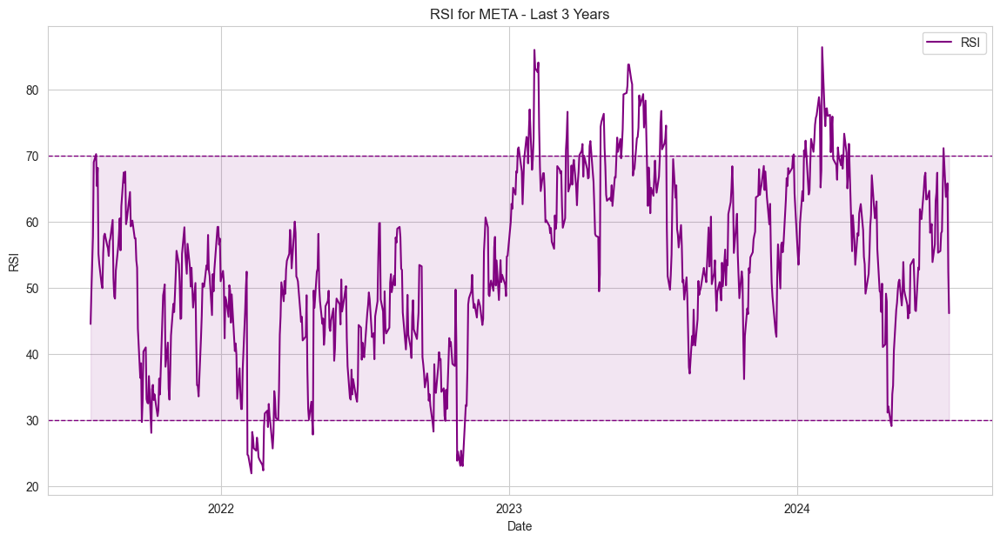

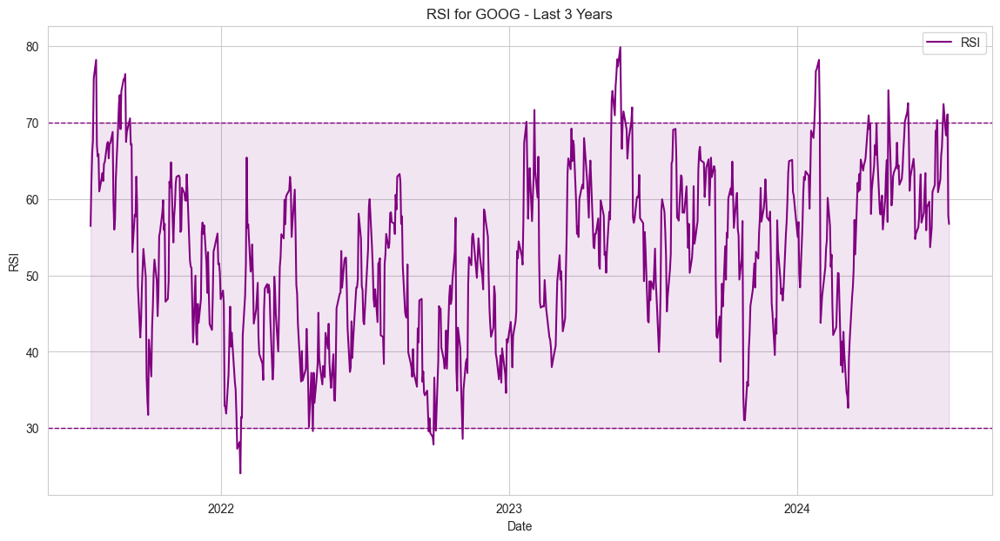

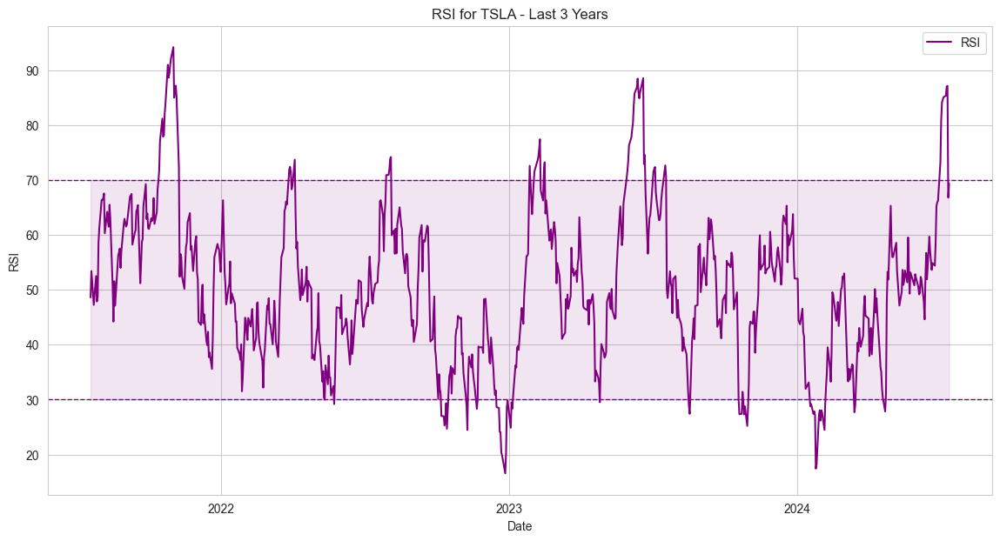

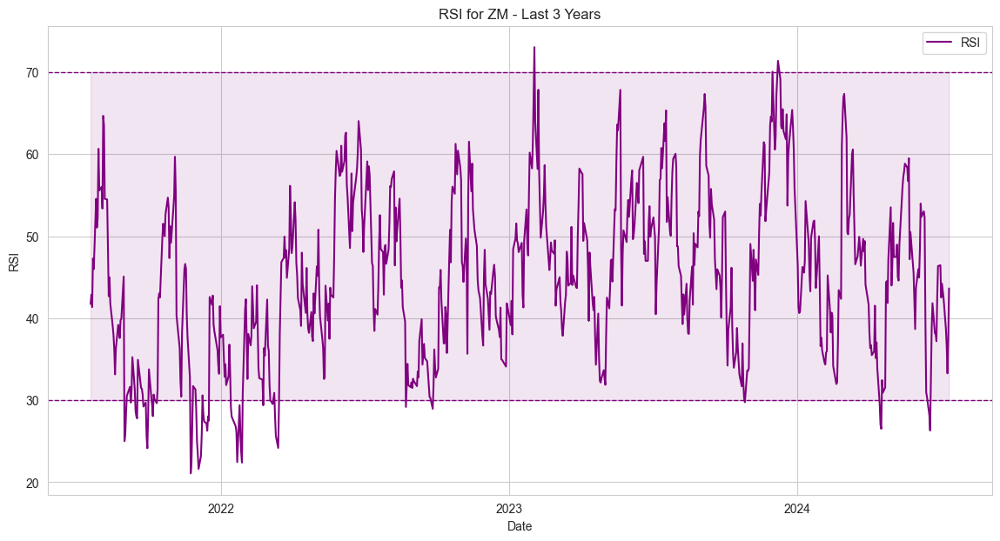

In [20]:
end_date = datetime.now()
start_date = end_date - timedelta(days=3*365)
for ticker in tickers:
    df = cleaned_data[ticker]
    df = calculate_rsi(df)
    plot_rsi(ticker)

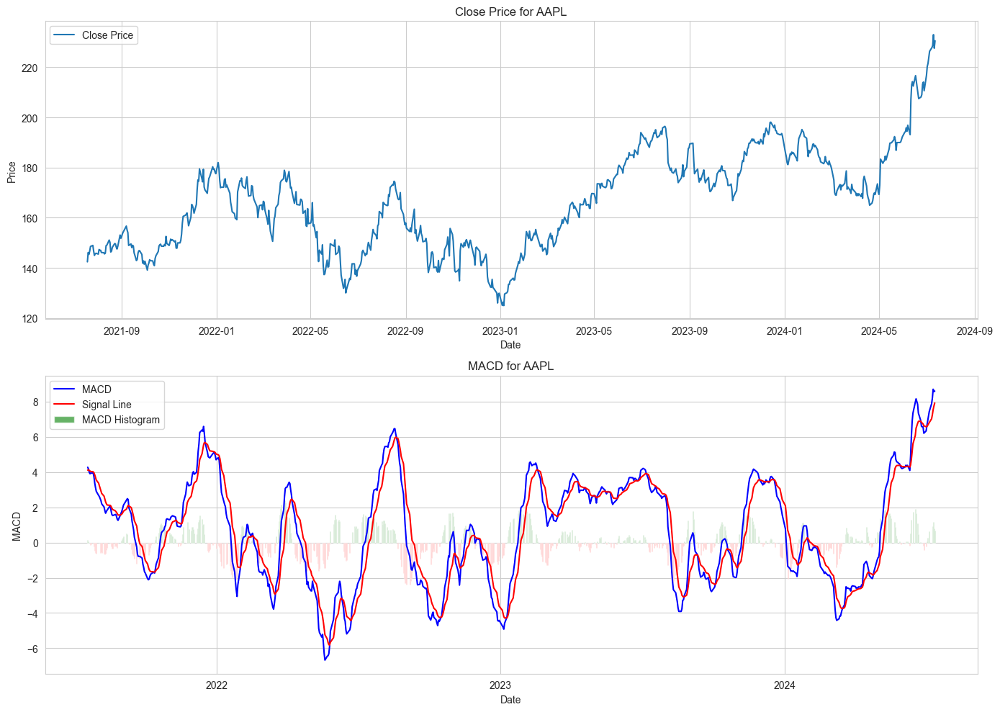

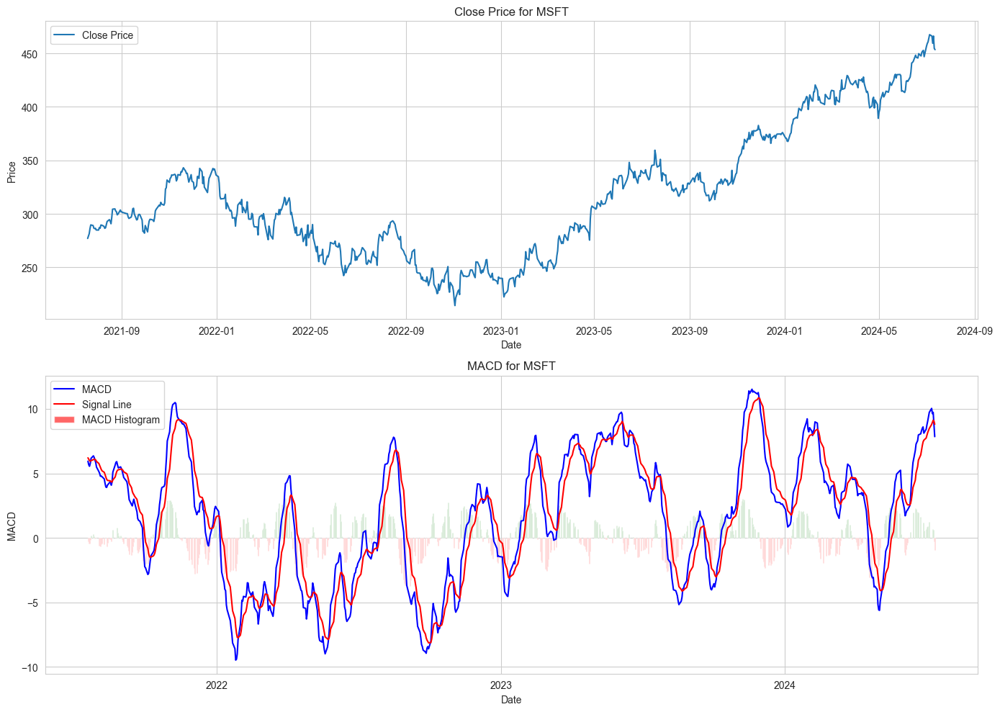

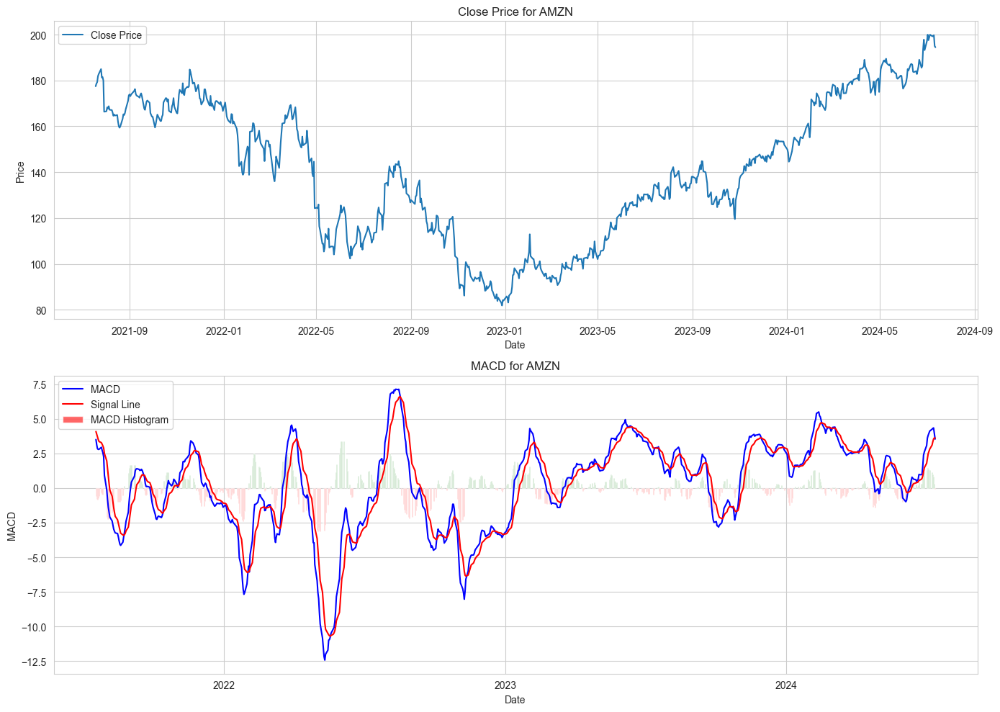

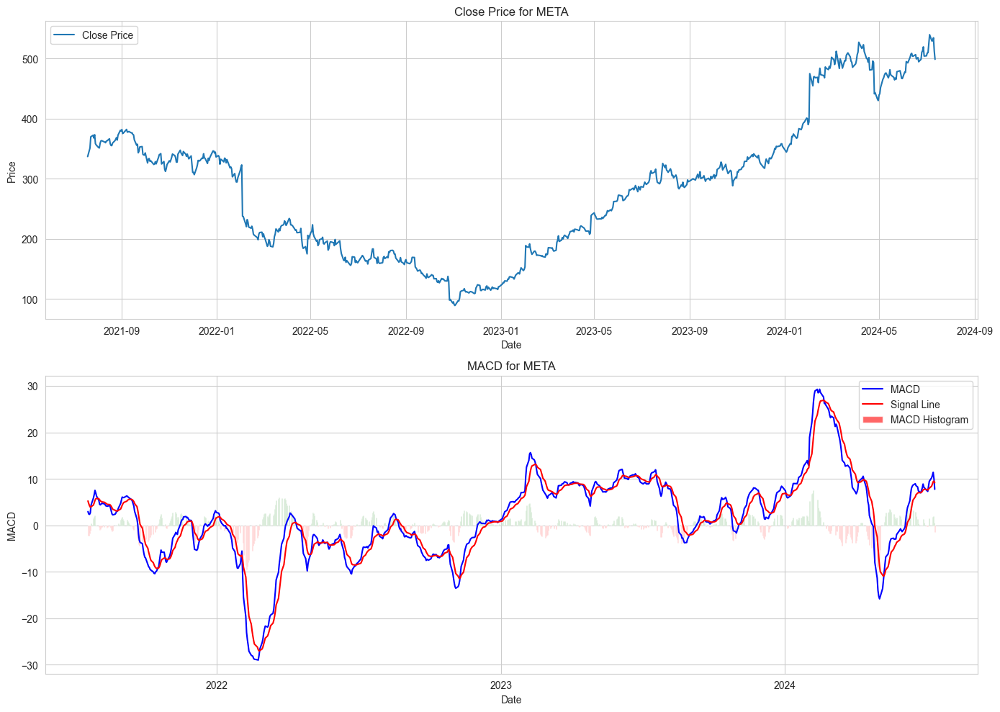

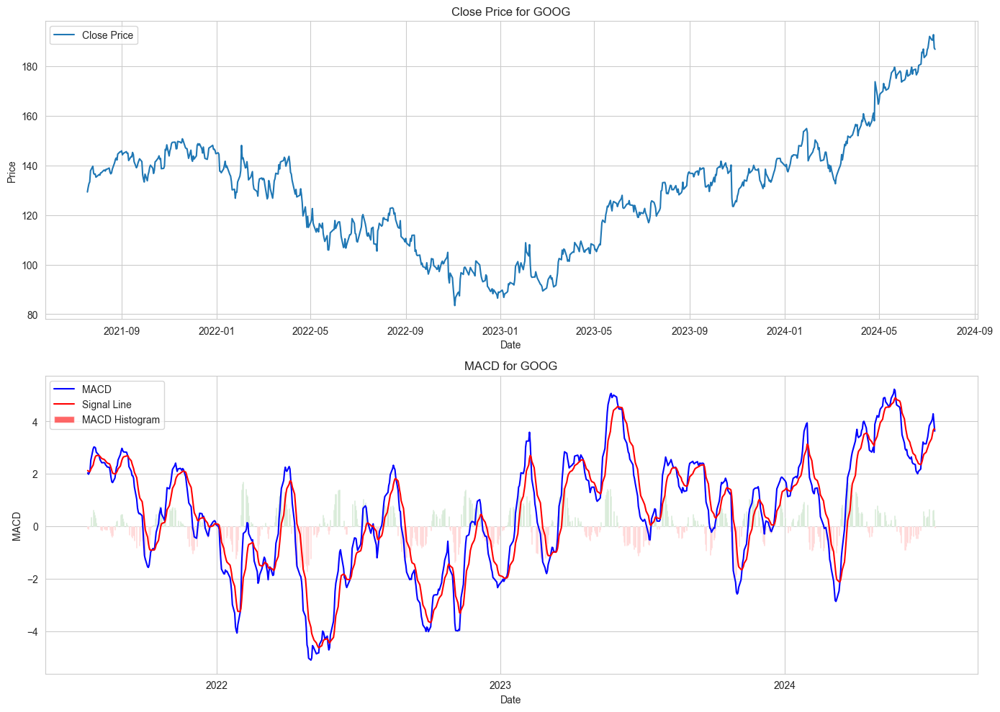

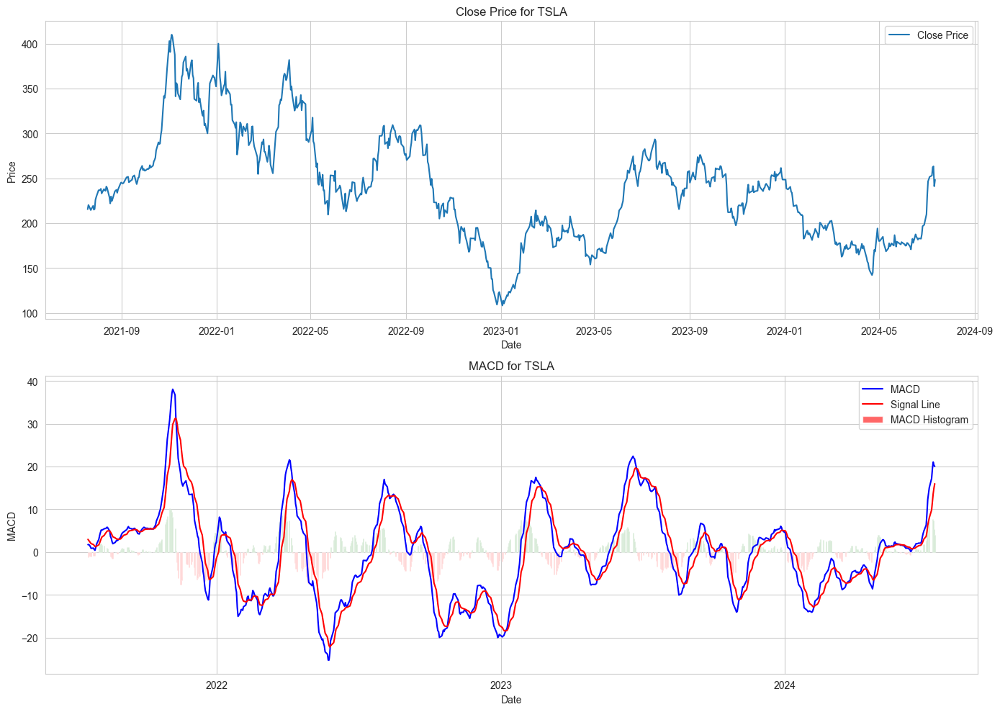

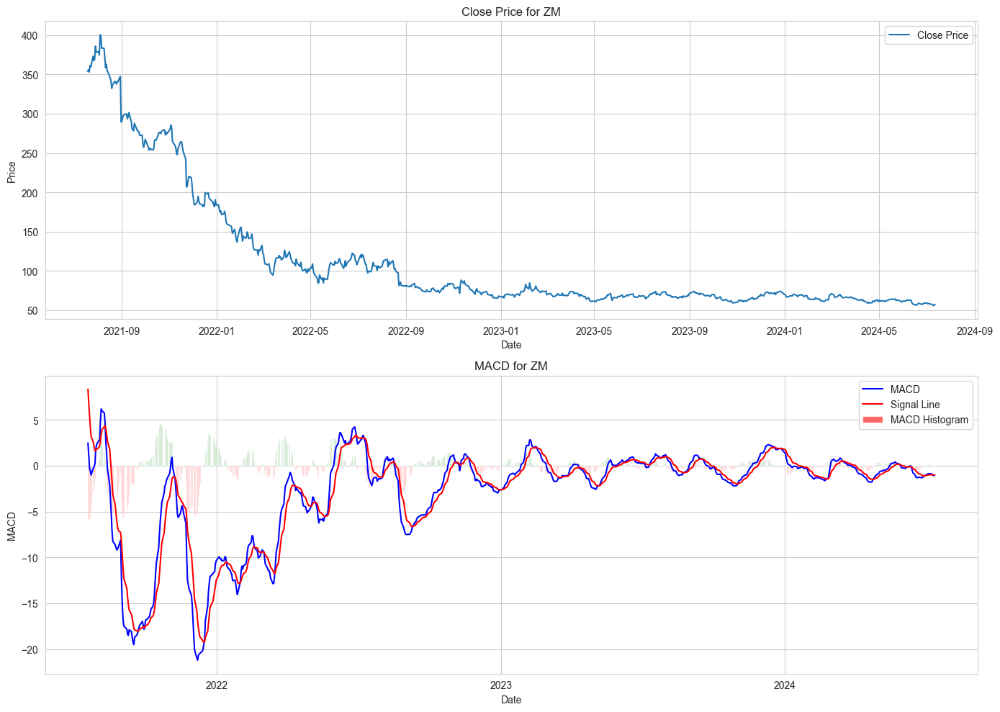

In [21]:

end_date = datetime.now()
start_date = end_date - timedelta(days=3*365)
for ticker in tickers:
    df = cleaned_data[ticker]
    df = calculate_macd(df)

    # Filter data for the last 3 years
    df_filtered = df[df['Date'] >= start_date]
    plot_close_price_with_macd(df_filtered, ticker)


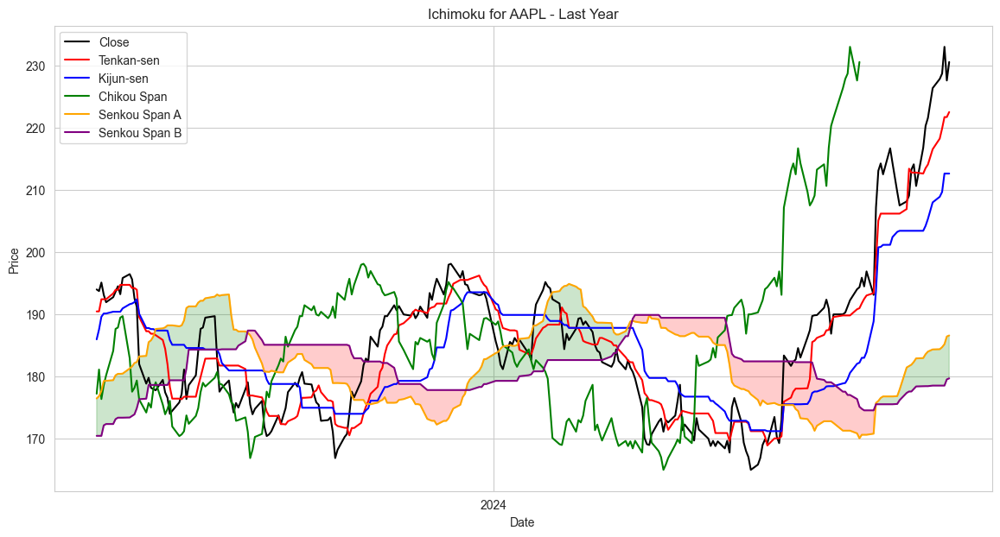

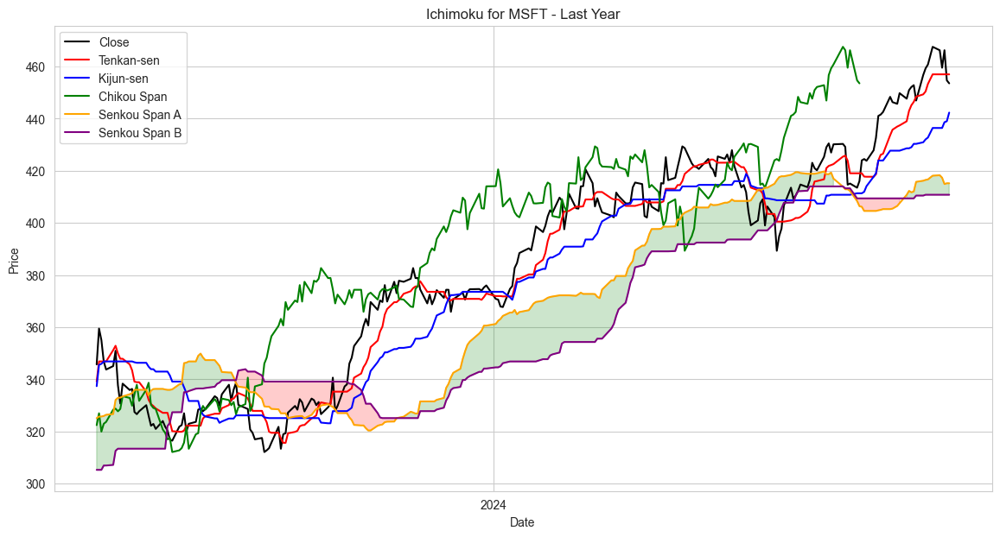

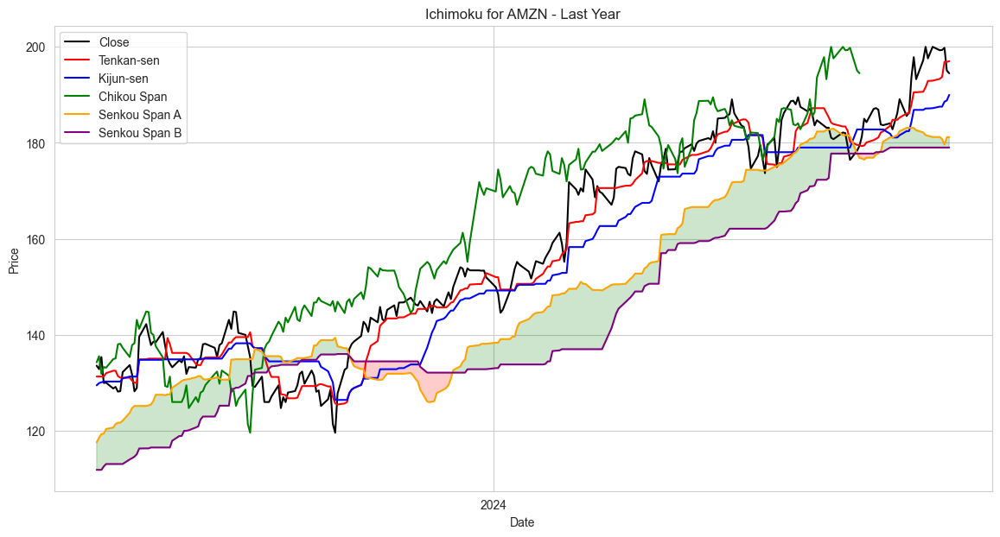

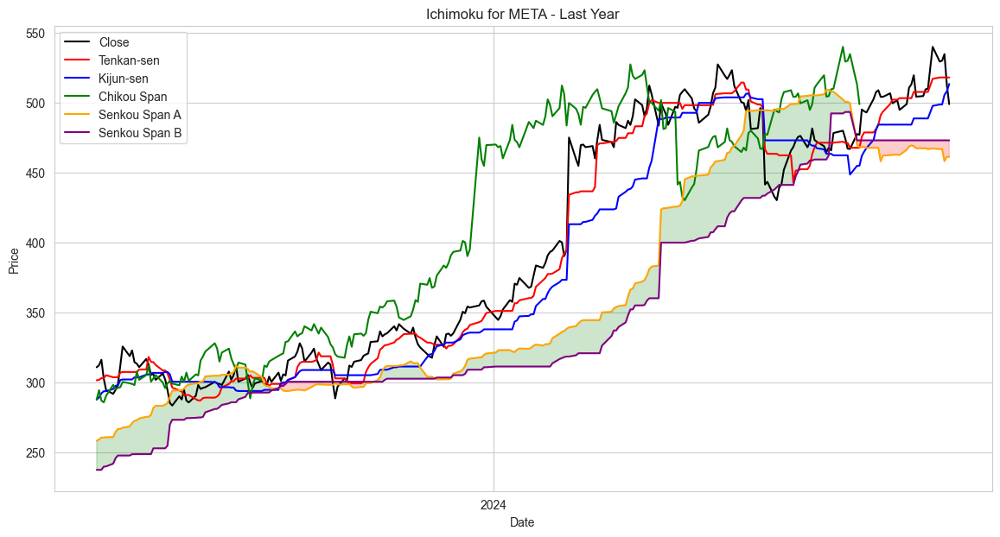

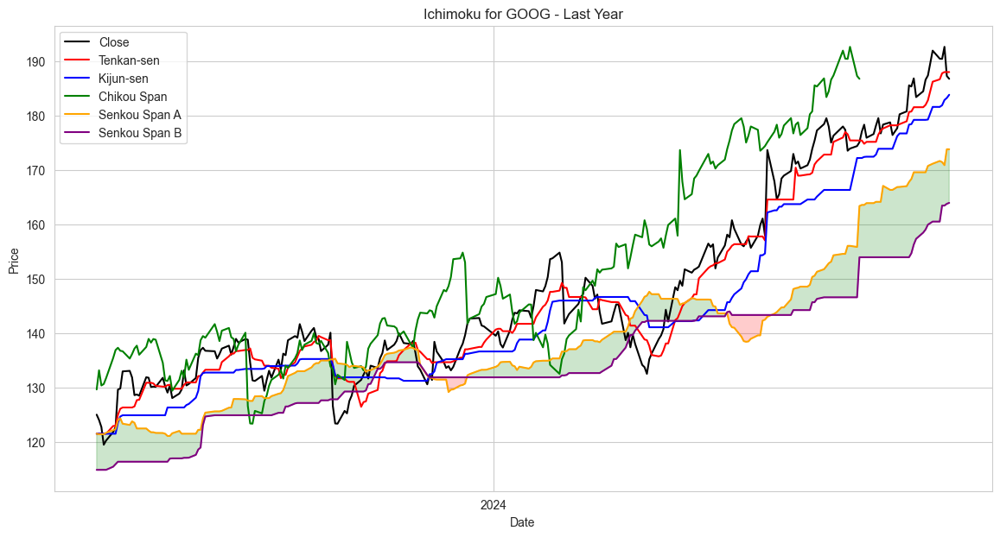

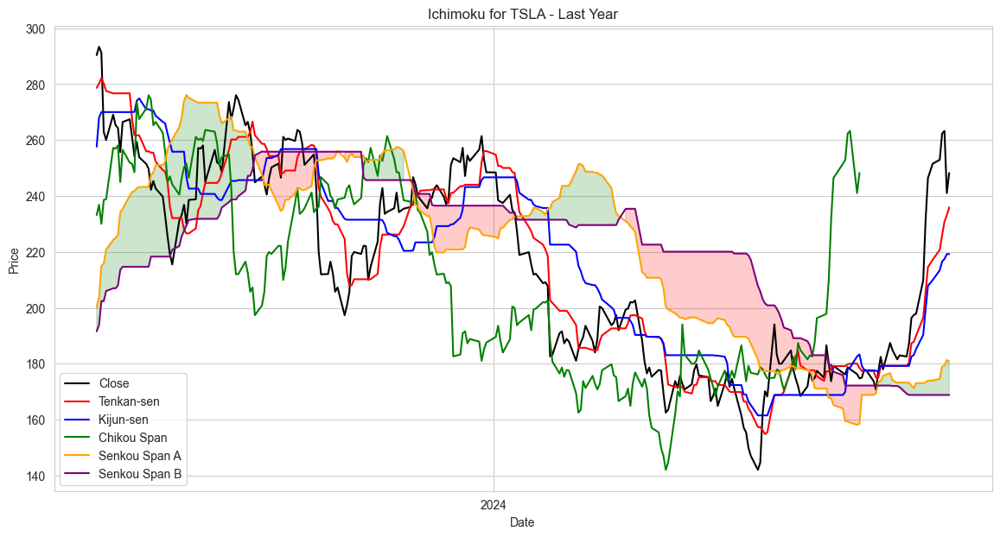

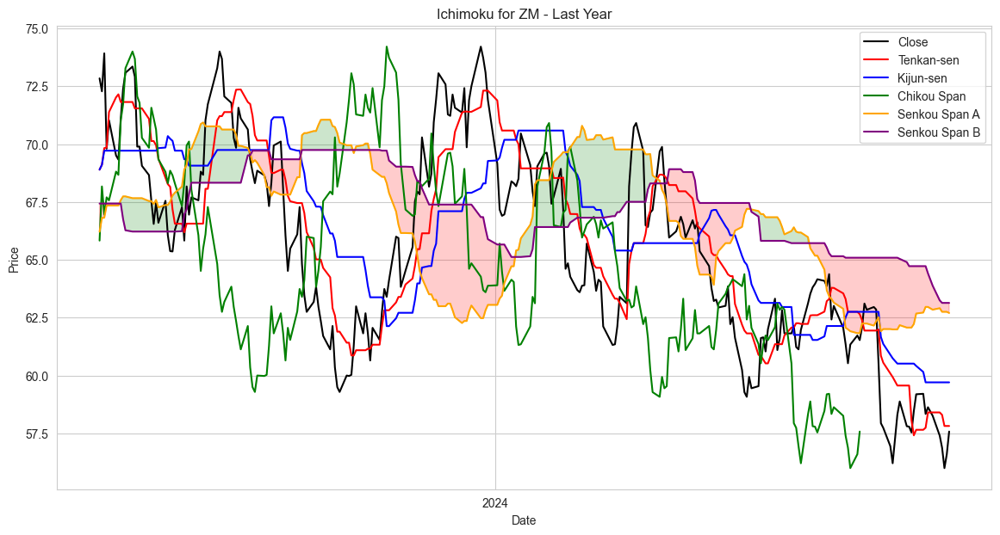

In [22]:

plot_closing_price_and_ichimoku(tickers, cleaned_data)

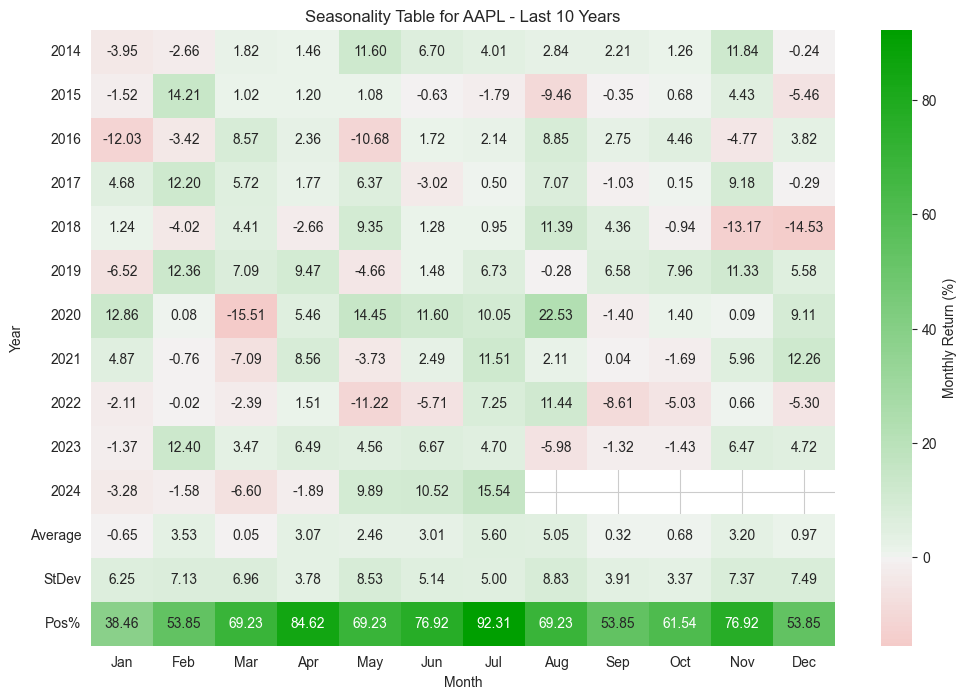

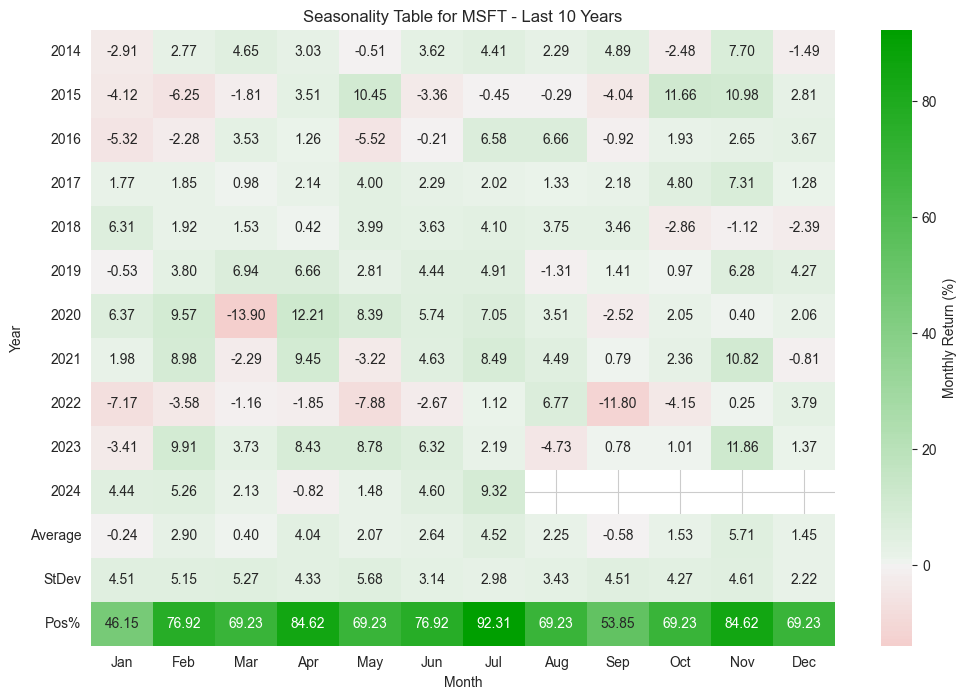

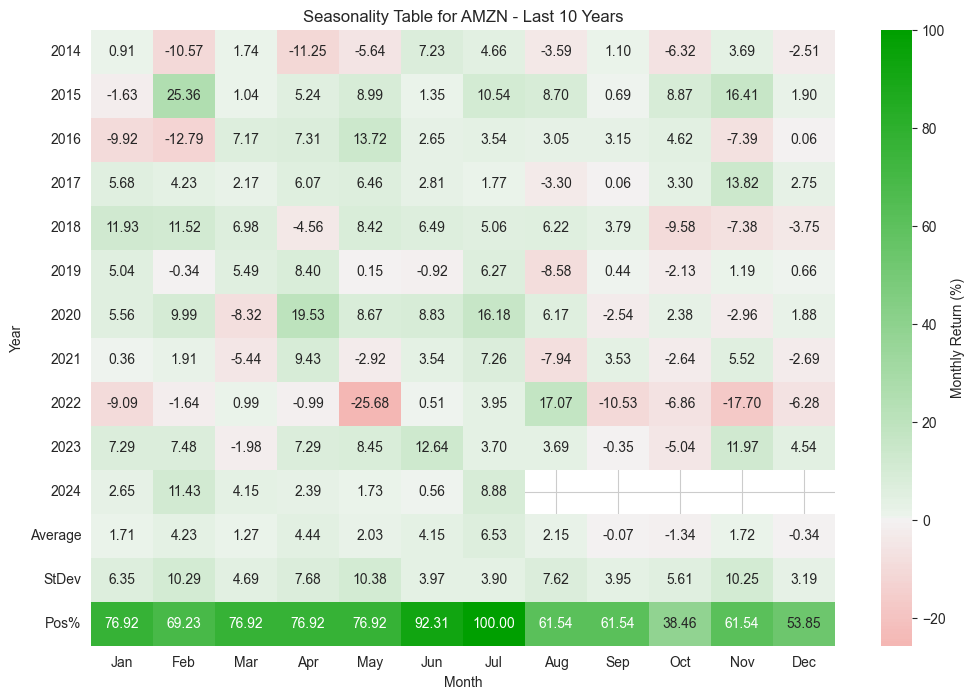

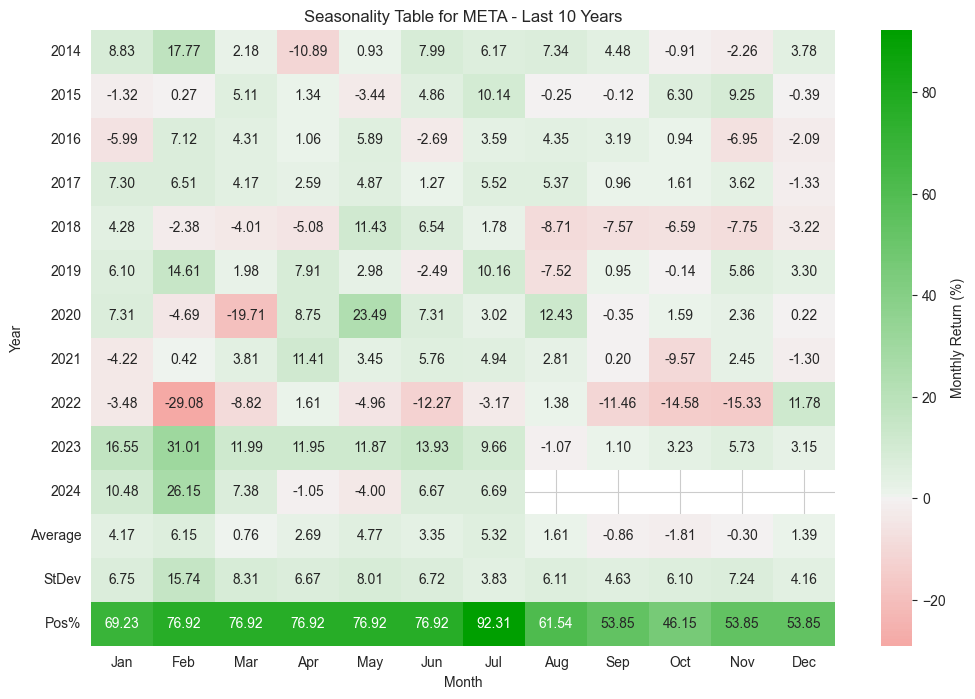

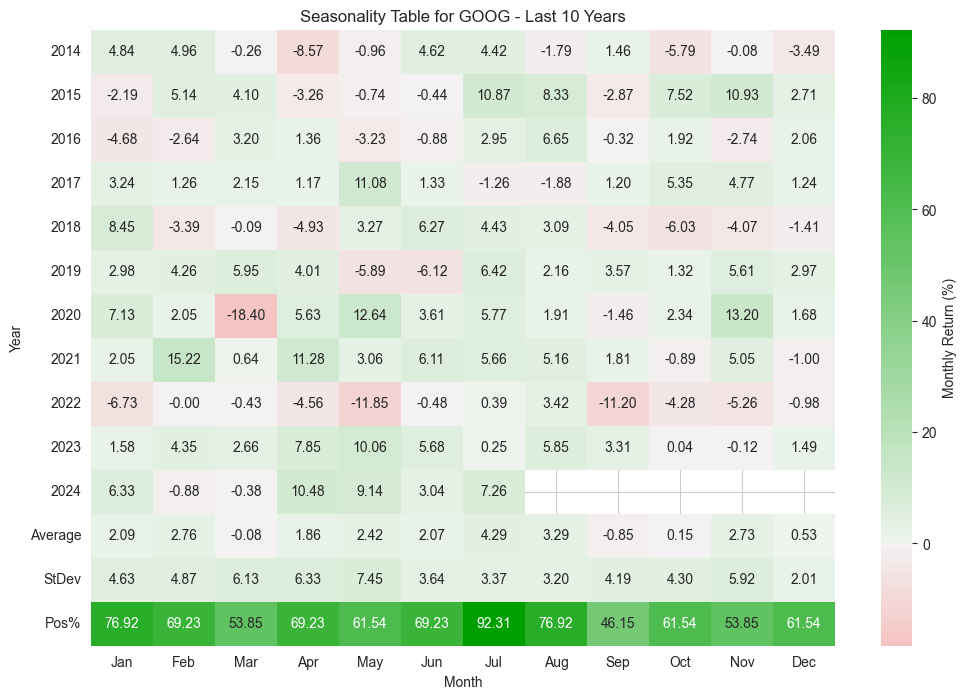

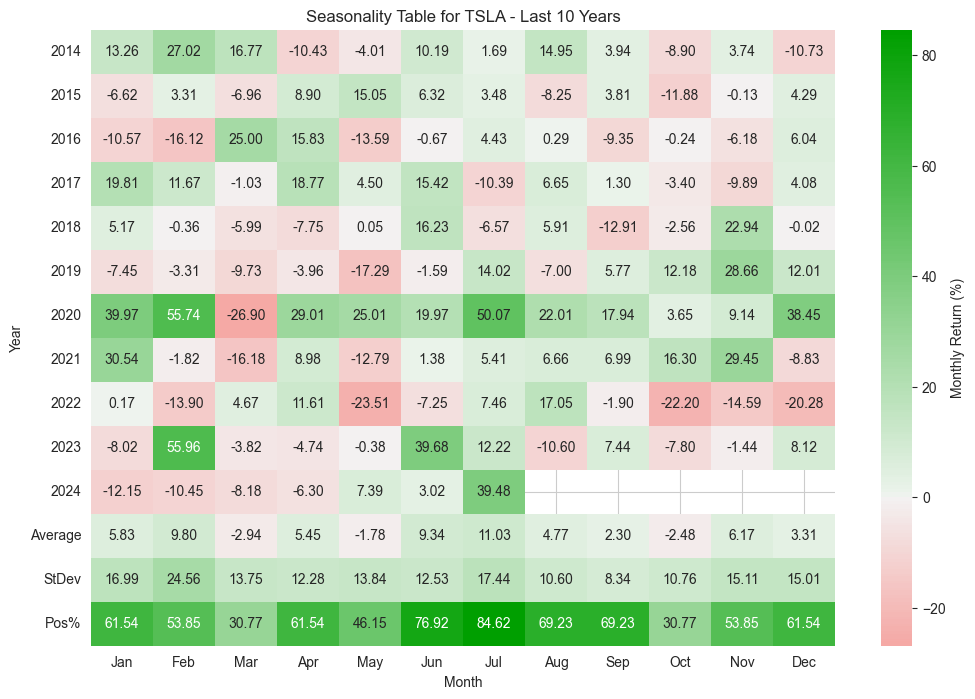

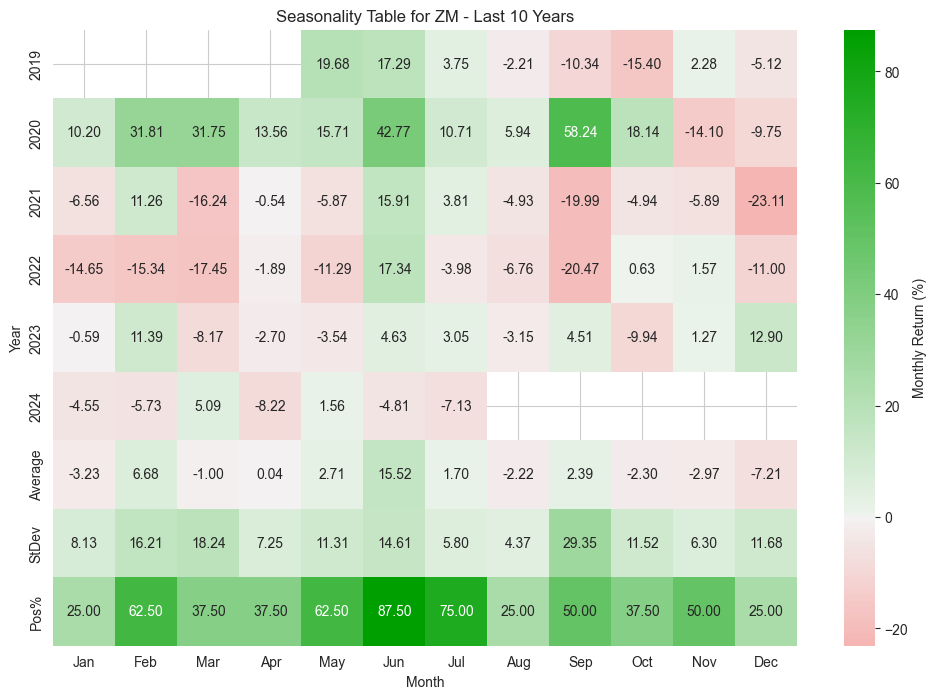

In [23]:
process_and_plot_seasonality(2014)

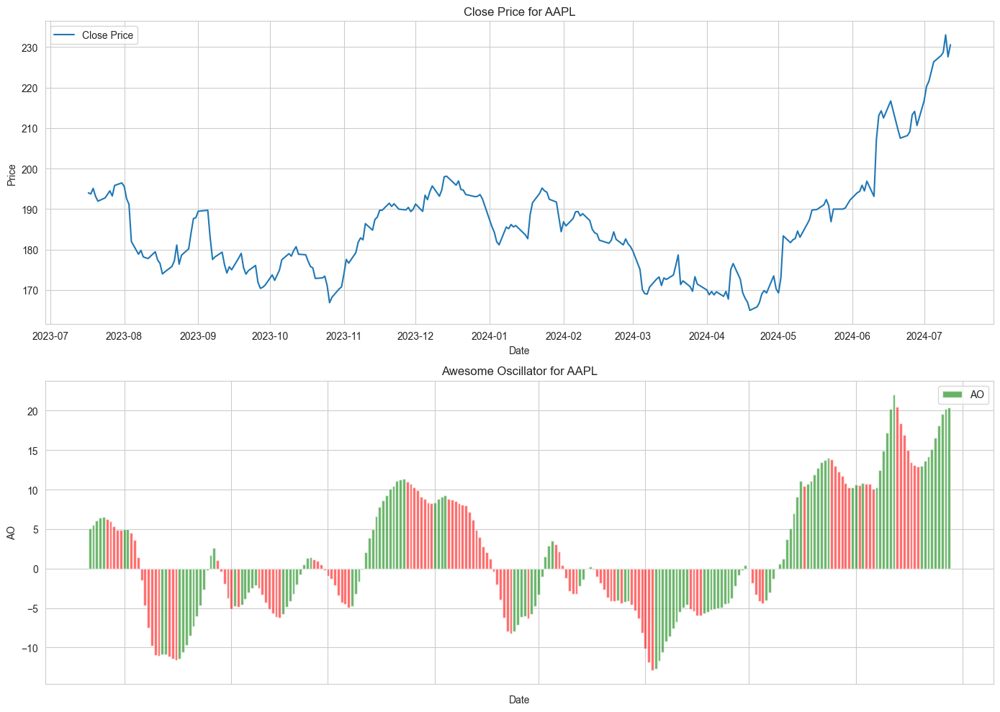

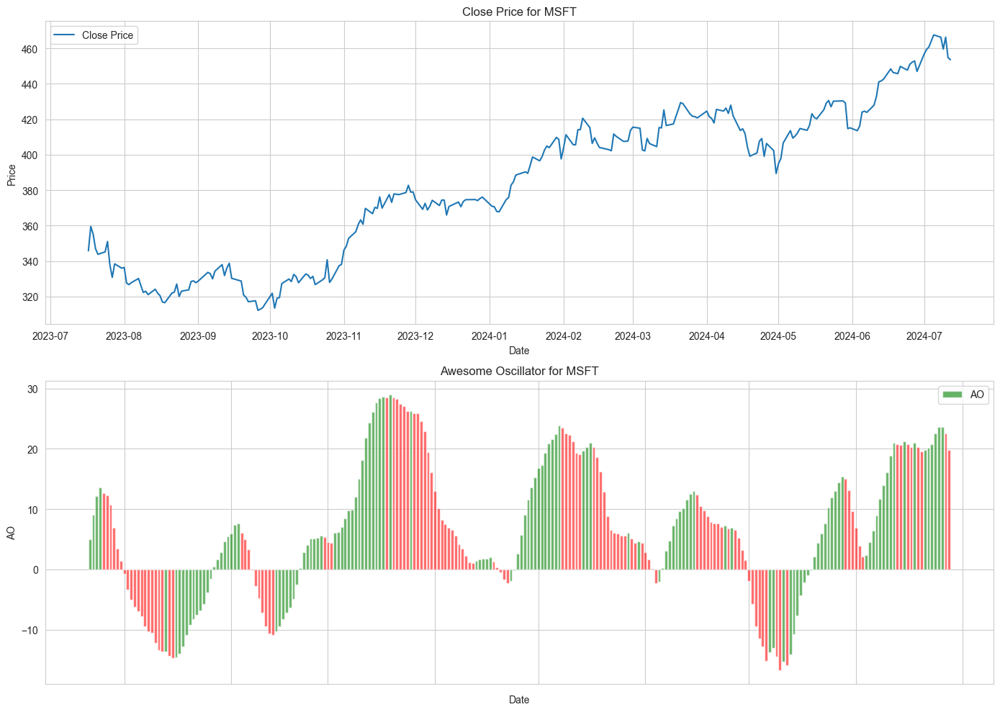

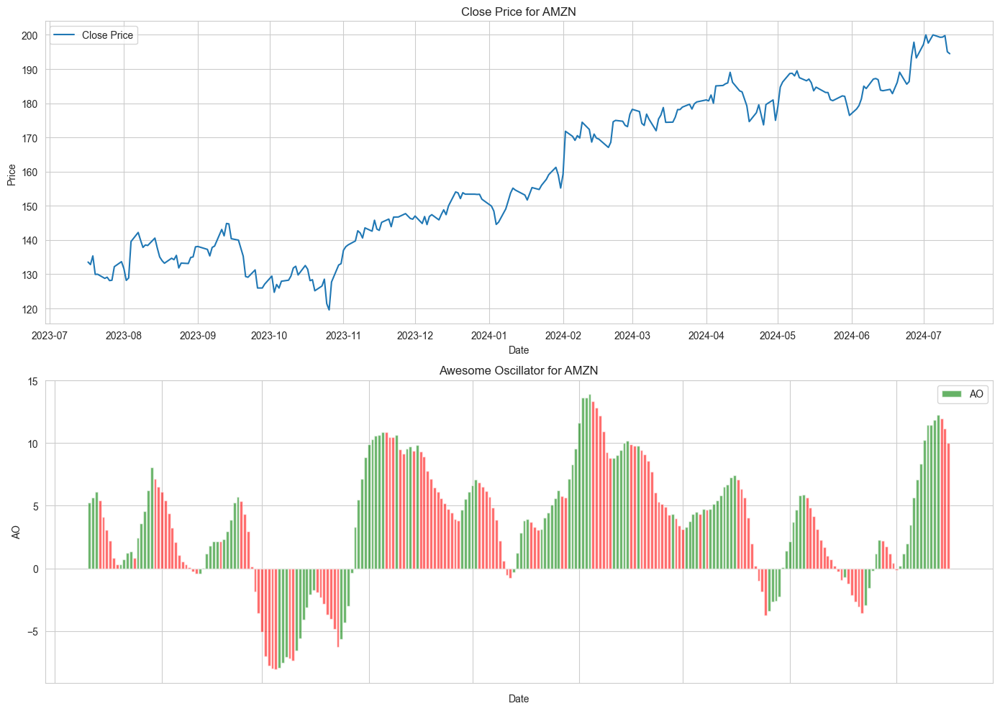

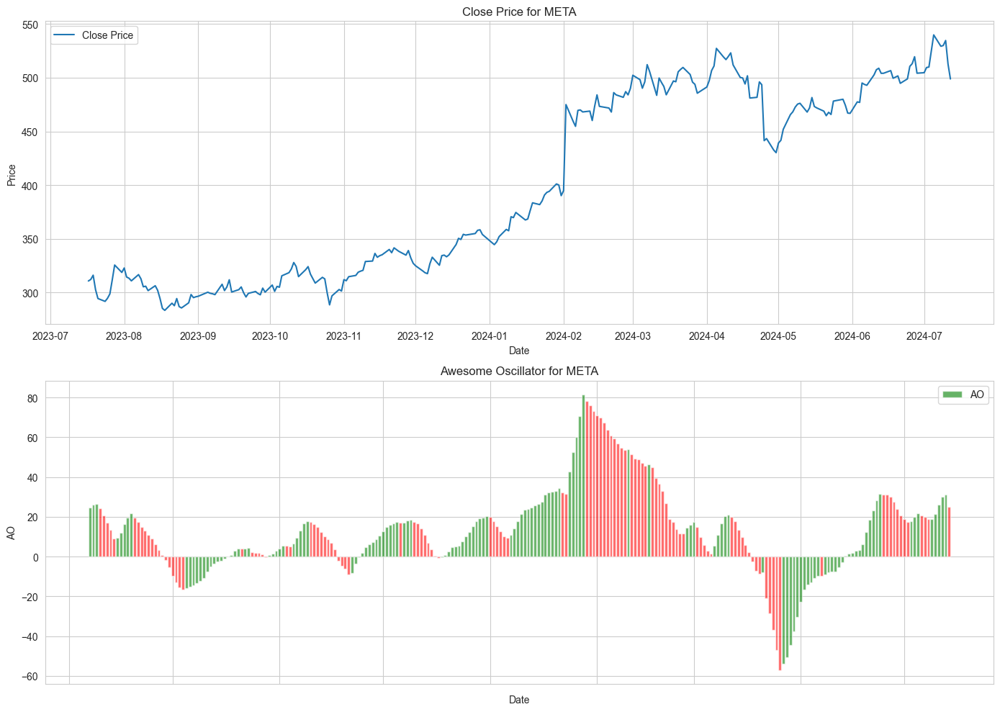

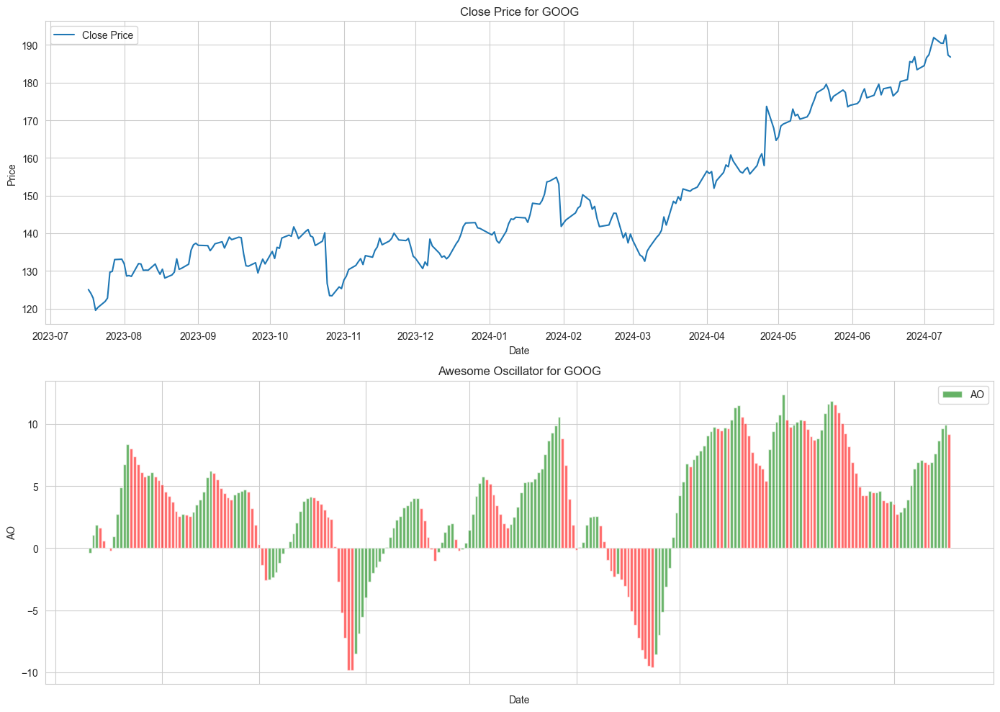

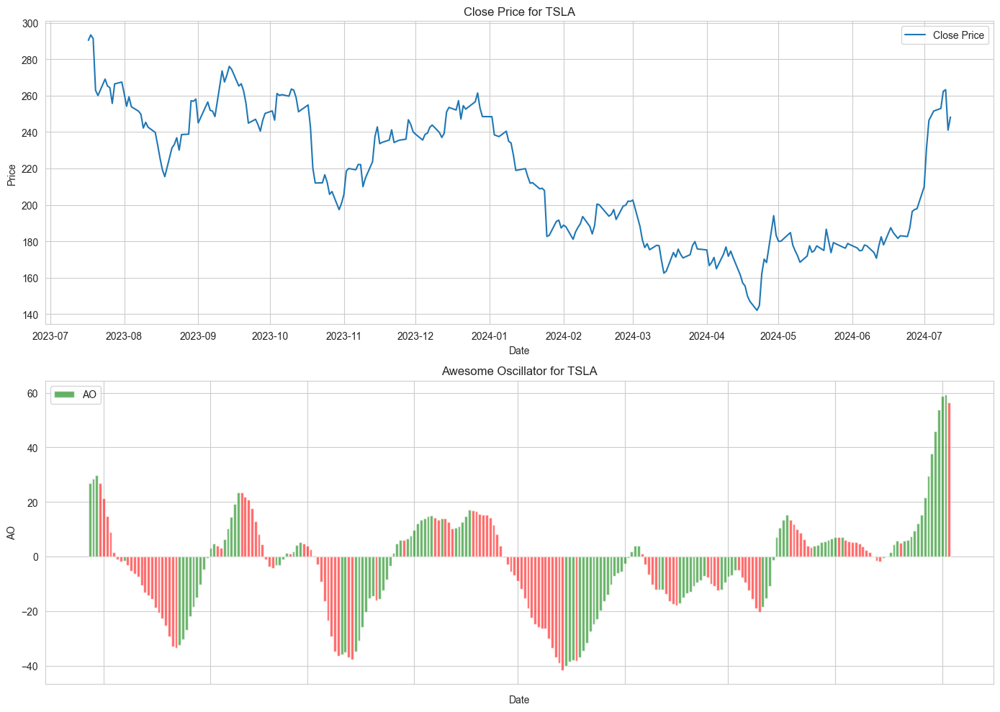

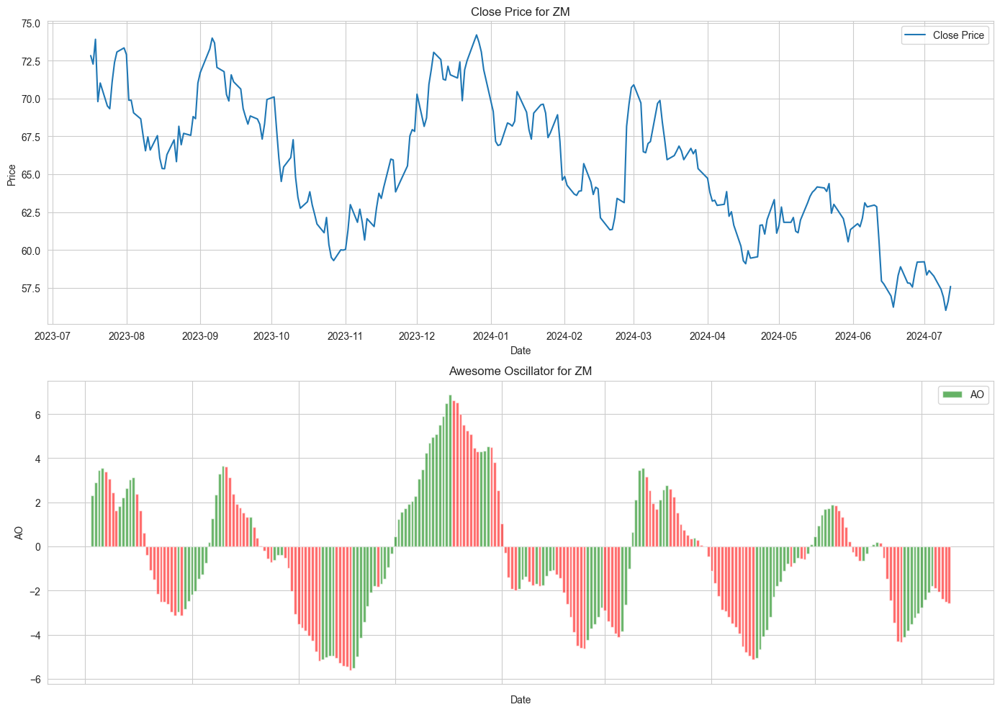

In [24]:
for ticker, df in cleaned_data.items():
    df = calculate_ao(df)
    cleaned_data[ticker] = df
    plot_close_price_with_ao(df, ticker)

In [25]:
def ensure_datetime_index(df):
    """
    Ensure that the DataFrame has a datetime index.
    :param df (pd.DataFrame): Input DataFrame
    :return: pd.DataFrame with datetime index
    """
    if df.index.name != 'Date':
        if 'Date' in df.columns:
            df['Date'] = pd.to_datetime(df['Date'])
            df.set_index('Date', inplace=True)
    return df

def calculate_indicators(df):
    df = ensure_datetime_index(df)

    # RSI
    df = calculate_rsi(df)

    # MACD
    df = calculate_macd(df)

    # Awesome Oscillator (AO)
    df = calculate_ao(df)

    # Ichimoku
    df = calculate_ichimoku(df)

    # Moving Averages
    df = calculate_moving_average(df, 'Close', 20)
    df = calculate_moving_average(df, 'Close', 50)

    # Bollinger Bands
    df = calculate_bollinger_bands(df)

    # Seasonality
    df = calculate_monthly_returns(df)

    return df

# Appliquer les calculs à chaque DataFrame
for ticker, df in cleaned_data.items():
    cleaned_data[ticker] = calculate_indicators(df)


In [57]:
from datetime import datetime, timedelta
import pandas as pd
import numpy as np


strategies = ['ao', 'rsi', 'macd', 'ichimoku', 'ma', 'bollinger','seasonality']
results = []

for strategy in strategies:
    final_value, portfolio = simulate_portfolio(cleaned_data, risk_profile='modéré', strategy=strategy)
    results.append({
        'Strategy': strategy,
        'Final Value': final_value,
        'Portfolio': portfolio
    })

for result in results:
    print(f"Strategy: {result['Strategy']}")
    print(f"Final Value: {result['Final Value']}")
    print(f"Portfolio: {result['Portfolio']}")
    print("\n")


Strategy: ao
Final Value: 11177.93978881836
Portfolio: {'AAPL': 7, 'MSFT': 1, 'AMZN': 4, 'META': 1, 'GOOG': 6, 'TSLA': 5, 'ZM': 0}


Strategy: rsi
Final Value: 10254.899894714355
Portfolio: {'AAPL': 0, 'MSFT': 0, 'AMZN': 0, 'META': 0, 'GOOG': 0, 'TSLA': 0, 'ZM': 18}


Strategy: macd
Final Value: 10775.509796142578
Portfolio: {'AAPL': 3, 'MSFT': 0, 'AMZN': 0, 'META': 0, 'GOOG': 0, 'TSLA': 5, 'ZM': 0}


Strategy: ichimoku
Final Value: 11190.179885864258
Portfolio: {'AAPL': 7, 'MSFT': 2, 'AMZN': 5, 'META': 1, 'GOOG': 5, 'TSLA': 4, 'ZM': 0}


Strategy: ma
Final Value: 11289.839866638184
Portfolio: {'AAPL': 6, 'MSFT': 2, 'AMZN': 4, 'META': 1, 'GOOG': 5, 'TSLA': 6, 'ZM': 0}


Strategy: bollinger
Final Value: 10345.00993347168
Portfolio: {'AAPL': 0, 'MSFT': 0, 'AMZN': 0, 'META': 0, 'GOOG': 0, 'TSLA': 0, 'ZM': 18}


Strategy: seasonality
Final Value: 11170.279891967773
Portfolio: {'AAPL': 8, 'MSFT': 1, 'AMZN': 5, 'META': 0, 'GOOG': 5, 'TSLA': 5, 'ZM': 0}




In [58]:
def simulate_combined_strategy(data, initial_balance=10000, risk_profile='everything', months=6):
    allocations = {
        'conservateur': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15},
        'modéré': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15},
        'agressif': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15},
        'everything': {'AAPL': 0.15, 'MSFT': 0.15, 'AMZN': 0.15, 'GOOG': 0.15, 'TSLA': 0.15, 'ZM': 0.15, 'META': 0.15}
    }

    risk_parameters = {
        'conservateur': {'buy_threshold': 2, 'sell_threshold': 1},
        'modéré': {'buy_threshold': 1, 'sell_threshold': 2},
        'agressif': {'buy_threshold': 1, 'sell_threshold': 3}
    }

    if risk_profile not in allocations or risk_profile not in risk_parameters:
        raise ValueError(f"Invalid risk profile: {risk_profile}. Choose from {list(allocations.keys())}")

    portfolio = {ticker: 0 for ticker in data.keys()}
    balance = initial_balance

    start_date = (datetime.now() - timedelta(days=months*30)).strftime('%Y-%m-%d')
    end_date = datetime.now().strftime('%Y-%m-%d')

    date_range = pd.date_range(start=start_date, end=end_date, freq='D').strftime('%Y-%m-%d')

    total_buy_signals = 0
    total_sell_signals = 0

    buy_threshold = risk_parameters[risk_profile]['buy_threshold']
    sell_threshold = risk_parameters[risk_profile]['sell_threshold']
    print(f"Buy threshold: {buy_threshold}")
    print(f"Sell threshold: {sell_threshold}")
    for ticker, df in data.items():
        try:
            df['Date'] = pd.to_datetime(df['Date'])
            df.set_index('Date', inplace=True)
        except:
            pass

    for date in date_range:
        for ticker, df in data.items():
            try:
                if date in df.index:
                    allocation = allocations[risk_profile].get(ticker, 0)
                    amount_to_invest = balance * allocation

                    ao = df.loc[date, 'AO']
                    rsi = df.loc[date, 'RSI']
                    macd = df.loc[date, 'MACD']
                    signal_line = df.loc[date, 'Signal Line']
                    tenkan_sen = df.loc[date, 'Tenkan_sen']
                    kijun_sen = df.loc[date, 'Kijun_sen']
                    ma_short = df.loc[date, 'MA_20']
                    ma_long = df.loc[date, 'MA_50']
                    close = df.loc[date, 'Close']
                    lower_band = df.loc[date, 'Lower Band']
                    upper_band = df.loc[date, 'Upper Band']
                    monthly_avg = df.loc[date, 'Monthly Return']
                    buy_signals = 0
                    sell_signals = 0

                    if ao > 0:
                        buy_signals += 1
                    if rsi < 30:
                        buy_signals += 1
                    if macd > signal_line:
                        buy_signals += 1
                    if tenkan_sen > kijun_sen:
                        buy_signals += 1
                    if ma_short > ma_long:
                        buy_signals += 1
                    if close < lower_band:
                        buy_signals += 1
                    if monthly_avg > 0:
                        buy_signals += 1

                    if ao < 0:
                        sell_signals += 1
                    if rsi > 70:
                        sell_signals += 1
                    if macd < signal_line:
                        sell_signals += 1
                    if tenkan_sen < kijun_sen:
                        sell_signals += 1
                    if ma_short < ma_long:
                        sell_signals += 1
                    if close > upper_band:
                        sell_signals += 1
                    if monthly_avg < 0:
                        sell_signals += 1

                    if buy_signals >= buy_threshold and portfolio[ticker] == 0:
                        shares_to_buy = int(amount_to_invest / df.loc[date, 'Close'])
                        if shares_to_buy > 0:
                            total_buy_signals += 1
                            balance -= shares_to_buy * df.loc[date, 'Close']
                            portfolio[ticker] += shares_to_buy
                            print(f"Achat de {shares_to_buy} stocks de {ticker} à {df.loc[date, 'Close']}$ le {date}")

                    elif sell_signals >= sell_threshold and portfolio[ticker] > 0:
                        shares_to_sell = portfolio[ticker]
                        if shares_to_sell > 0:
                            total_sell_signals += 1
                            balance += shares_to_sell * df.loc[date, 'Close']
                            portfolio[ticker] = 0
                            print(f"Vente de {shares_to_sell} stocks de {ticker} à {df.loc[date, 'Close']}$ le {date}")
            except KeyError as e:
                print(f"KeyError for {ticker} on {date}: {e}")
            except Exception as e:
                print(f"Exception for {ticker} on {date}: {e}")

    print(f"Total buy signals: {total_buy_signals}")
    print(f"Total sell signals: {total_sell_signals}")
    final_value = balance
    for ticker, shares in portfolio.items():
        if shares > 0:
            last_date = data[ticker].index[-1]
            final_value += shares * data[ticker].loc[last_date, 'Close']

    return final_value, portfolio

# Exemple d'utilisation
profil = 'conservateur'
duration = 6
final_value, portfolio = simulate_combined_strategy(cleaned_data, risk_profile=profil, months=duration)
print(f"Profil risque : {profil}")
print(f"Durée : {duration} mois")
print(f"Valeur finale du portefeuille : {final_value}")
print(f"Composition finale du portefeuille : {portfolio}")


Buy threshold: 2
Sell threshold: 1
Achat de 3 stocks de MSFT à 389.4700012207031$ le 2024-01-17
Achat de 8 stocks de AMZN à 151.7100067138672$ le 2024-01-17
Achat de 3 stocks de META à 368.3699951171875$ le 2024-01-17
Achat de 6 stocks de GOOG à 142.88999938964844$ le 2024-01-17
Vente de 3 stocks de MSFT à 393.8699951171875$ le 2024-01-18
Vente de 8 stocks de AMZN à 153.5$ le 2024-01-18
Achat de 5 stocks de TSLA à 211.8800048828125$ le 2024-01-18
Achat de 2 stocks de MSFT à 398.6700134277344$ le 2024-01-19
Achat de 5 stocks de AMZN à 155.33999633789062$ le 2024-01-19
Vente de 3 stocks de META à 383.45001220703125$ le 2024-01-19
Vente de 6 stocks de GOOG à 147.97000122070312$ le 2024-01-19
Vente de 5 stocks de TSLA à 212.19000244140625$ le 2024-01-19
Vente de 2 stocks de MSFT à 396.510009765625$ le 2024-01-22
Achat de 3 stocks de META à 381.7799987792969$ le 2024-01-22
Achat de 8 stocks de GOOG à 147.7100067138672$ le 2024-01-22
Achat de 5 stocks de AAPL à 195.17999267578125$ le 2024-01